# CAP Sleep Dataset: Exploratory Data Analysis

### Tasks included:
- Reading and organising annotations from the text file
- Reading and exploring edf (data file)
- Reading and exploring edf.st (annotation file) - [Not done]
- Saving annotations in csv
- Calculate transition matrices

## Imports and system info

In [1]:
import HumachLab_Global 
HumachLab_Global.get_system_info()


List of OS platforms and codes
___________________________________________
0 Darwin
1 Windows
2 Linux
===> "1 - Windows" OS is detected.

Processor (CPU) details: 
___________________________________________
{'python_version': '3.7.10.final.0 (64 bit)', 'cpuinfo_version': [8, 0, 0], 'cpuinfo_version_string': '8.0.0', 'arch': 'X86_64', 'bits': 64, 'count': 40, 'arch_string_raw': 'AMD64', 'vendor_id_raw': 'GenuineIntel', 'brand_raw': 'Intel(R) Xeon(R) CPU E5-2630 v4 @ 2.20GHz', 'hz_advertised_friendly': '2.2000 GHz', 'hz_actual_friendly': '2.2010 GHz', 'hz_advertised': [2200000000, 0], 'hz_actual': [2201000000, 0], 'l2_cache_size': 2621440, 'stepping': 1, 'model': 79, 'family': 6, 'l3_cache_size': 26214400, 'flags': ['3dnow', '3dnowprefetch', 'abm', 'acpi', 'adx', 'aes', 'apic', 'avx', 'avx2', 'bmi1', 'bmi2', 'clflush', 'cmov', 'cx16', 'cx8', 'dca', 'de', 'ds_cpl', 'dtes64', 'dts', 'erms', 'est', 'f16c', 'fma', 'fpu', 'fxsr', 'hle', 'ht', 'ia64', 'intel_pt', 'invpcid', 'lahf_lm', 'mca',

(1,
 'Windows',
 {'brand_raw': 'Intel(R) Xeon(R) CPU E5-2630 v4 @ 2.20GHz',
  'arch_string_raw': 'AMD64',
  'arch': 'X86_64',
  'count': 40,
  'python_version': '3.7.10.final.0 (64 bit)',
  'CPU_usage': 17.1,
  'RAM_usage': 88.8,
  'Total_RAM': 127.9,
  'Used_RAM': 113.6,
  'Available_RAM': 14.3},
 [1, 2, 3, 4, 5, 6],
 1)

In [2]:
'''
Importing necessary modules
'''

import os
import sys
import datetime

print(os.getcwd())
os.chdir(os.getcwd())
print(f"{os.getcwd()}\HumachLab")
sys.path.append(f"{os.getcwd()}\HumachLab")
sys.path.insert(0, os.path.abspath('./HumachLab'))

import re
import pickle
import json

import copy
from pprint import pprint

import glob

import math
import numbers

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from matplotlib import rc, rcParams
%matplotlib inline
import seaborn as sns

import HumachLab_Global
from HumachLab import * 
# from HumachLab.HumachLab_Global import *
# import HumachLab_Global
HumachLab_Global.get_system_info()

import mne

# plt.rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"]
plt.rcParams["figure.figsize"] = (20,6)

C:\Users\aliem\OneDrive - Deakin University\_MyResearch\PhD_Research\HML_IHC_Sleep_Data_Analysis
C:\Users\aliem\OneDrive - Deakin University\_MyResearch\PhD_Research\HML_IHC_Sleep_Data_Analysis\HumachLab

List of OS platforms and codes
___________________________________________
0 Darwin
1 Windows
2 Linux
===> "1 - Windows" OS is detected.

Processor (CPU) details: 
___________________________________________
{'python_version': '3.7.10.final.0 (64 bit)', 'cpuinfo_version': [8, 0, 0], 'cpuinfo_version_string': '8.0.0', 'arch': 'X86_64', 'bits': 64, 'count': 40, 'arch_string_raw': 'AMD64', 'vendor_id_raw': 'GenuineIntel', 'brand_raw': 'Intel(R) Xeon(R) CPU E5-2630 v4 @ 2.20GHz', 'hz_advertised_friendly': '2.2000 GHz', 'hz_actual_friendly': '2.2010 GHz', 'hz_advertised': [2200000000, 0], 'hz_actual': [2201000000, 0], 'l2_cache_size': 2621440, 'stepping': 1, 'model': 79, 'family': 6, 'l3_cache_size': 26214400, 'flags': ['3dnow', '3dnowprefetch', 'abm', 'acpi', 'adx', 'aes', 'apic', 'avx', 

## Get directory list

In [3]:
'''
Explore the contents/files in the directory
'''

def get_list_of_paths_from_a_directory(directory, path_type=None, containes=None, extension=None, exclude=None):
    '''
    directory: valid path string, path_type: p_file|p_dir, containes: string, extension: valid string file extension 
    '''
    os_path = os.path
    list_of_paths = []
        
    path_keywords = "*"
    if containes:
        path_keywords = f"{path_keywords}{containes}*"
    
    if extension:
        path_keywords = f"{path_keywords}.{extension}"
        
    complete_path = f"{directory}/{path_keywords}"
    print(f"============> {path_keywords}, {path_type}, {complete_path}")
    
    all_paths = glob.glob(complete_path) 
    all_temp_paths = None
    list_of_paths = None
    
    if path_type:
        if path_type=="p_file":
            all_temp_paths = [path.replace("\\", "/") for path in all_paths if (os_path.exists(path) and os_path.isfile(path))]
        if path_type=="p_dir":
            all_temp_paths = [path.replace("\\", "/") for path in all_paths if (os_path.exists(path) and os_path.isdir(path))]   
    else:
        all_temp_paths = [path.replace("\\", "/") for path in all_paths]
        
    if exclude:
        # print(all_temp_paths)
        # print(len(all_temp_paths), exclude)
        # list_of_paths = [path for path in all_temp_paths for ex in exclude if ex not in path]
        # list_of_paths = [path for ex in exclude for path in all_temp_paths if ex not in path]
        list_of_paths = [path for path in all_temp_paths if not any((ex in path) for ex in exclude)]
        # list_of_paths = [path for ex in exclude if any(ex not in path for path in all_temp_paths)]
        # any(substring in string for substring in substring_list)
        # print(len(list_of_paths))
    else:
        list_of_paths = all_temp_paths.copy()
    
    return list_of_paths

In [24]:
dataset_directory = "D:/aliem/CAP_Sleep_Dataset" 
prob_cal_from_all = False 
result_subdirectory = ['STP_From_Same_Stages', 'STP_From_All_Stages'][int(prob_cal_from_all)]
result_directory = f"./Results/CAP_Sleep/{result_subdirectory}" 
trimW_states = False #run the normal or the trim version of W->W for leading/trailing W->W sequences 
exclude_contents_in_dataset_directory = ["ANNOTATORS", "CAP-sequence", "CAP.m", "gender-age", "SHA256SUMS", "ScoringReader", "DATASET_CHANGELOG", "RECORDS"]
exclude_contents_in_result_directory = ["ANNOTATORS", "CAP-sequence", "CAP.m", "Demography", "gender-age", "SHA256SUMS", "all_annotations", "annot_sequence", "transition_sequence", "hypno", "DATASET_CHANGELOG"]
# sleep_stage_labels = ['W', 'S1', 'S2', 'S3', 'S4', 'REM', 'ART']
# sleep_stage_labels_dict = {'W':0, 'S1':1, 'S2':2, 'S3':3, 'S4':4, 'REM':5, 'MT':6}
# sleep_stage_names_dict = {'W':0, 'S1':1, 'S2':2, 'S3':3, 'S4':4, 'R':5, 'MT':6} 
tran_step=3 

sleep_stage_labels = ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
sleep_stage_labels_dict = {'W':0, 'S1':1, 'S2':2, 'S3':3, 'S4':4, 'REM':5}
sleep_stage_names_dict = {'W':0, 'S1':1, 'S2':2, 'S3':3, 'S4':4, 'R':5}
list_of_paths = None 

In [9]:
directory = dataset_directory
# list_of_paths = get_list_of_paths_from_a_directory(directory, path_type=None, containes=None, extension=None, exclude=None) 
# list_of_paths = get_list_of_paths_from_a_directory(directory, path_type="p_file", containes=None, extension=None, exclude=None) 
# list_of_paths = get_list_of_paths_from_a_directory(directory, path_type="p_dir", containes=None, extension=None, exclude=None) 
# list_of_paths = get_list_of_paths_from_a_directory(directory, path_type=None, containes="nfle", extension=None, exclude=None) 
# list_of_paths = get_list_of_paths_from_a_directory(directory, path_type=None, containes=None, extension="edf", exclude=None) 
list_of_paths = get_list_of_paths_from_a_directory(directory, path_type=None, containes=None, extension=None, exclude=exclude_contents_in_dataset_directory) 
# list_of_paths = get_list_of_paths_from_a_directory(directory, path_type=None, containes=None, extension=None, exclude=None) 
# pprint(list_of_paths)
list_of_paths

============> *, None, D:/aliem/CAP_Sleep_Dataset/*


['D:/aliem/CAP_Sleep_Dataset/brux1.edf',
 'D:/aliem/CAP_Sleep_Dataset/brux1.edf.st',
 'D:/aliem/CAP_Sleep_Dataset/brux1.txt',
 'D:/aliem/CAP_Sleep_Dataset/brux2.edf',
 'D:/aliem/CAP_Sleep_Dataset/brux2.edf.st',
 'D:/aliem/CAP_Sleep_Dataset/brux2.txt',
 'D:/aliem/CAP_Sleep_Dataset/Demography.csv',
 'D:/aliem/CAP_Sleep_Dataset/Demography_Details.csv',
 'D:/aliem/CAP_Sleep_Dataset/ins1.edf',
 'D:/aliem/CAP_Sleep_Dataset/ins1.edf.st',
 'D:/aliem/CAP_Sleep_Dataset/ins1.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins2.edf',
 'D:/aliem/CAP_Sleep_Dataset/ins2.edf.st',
 'D:/aliem/CAP_Sleep_Dataset/ins2.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins3.edf',
 'D:/aliem/CAP_Sleep_Dataset/ins3.edf.st',
 'D:/aliem/CAP_Sleep_Dataset/ins3.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins4.edf',
 'D:/aliem/CAP_Sleep_Dataset/ins4.edf.st',
 'D:/aliem/CAP_Sleep_Dataset/ins4.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins5.edf',
 'D:/aliem/CAP_Sleep_Dataset/ins5.edf.st',
 'D:/aliem/CAP_Sleep_Dataset/ins5.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins6

## Sample data exploration

### Explore data EDF

In [109]:
# directory = dataset_directory
# list_of_edfs = get_list_of_paths_from_a_directory(directory, path_type=None, containes=None, extension="edf", exclude=exclude_contents_in_dataset_directory) 
# list_of_edfs

In [110]:
# test_edf = list_of_edfs[0]
# raw_signal_data = mne.io.read_raw_edf(test_edf)
# raw_signal_data

In [111]:
# raw_signal_data_info = raw_signal_data.__dict__
# raw_signal_data_info

In [112]:
# edf_signal_df = raw_signal_data.to_data_frame()
# edf_signal_df

### Explore annotation EDF.ST

In [113]:
# directory = dataset_directory
# list_of_stedfs = get_list_of_paths_from_a_directory(directory, path_type=None, containes=None, extension="edf.st") 
# list_of_stedfs

In [114]:
# test_stedf = list_of_stedfs[0]
# # test_stedf =  f"{dataset_directory}/brux1.st.edf"
# raw_annotation_data = mne.io.read_raw_edf(test_stedf)
# raw_annotation_data

In [115]:
# raw_annotation_data_info = raw_annotation_data.__dict__
# raw_annotation_data_info

In [116]:
# edf_annotation_df = raw_annotation_data.to_data_frame()
# edf_annotation_df

### Explore annotation TXT: Convert and save text annotation to csv

***
##### Changes made in the dataset (txt file annotation)
- brux1: Containes "REM" as "Sleep Stage" instead of "R", coz "R" has been used throughout other files, thus changed  
- n12: Contans "1S3" as "Sleep Stage", it's a mistake and should be "S3", thus changed
- n16: Containes a blank line at the end which couses problem, thus removed
***

In [10]:
directory = dataset_directory
list_of_annot_txts = get_list_of_paths_from_a_directory(directory, path_type=None, containes=None, extension="txt", exclude=exclude_contents_in_dataset_directory) 
list_of_annot_txts

============> *.txt, None, D:/aliem/CAP_Sleep_Dataset/*.txt


['D:/aliem/CAP_Sleep_Dataset/brux1.txt',
 'D:/aliem/CAP_Sleep_Dataset/brux2.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins1.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins2.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins3.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins4.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins5.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins6.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins7.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins8.txt',
 'D:/aliem/CAP_Sleep_Dataset/ins9.txt',
 'D:/aliem/CAP_Sleep_Dataset/n1.txt',
 'D:/aliem/CAP_Sleep_Dataset/n10.txt',
 'D:/aliem/CAP_Sleep_Dataset/n11.txt',
 'D:/aliem/CAP_Sleep_Dataset/n12.txt',
 'D:/aliem/CAP_Sleep_Dataset/n13.txt',
 'D:/aliem/CAP_Sleep_Dataset/n14.txt',
 'D:/aliem/CAP_Sleep_Dataset/n15.txt',
 'D:/aliem/CAP_Sleep_Dataset/n16.txt',
 'D:/aliem/CAP_Sleep_Dataset/n2.txt',
 'D:/aliem/CAP_Sleep_Dataset/n3.txt',
 'D:/aliem/CAP_Sleep_Dataset/n4.txt',
 'D:/aliem/CAP_Sleep_Dataset/n5.txt',
 'D:/aliem/CAP_Sleep_Dataset/n6.txt',
 'D:/aliem/CAP_Sleep_Dataset/n7.txt',
 'D:/aliem/CAP_Slee

In [11]:
# list_of_annot_txts[0]

In [12]:
def parse_annotation_from_text_to_CSV(annot_txt, annot_directory, extras=False, show=False):
    print(f"Annotation conversion for file: {annot_txt} \n")
    annot_f = annot_txt.split('.')[-2]
    file_name = annot_f.split("/")[-1] 
    annot_csv = f"{annot_directory}/{file_name}_annot.csv"
    annot_csv

    contents = ""
    less_cnt = 0
    
    with open(annot_txt, "r") as in_file, open(annot_csv, "w") as out_file:
        line = in_file.readline()
        while line:
            line = in_file.readline()
            tab_cnt = line.count("\t")
            # print(line, tab_cnt)
            # if tab_cnt!=(5-less_cnt):
            if tab_cnt<4:
                continue
            elif tab_cnt==4: 
                less_cnt = 1
            line = line.replace("\t", ",")
            
            if extras: 
                line = line.replace("\n", "")
                arr = line.split(",")
                # print(arr)
                ind = (3-less_cnt)
                ev = arr[ind].split("-")
                # print(ev)
                if len(ev)==1:
                    ev[0] = "Event_Type"
                    ev.append("Event_Level")
                ind = (5-less_cnt)
                loc = arr[ind].split("-")
                # print(loc)
                if len(loc)==1:
                    if loc[0]=="Location":
                        loc[0] = "Signal_Type"
                        loc.append("Channel")
                    else:
                        loc.append("Unknown")
                elif len(loc)==2:
                    loc[1] = f"{loc[0]}-{loc[1]}"
                    loc[0] = loc[0][:3]
                else:
                    loc[1] = f"{loc[1]}-{loc[2]}"
                    
                line = f"{','.join(arr)},{','.join(ev)},{','.join(loc[:2])}\n"
            
            arr = line.split(",")
            if "Sleep Stage" in arr:
                arr.insert(0, "Subject_ID")
                arr.insert(0, "Category")
                arr.insert(0, "File_Name")
                if "Duration[s]" in arr:
                    indx = arr.index("Duration[s]")
                    arr[indx] = "Duration [s]"
            else:
                match = re.match(r"([a-z]+)([0-9]+)", file_name, re.I)
                if match:
                    items = match.groups()
                arr.insert(0, items[1])
                arr.insert(0, items[0])
                arr.insert(0, file_name)
            #print("==->", arr)
            # Newly added
            new_cols = [col[:(col.index("["))-1] if "[" in col else col.replace(" ", "_") for col in arr] 
            #print("=====>", arr)
            line = ",".join(new_cols)
            #print("===>", line)
            contents += line
            writer = out_file.writelines(line)
    if show:
        print(contents)
    print(f"Annotation saved to file: {annot_csv} \n")

# annot_directory = f"{result_directory}/Annotations"
# annot_txt = list_of_annot_txts[0]
# parse_annotation_from_text_to_CSV(annot_txt, annot_directory, show=True)

In [13]:
# annot_directory = f"{result_directory}/Annotations"
# annot_txt = list_of_annot_txts[0]
# annot_txt = list_of_annot_txts[7]
# annot_txt = list_of_annot_txts[18]
# parse_annotation_from_text_to_CSV(annot_txt, annot_directory, extras=True, show=True)

In [14]:
def parse_all_annotation_from_text_to_CSV(list_of_annot_txts, annot_directory, extras=False, show=False):
    for annot_txt in list_of_annot_txts:
        parse_annotation_from_text_to_CSV(annot_txt, annot_directory, extras=extras, show=show)
    
annot_directory = f"{result_directory}/Annotations"
parse_all_annotation_from_text_to_CSV(list_of_annot_txts, annot_directory, extras=True, show=False)


Annotation conversion for file: D:/aliem/CAP_Sleep_Dataset/brux1.txt 

Annotation saved to file: ./Results/CAP_Sleep/STP_From_Same_Stages/Annotations/brux1_annot.csv 

Annotation conversion for file: D:/aliem/CAP_Sleep_Dataset/brux2.txt 

Annotation saved to file: ./Results/CAP_Sleep/STP_From_Same_Stages/Annotations/brux2_annot.csv 

Annotation conversion for file: D:/aliem/CAP_Sleep_Dataset/ins1.txt 

Annotation saved to file: ./Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins1_annot.csv 

Annotation conversion for file: D:/aliem/CAP_Sleep_Dataset/ins2.txt 

Annotation saved to file: ./Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins2_annot.csv 

Annotation conversion for file: D:/aliem/CAP_Sleep_Dataset/ins3.txt 

Annotation saved to file: ./Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins3_annot.csv 

Annotation conversion for file: D:/aliem/CAP_Sleep_Dataset/ins4.txt 

Annotation saved to file: ./Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins4_annot.csv 



### Combine all annotations

##### Read annotation csv, draw & save hypnogram

In [15]:
def split_array_based_on_same_stages(data, stepsize=0):
    return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)

In [16]:
def trim_additional_leadingAndTrailing_Wake_stages(file_n, data_f): 
    print(f'Triming leading and trailing W for data shape: {data_f.shape} file: {file_n}')
    data_f
    sleep_stage_name_dict = {'W':'W', 'S1':'S', 'S2':'S', 'S3':'S', 'S4':'S', 'R':'S', 'REM':'S', 'MT':'S', 'ART':'S'}
    sleep_stage_dict = {'W':0, 'S':1}

    data_f['Sleep_Stage'].replace(sleep_stage_name_dict, inplace=True)
    data_f['stgs'] = data_f['Sleep_Stage'].values
    data_f['stgs'].replace(sleep_stage_dict, inplace=True)
    data_f 

    stgs = data_f['stgs'].values
    stgs
    stg_lbls = data_f['Sleep_Stage'].values
    stg_lbls
    # print('QQQQ-> ', stgs, data_f['stgs'].unique())

    splitted_array = split_array_based_on_same_stages(stgs, stepsize=0) 
    splitted_array 
    

    indx = 0 
    dat_list = [] 

    for arr in splitted_array:
        # print(len(arr), end=' ')
        count = len(arr)
        row = {'stage':stg_lbls[indx], 'indx':indx, 'count':count} 
        dat_list.append(row)
        indx += len(arr)

    tdf = pd.DataFrame(dat_list)
    tdf 
#     print(tdf.sort_values(by=['stage', 'count']))

#     tmp_indxs = sorted( tdf[(tdf['stage']=='W')].sort_values(by=['count'], ascending=[False])[:2]['indx'].values.tolist() )
#     cnts = sorted( tdf[(tdf['stage']=='W')].sort_values(by=['count'], ascending=[False])[:2]['count'].values.tolist() )
    tmp = tdf[(tdf['stage']=='W')].sort_values(by=['count'], ascending=[False])[:2].sort_values(by=['indx'])
    tmp_indxs = tmp['indx'].values.tolist()
    cnts = tmp['count'].values.tolist()
    print(tmp_indxs, cnts)
    indxs = tmp_indxs.copy() 
    indxs.insert(1,indxs[0]+cnts[0]-1)
    indxs
    indxs.append(indxs[-1]+cnts[1]-1)
    indxs
    indxs.insert(0,0)
    indxs
    indxs.append(len(data_f)-1)
    print(indxs)

    st_ind, en_ind = 0, len(data_f)-1
    
    # check condition if the Wake is 1.5hr=90min or more then consider otherwise keep them | Average sleep cycle duration 90-110 (>1.5hr) minutes
    if cnts[0]>=1*90*2 and cnts[1]>=1*90*2:
        st, md, en = indxs[1]-indxs[0], indxs[3]-indxs[2], indxs[5]-indxs[4] 
        print('Both gaps >90 mins', st, md, en) 
        if st>=md and st>=en: 
            st_ind, en_ind = indxs[0], indxs[1]  
        elif md>=st and md>=en: 
            st_ind, en_ind = indxs[2]+1, indxs[3] 
        elif en>=st and en>=md: 
            st_ind, en_ind = indxs[4]+1, indxs[5]+1  
    elif  cnts[0]>=1*90*2:        
        st, en = indxs[3]-indxs[0], indxs[5]-indxs[4] 
        print('First gap >90 mins', st, en) 
        if st>=en: 
            st_ind, en_ind = indxs[0],  indxs[3] 
        else: 
            st_ind, en_ind = indxs[4]+1, indxs[5]+1  
    elif  cnts[1]>=1*90*2:      
        st, en = indxs[1]-indxs[0], indxs[5]-indxs[2] 
        print('Last gap >90 mins', st, en) 
        if st>=en: 
            st_ind, en_ind = indxs[0],  indxs[1] 
        else: 
            st_ind, en_ind = indxs[2]+1, indxs[5]+1  
    else:
        print('Both gaps <90 mins, thus taking the entire signal')

    print('--->', st_ind, en_ind)
    # take max 20 minutes of Wake from leading and trailing Wakes | 20 minutes = 40 ea, 30sec segments or 40 samples | Average people sleep between 10-20 minutes 
    st_ind, en_ind = st_ind-20*2, en_ind+20*2 
    if st_ind<0:
        st_ind = 0
    if en_ind>len(data_f)-1:
        en_ind = len(data_f)-1
    
    print('===>', st_ind, en_ind)
    return st_ind, en_ind

In [526]:
# annot_csv = './Results/CAP_Sleep/STP_From_All_Stages/Annotations/ins4_annot.csv'
# annot_df = pd.read_csv(annot_csv)
# trim_additional_leadingAndTrailing_Wake_stages(annot_csv, annot_df)

Triming leading and trailing W for data shape: (1083, 12) file: ./Results/CAP_Sleep/STP_From_All_Stages/Annotations/ins4_annot.csv
[0, 443] [28, 10]
[0, 0, 27, 443, 452, 1082]
Both gaps <90 mins, thus taking the entire signal
---> 0 1082
===> 0 1082


(0, 1082)

In [392]:
# save_file_name_test, annot_df_test = get_annot_data_for_hypnogram(all_annot_df, "nfle15") 
# draw_hypnogram(save_file_name_test, annot_df_test) 

In [17]:
all_annot_df = None 
result_directory

'./Results/CAP_Sleep/STP_From_Same_Stages'

In [18]:
annot_directory = f"{result_directory}/Annotations" 
list_of_annot_csvs = get_list_of_paths_from_a_directory(annot_directory, path_type=None, containes=None, extension="csv", exclude=exclude_contents_in_result_directory) 
list_of_annot_csvs

============> *.csv, None, ./Results/CAP_Sleep/STP_From_Same_Stages/Annotations/*.csv


['./Results/CAP_Sleep/STP_From_Same_Stages/Annotations/brux1_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/brux2_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins1_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins2_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins3_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins4_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins5_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins6_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins7_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins8_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/ins9_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/n10_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/n11_annot.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Annotations/n12_annot

In [19]:
def get_all_annotations(list_of_annot_csvs):
    all_annot_df = pd.DataFrame()
    for annot_csv in list_of_annot_csvs:
        annot_df = pd.read_csv(annot_csv)
        ## trimW_states: pre-process to remove leading and trailing Ws {'_TrimW' if trimW_states else ''}
        if trimW_states:
            st_ind, en_ind = trim_additional_leadingAndTrailing_Wake_stages(annot_csv, annot_df.copy())
            annot_df = annot_df[st_ind : en_ind]
        all_annot_df = pd.concat([all_annot_df, annot_df], axis=0)

    return all_annot_df

In [627]:
all_annot_df = get_all_annotations(list_of_annot_csvs)
all_annot_df

Triming leading and trailing W for data shape: (1418, 13) file: ./Results/CAP_Sleep/STP_From_All_Stages/Annotations/brux1_annot.csv
[0, 1333] [13, 14]
[0, 0, 12, 1333, 1346, 1417]
Both gaps <90 mins, thus taking the entire signal
---> 0 1417
===> 0 1417
Triming leading and trailing W for data shape: (1511, 13) file: ./Results/CAP_Sleep/STP_From_All_Stages/Annotations/brux2_annot.csv
[0, 112] [62, 24]
[0, 0, 61, 112, 135, 1510]
Both gaps <90 mins, thus taking the entire signal
---> 0 1510
===> 0 1510
Triming leading and trailing W for data shape: (1225, 12) file: ./Results/CAP_Sleep/STP_From_All_Stages/Annotations/ins1_annot.csv
[0, 620] [53, 55]
[0, 0, 52, 620, 674, 1224]
Both gaps <90 mins, thus taking the entire signal
---> 0 1224
===> 0 1224
Triming leading and trailing W for data shape: (1929, 12) file: ./Results/CAP_Sleep/STP_From_All_Stages/Annotations/ins2_annot.csv
[0, 1710] [572, 219]
[0, 0, 571, 1710, 1928, 1928]
Both gaps >90 mins 0 1139 0
---> 572 1710
===> 532 1750
Triming

,File_Name,Category,Subject_ID,Sleep_Stage,Position,Time,Event,Duration,Location,Event_Type,Event_Level,Signal_Type,Channel
0,brux1,brux,1,W,Unknown_Position,22.18.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
1,brux1,brux,1,W,Unknown_Position,22.18.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
2,brux1,brux,1,W,Unknown_Position,22.19.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
3,brux1,brux,1,W,Unknown_Position,22.19.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
4,brux1,brux,1,W,Unknown_Position,22.20.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1908,sdb4,sdb,4,W,Unknown_Position,07:39:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
1909,sdb4,sdb,4,W,Unknown_Position,07:39:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
1910,sdb4,sdb,4,W,Unknown_Position,07:40:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
1911,sdb4,sdb,4,W,Unknown_Position,07:40:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC


In [628]:
all_annot_df.to_csv(f"{result_directory}/all_annotations_withART{'_TrimW' if trimW_states else ''}.csv", index=False)

In [629]:
# Remove the movement artifact 'MT' or 'ART' 
all_annot_df = all_annot_df[~(all_annot_df['Sleep_Stage'].isin(['MT', 'ART']))] 
all_annot_df 

,File_Name,Category,Subject_ID,Sleep_Stage,Position,Time,Event,Duration,Location,Event_Type,Event_Level,Signal_Type,Channel
0,brux1,brux,1,W,Unknown_Position,22.18.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
1,brux1,brux,1,W,Unknown_Position,22.18.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
2,brux1,brux,1,W,Unknown_Position,22.19.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
3,brux1,brux,1,W,Unknown_Position,22.19.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
4,brux1,brux,1,W,Unknown_Position,22.20.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1908,sdb4,sdb,4,W,Unknown_Position,07:39:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
1909,sdb4,sdb,4,W,Unknown_Position,07:39:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
1910,sdb4,sdb,4,W,Unknown_Position,07:40:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
1911,sdb4,sdb,4,W,Unknown_Position,07:40:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC


In [630]:
all_annot_df.to_csv(f"{result_directory}/all_annotations{'_TrimW' if trimW_states else ''}.csv", index=False)

In [5]:
all_annot_df = pd.read_csv(f"{result_directory}/all_annotations{'_TrimW' if trimW_states else ''}.csv")
all_annot_df

,File_Name,Category,Subject_ID,Sleep_Stage,Position,Time,Event,Duration,Location,Event_Type,Event_Level,Signal_Type,Channel
0,brux1,brux,1,W,Unknown_Position,22.18.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
1,brux1,brux,1,W,Unknown_Position,22.18.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
2,brux1,brux,1,W,Unknown_Position,22.19.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
3,brux1,brux,1,W,Unknown_Position,22.19.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
4,brux1,brux,1,W,Unknown_Position,22.20.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
156803,sdb4,sdb,4,W,Unknown_Position,07:39:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156804,sdb4,sdb,4,W,Unknown_Position,07:39:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156805,sdb4,sdb,4,W,Unknown_Position,07:40:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156806,sdb4,sdb,4,W,Unknown_Position,07:40:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC


In [21]:
all_annot_df['Sleep_Stage'].unique()

array(['W', 'S1', 'S2', 'S3', 'S4', 'R'], dtype=object)

In [541]:
### FOR OBSERVATION

In [132]:
# all_annot_df[all_annot_df['Category']=='n']['Sleep_Stage'].value_counts()

In [133]:
# all_annot_df[all_annot_df['Category']!='n']['Sleep_Stage'].value_counts()

In [134]:
### Minimum and maximum duration of records
ffiles = all_annot_df['File_Name'].unique().tolist() 
ffiles

minh, maxh = 0, 0 
for i, f in enumerate(ffiles):
    timeh = (all_annot_df[all_annot_df['File_Name']==f].shape[0]*30)/3600 
#     print( f, timeh ) 
    if i==0:
        minh, maxh = timeh, timeh  
    if timeh<minh: 
        minh = timeh
    if timeh>maxh:
        maxh = timeh 
        
print(minh, maxh) 

7.725 18.058333333333334


In [135]:
### Minimum and maximum duration of records without wake
ffiles = all_annot_df['File_Name'].unique().tolist() 
ffiles

minh, maxh = 0, 0 
for i, f in enumerate(ffiles):
    timeh = (all_annot_df[ (all_annot_df['Sleep_Stage']!='W') & (all_annot_df['File_Name']==f) ].shape[0]*30)/3600 
#     print( f, timeh ) 
    if i==0:
        minh, maxh = timeh, timeh  
    if timeh<minh: 
        minh = timeh
    if timeh>maxh:
        maxh = timeh 
        
print(minh, maxh) 

5.55 16.275


##### Read metadata- Demography details

In [6]:
demography_df = pd.read_csv(f"{result_directory}/Demography.csv")
demography_df

,#,Category_Name,Category,Total_Count,Male_Count,Female_Count,Total_AgeRange,Male_AgeRange,Female_AgeRange
0,1,Bruxism,brux,2,2,0,23 - 34,23 - 34,0 - 0
1,2,Sleep-Disordered Breathing,sdb,4,4,0,65 - 78,65 - 78,0 - 0
2,3,Insomnia,ins,9,4,5,47 - 82,54 - 82,47 - 59
3,4,Narcolepsy,narco,5,2,3,18 - 44,24 - 43,18 - 44
4,5,Nocturnal Frontal Lobe Epilepsy,nfle,40,21,19,14 - 67,14 - 44,16 - 67
5,6,Periodic Leg Movements,plm,10,7,3,40 - 62,40 - 62,50 - 52
6,7,REM Behavior Disorder,rbd,22,19,3,58 - 82,58 - 82,73 - 76
7,8,No Pathology (Controls),n,16,7,9,23 - 42,23 - 34,24 - 42
8,10,Total,NaN,108,66,42,14 - 82,14 - 82,16 - 76
9,11,Sleep Disorders,dis,92,59,33,14 - 82,14 - 82,16 - 76


In [7]:
demography_details_df = pd.read_csv(f"{result_directory}/Demography_Details.csv")
demography_details_df

,File_Name,Category,Subject_ID,Gender,Age
0,brux1,brux,1,M,34
1,brux2,brux,2,M,23
2,sdb1,sdb,1,M,65
3,sdb2,sdb,2,M,77
4,sdb3,sdb,3,M,78
...,...,...,...,...,...
103,n12,n,12,M,29
104,n13,n,13,F,24
105,n14,n,14,F,35
106,n15,n,15,M,34


In [24]:
demography_details_df['Category'].unique()

array(['brux', 'sdb', 'ins', 'narco', 'nfle', 'plm', 'rbd', 'n'],
      dtype=object)

## Draw hypnogram - All hypnograms

In [251]:
sleep_stage_labels, sleep_stage_labels_dict, sleep_stage_names_dict

(['W', 'S1', 'S2', 'S3', 'S4', 'REM'],
 {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5},
 {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'R': 5})

In [25]:
def plot_hypnogram(sleep_stage_pattern, yticks=list(sleep_stage_labels_dict.keys()), ytick_labels=list(sleep_stage_labels_dict.values()), 
                   title="Whole night sleep hypnogram", xlabel="Time duration [s]", ylabel="Sleep Stage", graph_save_filename=f"./Results/Hypnograms{'_TrimW' if trimW_states else ''}"):    
    plt.rcParams["figure.figsize"] = (20,6) 
    fig, ax = plt.subplots()
    plt.plot(sleep_stage_pattern)
    ax.set_yticks( yticks )
    ax.set_yticklabels( ytick_labels )
#     plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.savefig(f'{graph_save_filename}.png')
    plt.savefig(f'{graph_save_filename}_hypno.pdf')
    plt.show()
    

In [26]:
def draw_hypnogram(save_file_name, annot_df):
    graph_name = f"{(save_file_name.split('/')[-1])}"
    
    # sleep_stage_labels_dict = {'W':0, 'S1':1, 'S2':2, 'S3':3, 'S4':4, 'REM':5, 'MT':6}
    sleep_stage_pattern = annot_df["Sleep_Stage_Number"].values
    
    yticks = list(sleep_stage_labels_dict.values())
    ytick_labels = list(sleep_stage_labels_dict.keys())
    # Remove movement artifact 'MT' or 'ART'
    yticks = yticks#[:-1]
    ytick_labels = ytick_labels#[:-1]
    
    title=f"Whole night sleep hypnogram for- {graph_name}"
    xlabel = "Time duration [s]"
    ylabel = "Sleep Stage"
    plot_hypnogram(sleep_stage_pattern, yticks=yticks, ytick_labels=ytick_labels, title=title, xlabel=xlabel, ylabel=ylabel, graph_save_filename=save_file_name)

In [14]:
def sleep_stage_name_to_value_conversion(stage_names):
    tmp_stage_names = {'w':0, 'W':0, 'WAKE':0, 'Wake':0, 'wake':0,
                      's1':1, 'S1':1, 'n1':1, 'N1':1,
                       's2':2, 'S2':2, 'n2':2, 'N2':2, 
                       's3':3, 'S3':3, 'n3':3, 'N3':3, 
                       's4':4, 'S4':4, 'n4':4, 'N4':4, 'sws':4, 'SWS':4,
                       'rem':5, 'REM':5, 'r':5, 'R':5,
                        'MT':6, 'M':6, 'ART':6
                       }
    for sname in stage_names:
        # print(sname)
        if sname not in list(tmp_stage_names.keys()):
            tmp_stage_names[sname] = 6
    return tmp_stage_names
        

In [15]:
list_of_annot_csvs[0]

NameError: name 'list_of_annot_csvs' is not defined

In [16]:
def get_annot_data_for_hypnogram(all_annot_df, annot_file_name):
    annot_exist = all_annot_df is not None         
    if annot_exist:
        annot_df = all_annot_df[(all_annot_df["File_Name"]==annot_file_name)].copy() 
    else:
        annot_csv = f"{annot_directory}/{annot_file_name}_annot.csv" 
        annot_df = pd.read_csv(annot_csv)
    annot_df["Sleep_Stage_Number"] = annot_df["Sleep_Stage"]
    
    tmp_stage_names = sleep_stage_name_to_value_conversion(list(annot_df["Sleep_Stage_Number"].unique()))
    # pprint(tmp_stage_names)
    annot_df.replace({"Sleep_Stage_Number": tmp_stage_names}, inplace=True)
    
#     ## trimW_states: pre-process to remove leading and trailing Ws {'_TrimW' if trimW_states else ''}
#     ## This is not required since the triming is done already
#     if trimW_states:
#         st_ind, en_ind = trim_additional_leadingAndTrailing_Wake_stages(annot_file_name, annot_df.copy())
#         annot_df = annot_df[st_ind : en_ind]
    save_file_name = f"{result_directory}/Hypnograms{'_TrimW' if trimW_states else ''}/{annot_file_name}_hypno" 
    #print('======', save_file_name)
    return save_file_name, annot_df


In [17]:
list_of_files = demography_details_df["File_Name"].tolist() 
list_of_files

['brux1',
 'brux2',
 'sdb1',
 'sdb2',
 'sdb3',
 'sdb4',
 'ins1',
 'ins2',
 'ins3',
 'ins4',
 'ins5',
 'ins6',
 'ins7',
 'ins8',
 'ins9',
 'narco1',
 'narco2',
 'narco3',
 'narco4',
 'narco5',
 'nfle1',
 'nfle2',
 'nfle3',
 'nfle4',
 'nfle5',
 'nfle6',
 'nfle7',
 'nfle8',
 'nfle9',
 'nfle10',
 'nfle11',
 'nfle12',
 'nfle13',
 'nfle14',
 'nfle15',
 'nfle16',
 'nfle17',
 'nfle18',
 'nfle19',
 'nfle20',
 'nfle21',
 'nfle22',
 'nfle23',
 'nfle24',
 'nfle25',
 'nfle26',
 'nfle27',
 'nfle28',
 'nfle29',
 'nfle30',
 'nfle31',
 'nfle32',
 'nfle33',
 'nfle34',
 'nfle35',
 'nfle36',
 'nfle37',
 'nfle38',
 'nfle39',
 'nfle40',
 'plm1',
 'plm2',
 'plm3',
 'plm4',
 'plm5',
 'plm6',
 'plm7',
 'plm8',
 'plm9',
 'plm10',
 'rbd1',
 'rbd2',
 'rbd3',
 'rbd4',
 'rbd5',
 'rbd6',
 'rbd7',
 'rbd8',
 'rbd9',
 'rbd10',
 'rbd11',
 'rbd12',
 'rbd13',
 'rbd14',
 'rbd15',
 'rbd16',
 'rbd17',
 'rbd18',
 'rbd19',
 'rbd20',
 'rbd21',
 'rbd22',
 'n1',
 'n2',
 'n3',
 'n4',
 'n5',
 'n6',
 'n7',
 'n8',
 'n9',
 'n10',
 'n1

In [31]:
'''
Defining graph properties
'''
def setup_mpl_graph_properties(
    show_grid=True, border_top=True, border_bottom=True, border_left=True, border_right=True,
    plot_style='seaborn-whitegrid', fig_size=(16, 8), font_size=30, font_family='serif', font_style='normal', font_weight='bold', text_color='black', bg_face_color='white' 
):
    plt.close('all')
    print(f'Font size: {font_size}')

    # What format to use, pgf is the LaTeX friendly format
    use_latex = False #True #False #True

#     if use_latex:
#         matplotlib.use('pgf')
#     else:
#         matplotlib.use('nbagg')

    # Plot style:
    # str: 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark-palette', 'seaborn-dark',
    # 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white',
    # 'seaborn-whitegrid', 'seaborn', 'Solarize_Light2', 'tableau-colorblind10', '_classic_test_patch'
    plt.style.use(plot_style)
#     plt.style.use('classic')

    # Parameter dictionary
    params = {} #dict()

    # Remove/show grid lines
    params['axes.grid'] = show_grid  #bool: true/false

    # Graph frame lines setup
    params['axes.spines.top'] = border_top  #bool: true/false
    params['axes.spines.bottom'] = border_bottom  #bool: true/false
    params['axes.spines.left'] = border_left  #bool: true/false
    params['axes.spines.right'] = border_right  #bool: true/false

    # Axis setup
    params['axes.facecolor'] = bg_face_color #str: white (background color)
#     params['axes.titlecolor'] = text_color #str: black, red, green, etc
    params['axes.titlesize'] = (font_size+5) #int(points): 30p
    params['axes.titleweight'] = 'normal' #font_weight #str: normal, bold
#     params['axes.labelcolor'] = text_color #str: black, red, green, etc
    params['axes.labelsize'] = (font_size+5) #font_size #int(points): 30p
    params['axes.labelweight'] = 'normal' #font_weight #str: normal, bold

    # Figure and dimension setup
    params['figure.figsize'] = fig_size #touple: (width, height) - (16, 8)

    # Legend setup
    params['legend.fontsize'] = (font_size*0.70)

    # Font setup
    params['font.size'] = font_size     #int(points): 30p
    params['font.family'] = font_family  #str: serif, sens-serif
    params['font.style'] = font_style    #str: normal, italic
#     params['font.weight'] = 'normal'  #str: normal, bold
    params['font.weight'] = 'normal' #font_weight  #str: normal, bold

    # Text color setup
#     params['text.color'] = text_color #str: black, red, green, etc

#     # Tick setup
#     params['xtick.color'] = text_color #str: black, red, green, etc
    params['xtick.labelsize'] = (font_size)     #int(points): 30p
#     params['ytick.color'] = text_color #str: black, red, green, etc
    params['ytick.labelsize'] = (font_size)     #int(points): 30p

    # Setup for latex components
    if use_latex:
        params['pgf.texsystem'] = 'pdflatex'
        params['text.usetex'] = True
        params['pgf.rcfonts'] = False
# #         rcParams['text.latex.preamble'] = [r'\usepackage{sfmath} \boldmath']
#         params['pgf.preamble'] = r'\usepackage{sfmath} \boldmath'
#         params['pgf.preamble'] = r'\usepackage{amsmath} \unboldmath'

    # Setup all parameters
    matplotlib.rcParams.update(params)

    return

In [18]:
# Graph settings
graph_font = 25 #35 #30
setup_mpl_graph_properties(
plot_style='seaborn-whitegrid', fig_size=(16, 12), font_size=graph_font, bg_face_color='white', 
show_grid=False, border_top=True, border_bottom=True, border_left=True, border_right=True)

NameError: name 'setup_mpl_graph_properties' is not defined

In [33]:
def draw_all_hypnograms():
    for file in list_of_files:
        save_file_name, annot_df = get_annot_data_for_hypnogram(all_annot_df, file) 
        print('======', save_file_name, "shape", annot_df.shape)
        draw_hypnogram(save_file_name, annot_df)

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/brux1_hypno shape (1409, 14)


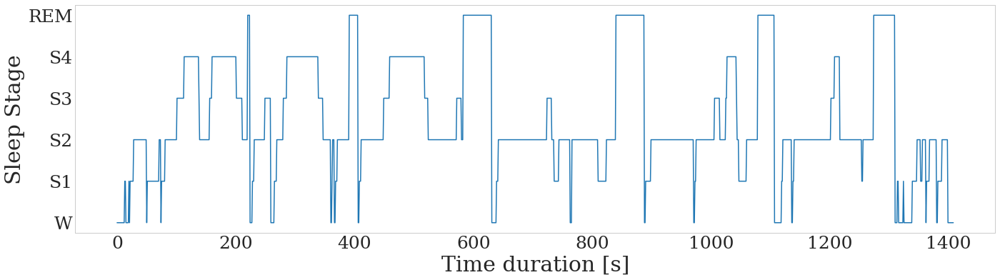

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/brux2_hypno shape (1507, 14)


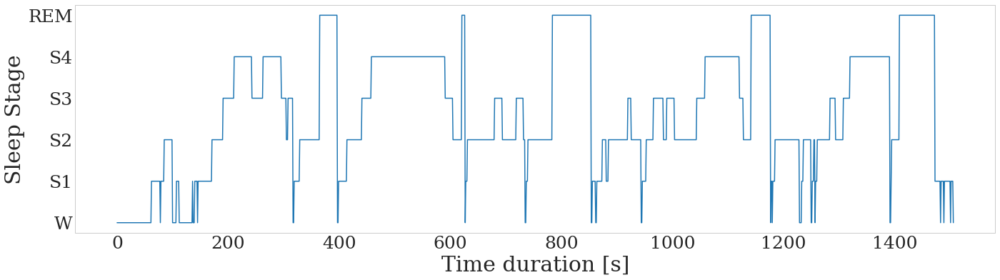

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/sdb1_hypno shape (1037, 14)


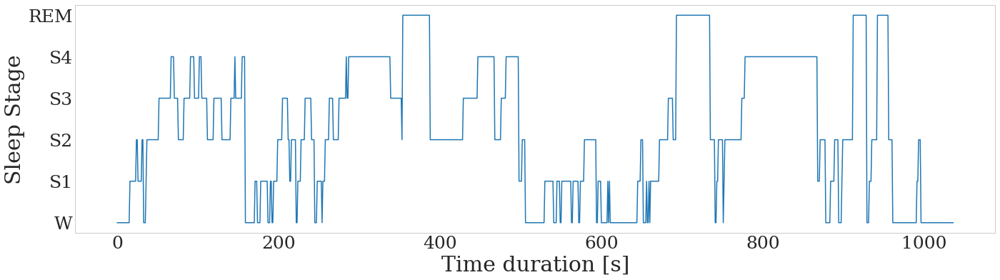

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/sdb2_hypno shape (1534, 14)


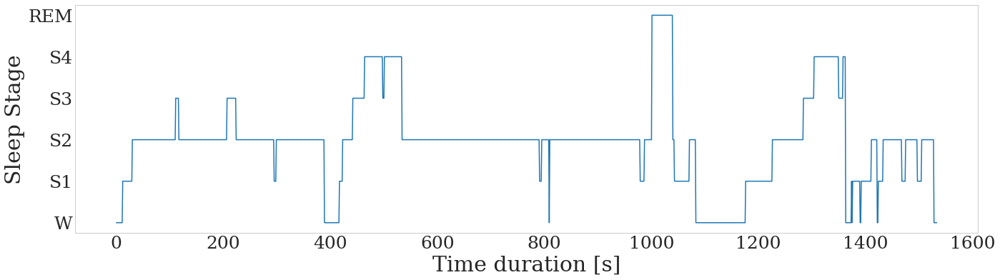

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/sdb3_hypno shape (1184, 14)


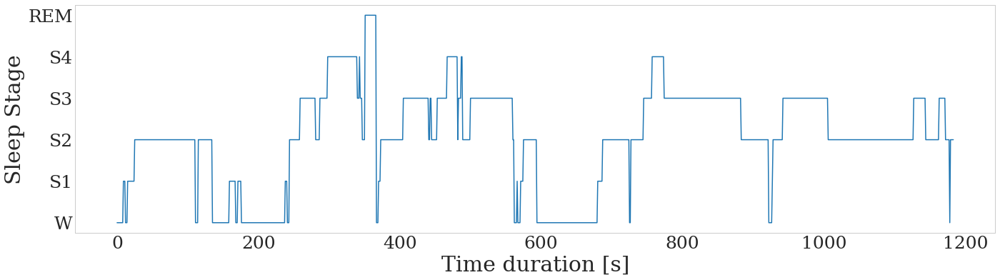

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/sdb4_hypno shape (1909, 14)


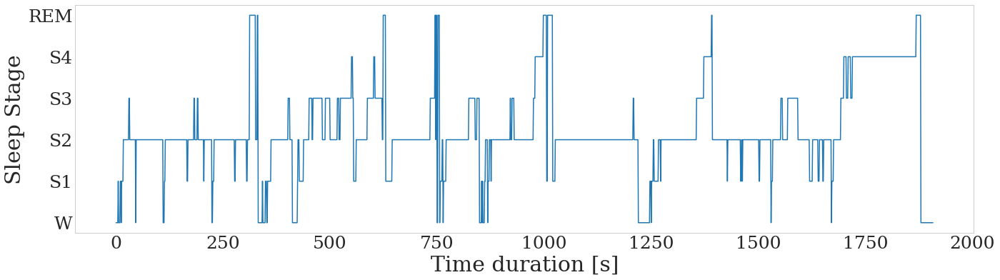

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/ins1_hypno shape (1221, 14)


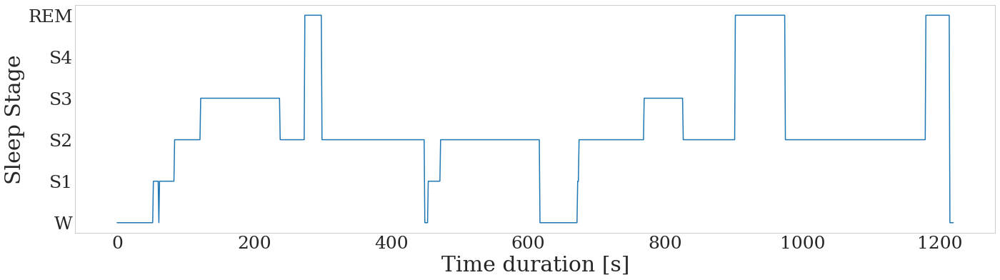

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/ins2_hypno shape (1218, 14)


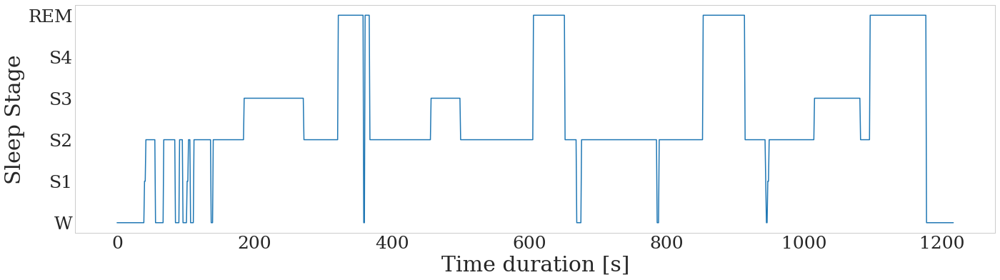

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/ins3_hypno shape (1154, 14)


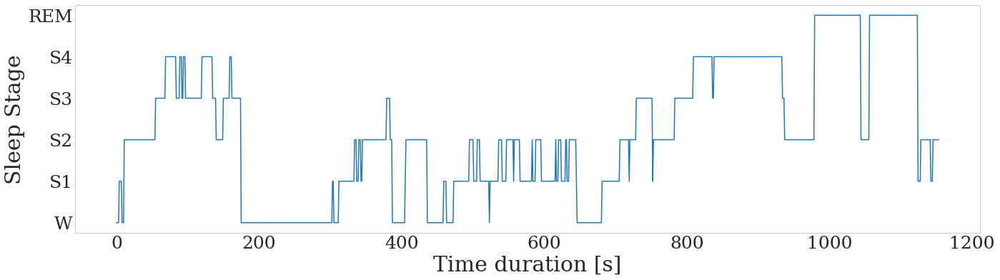

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/ins4_hypno shape (1072, 14)


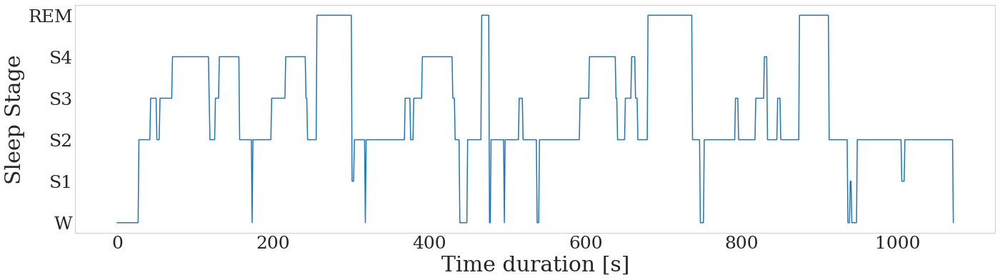

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/ins5_hypno shape (1388, 14)


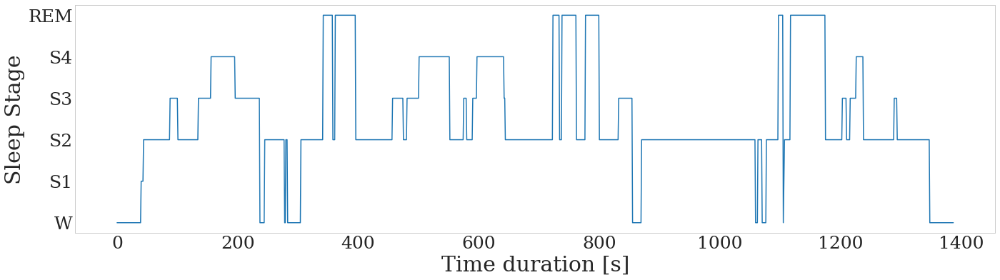

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/ins6_hypno shape (1208, 14)


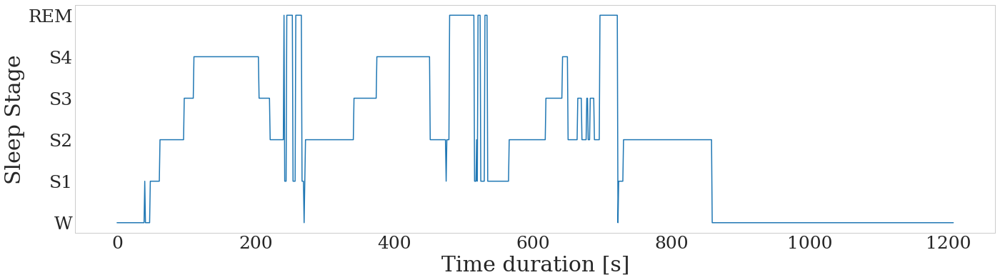

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/ins7_hypno shape (1451, 14)


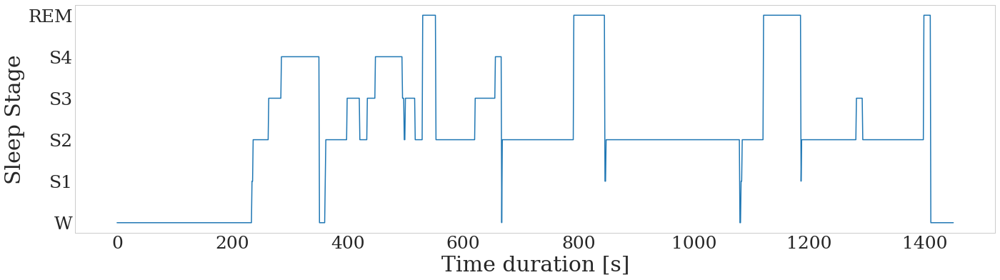

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/ins8_hypno shape (1245, 14)


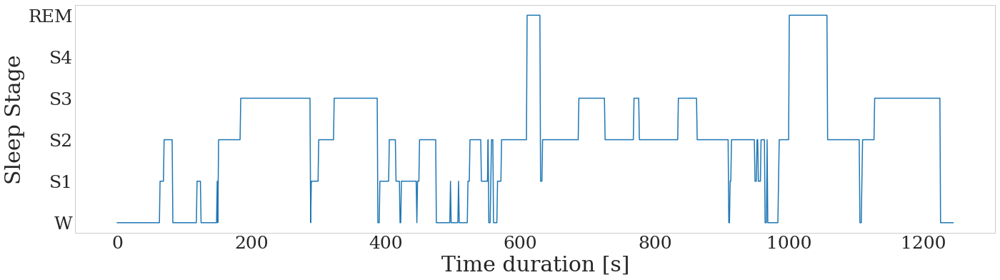

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/ins9_hypno shape (1325, 14)


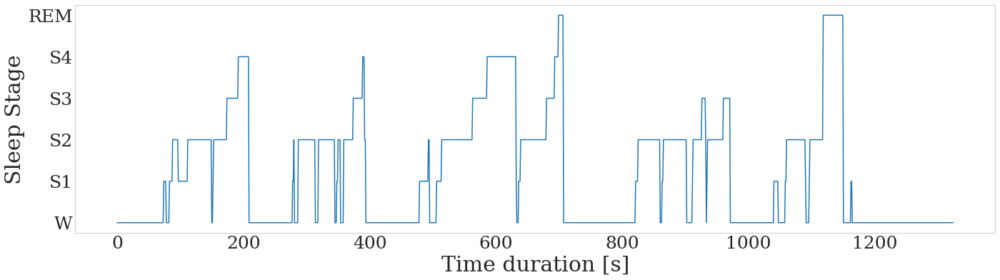

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/narco1_hypno shape (1315, 14)


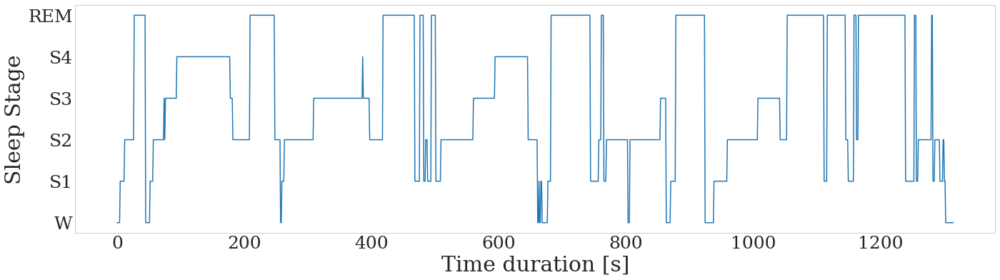

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/narco2_hypno shape (1949, 14)


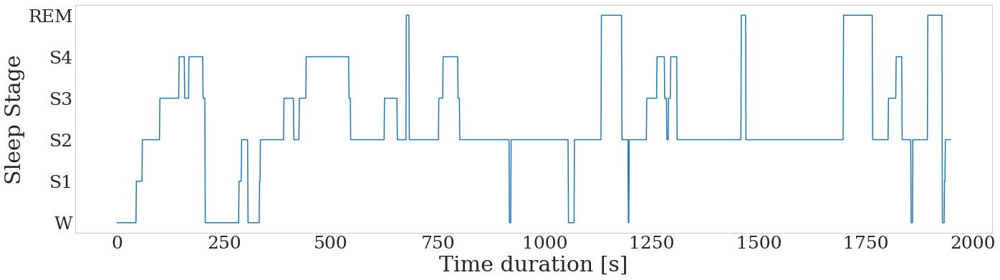

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/narco3_hypno shape (1762, 14)


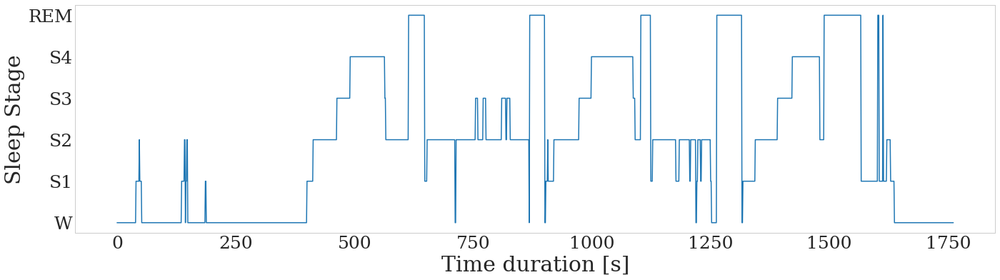

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/narco4_hypno shape (1509, 14)


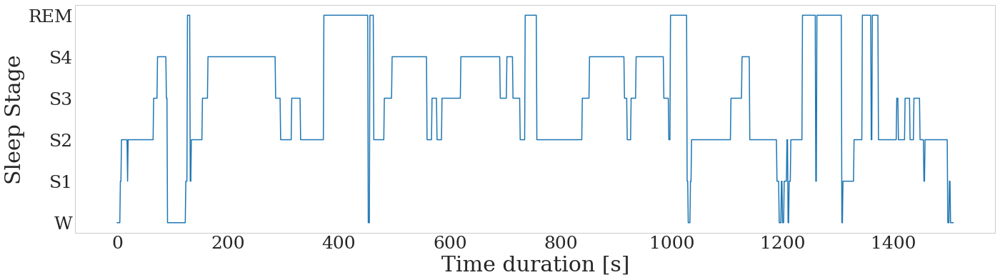

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/narco5_hypno shape (1013, 14)


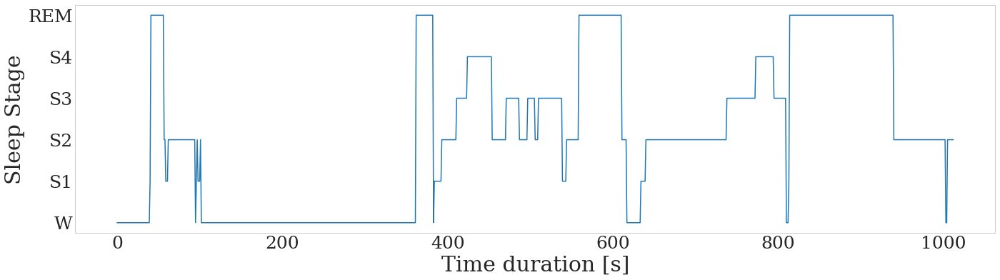

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle1_hypno shape (1546, 14)


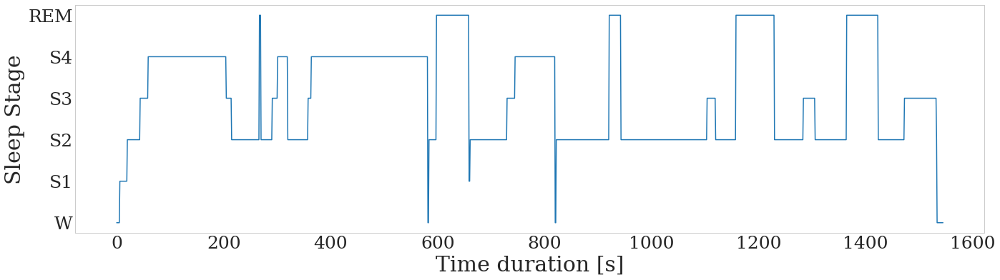

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle2_hypno shape (1548, 14)


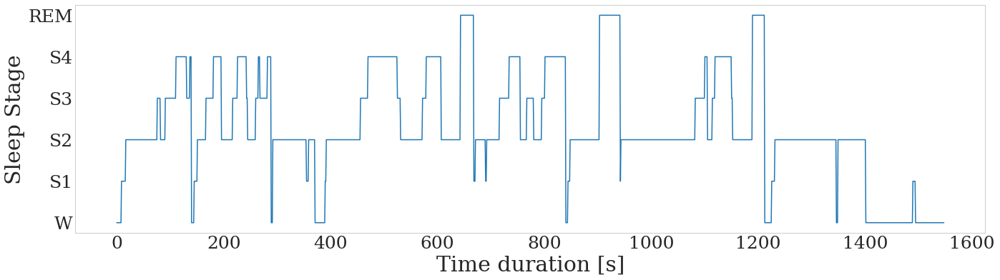

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle3_hypno shape (1573, 14)


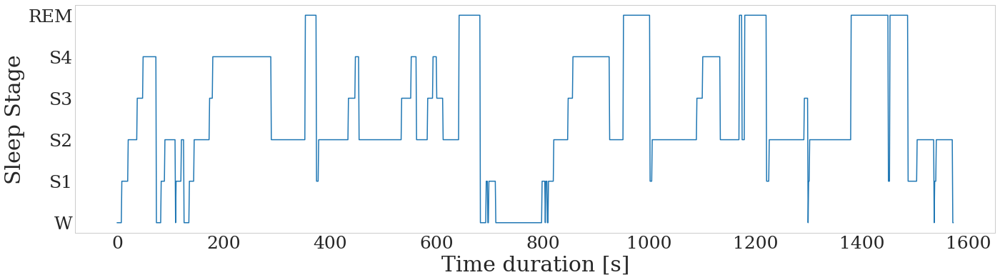

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle4_hypno shape (1704, 14)


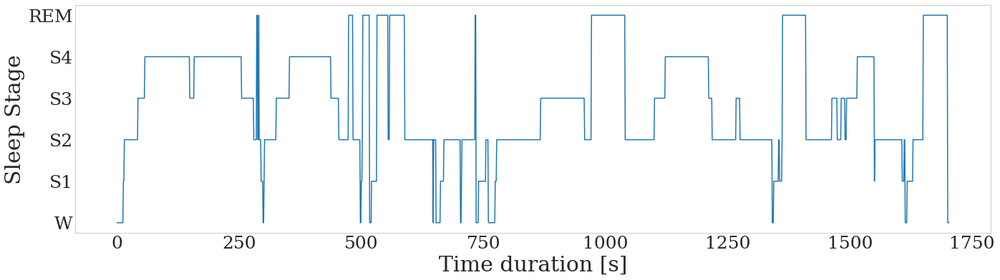

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle5_hypno shape (1659, 14)


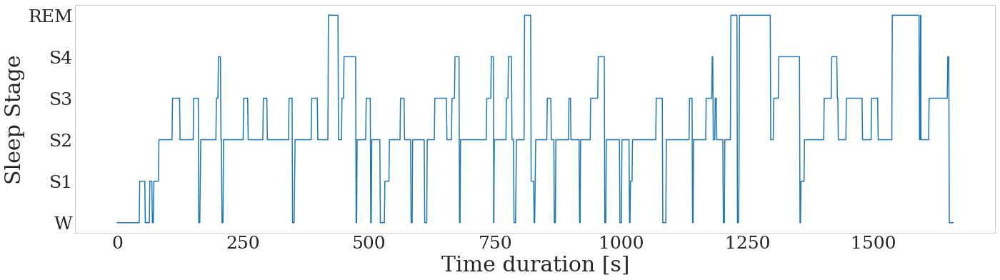

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle6_hypno shape (1123, 14)


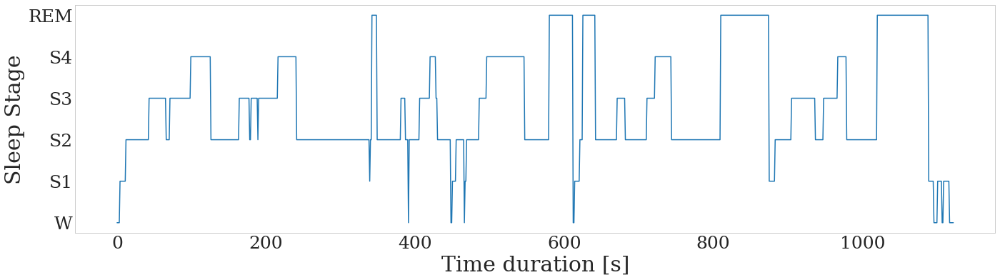

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle7_hypno shape (2009, 14)


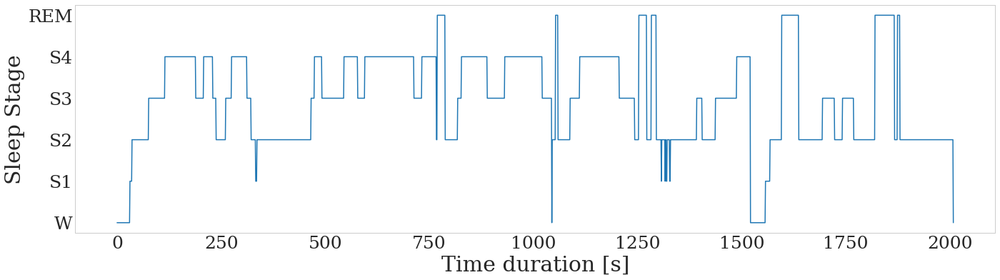

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle8_hypno shape (1455, 14)


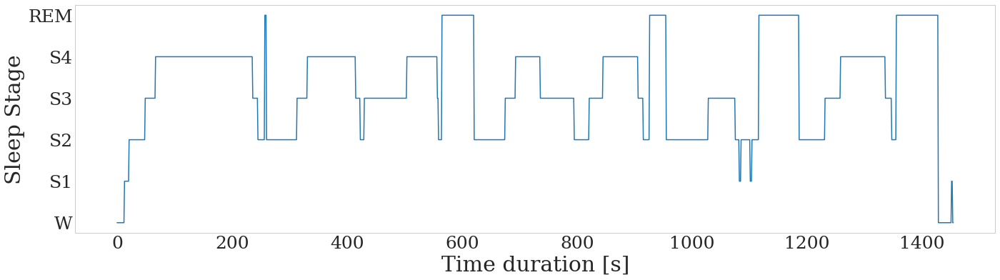

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle9_hypno shape (1700, 14)


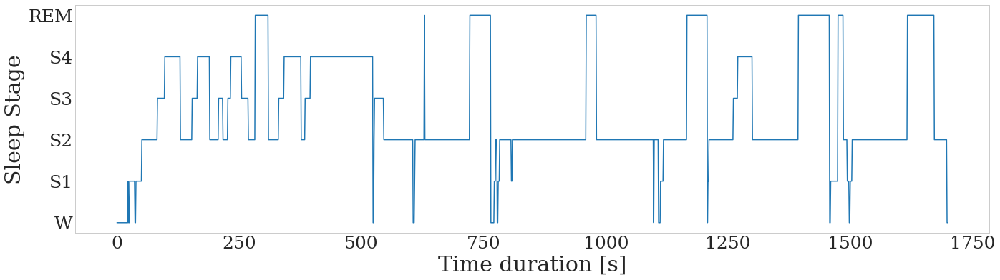

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle10_hypno shape (1441, 14)


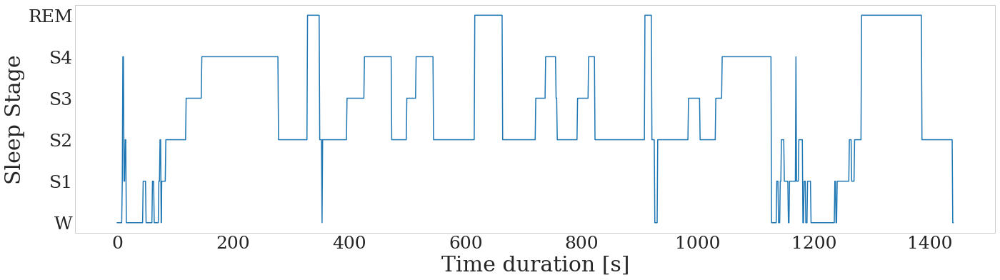

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle11_hypno shape (1569, 14)


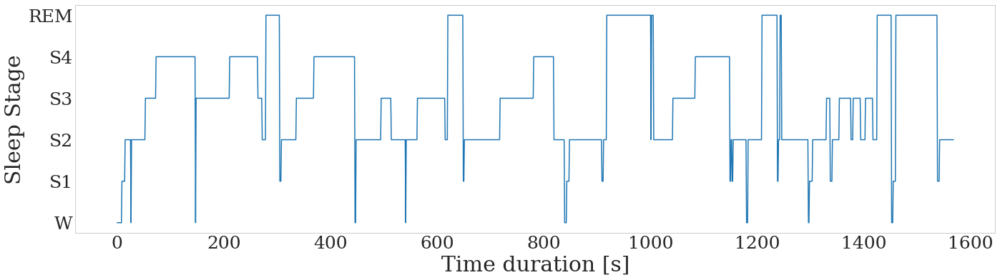

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle12_hypno shape (1620, 14)


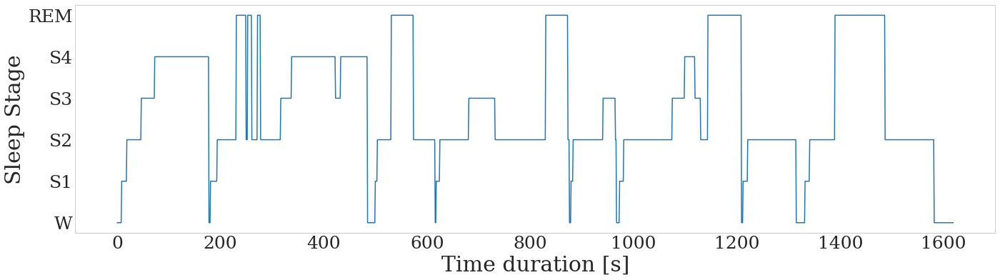

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle13_hypno shape (1863, 14)


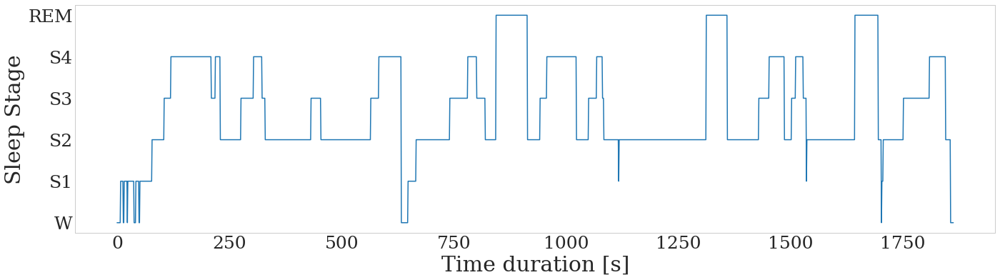

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle14_hypno shape (1394, 14)


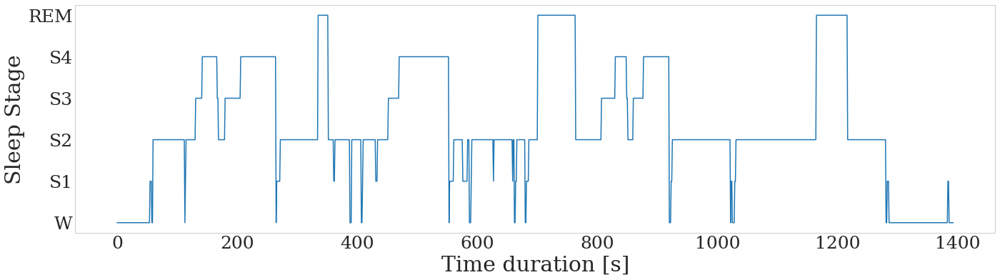

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle15_hypno shape (1623, 14)


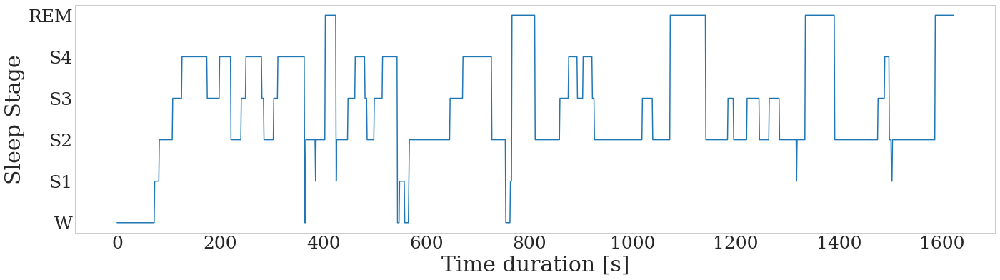

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle16_hypno shape (1639, 14)


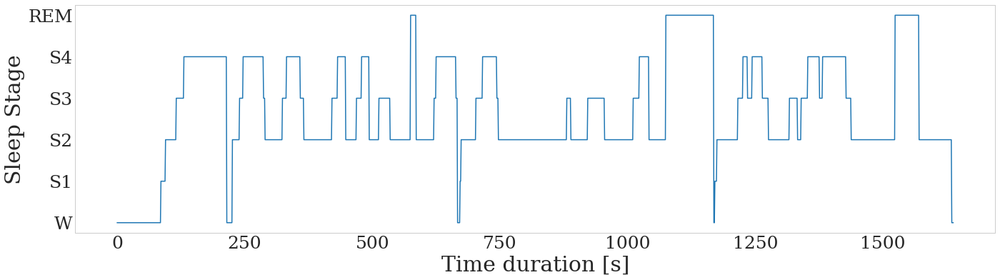

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle17_hypno shape (1475, 14)


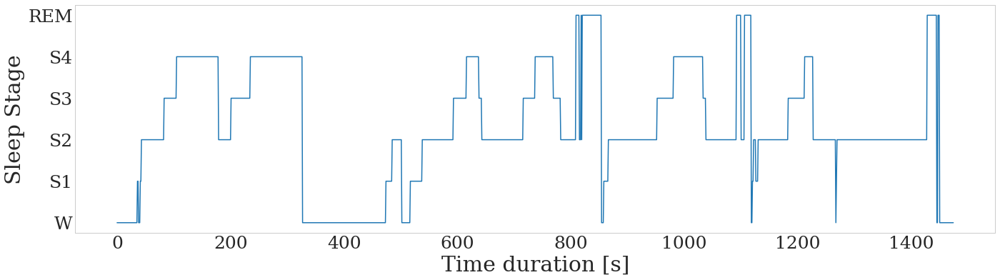

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle18_hypno shape (1648, 14)


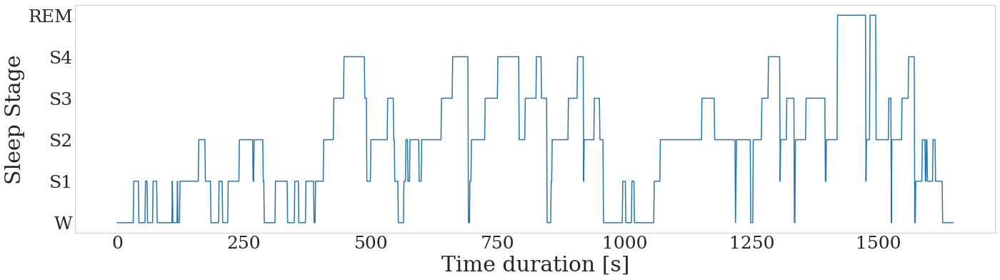

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle19_hypno shape (1562, 14)


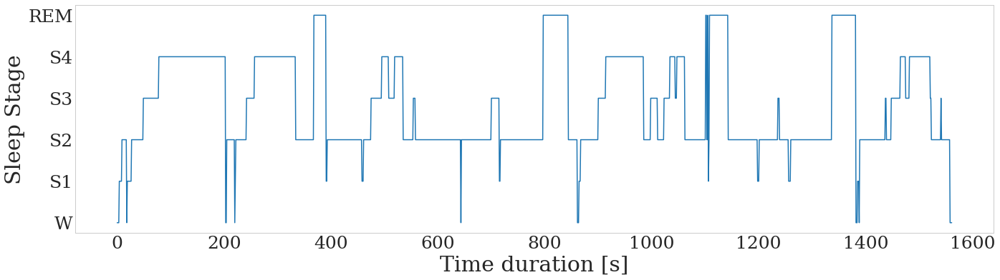

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle20_hypno shape (1455, 14)


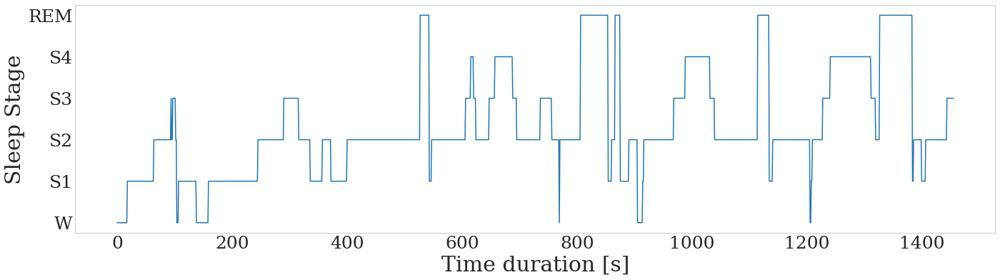

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle21_hypno shape (2032, 14)


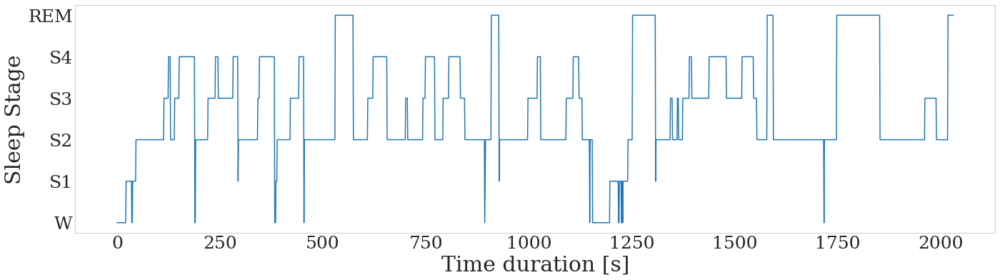

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle22_hypno shape (1729, 14)


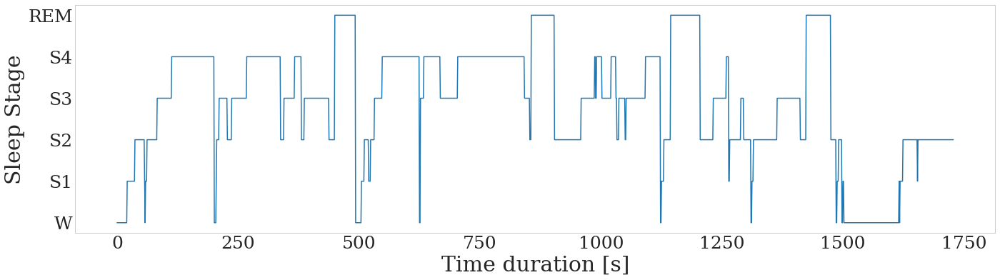

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle23_hypno shape (1510, 14)


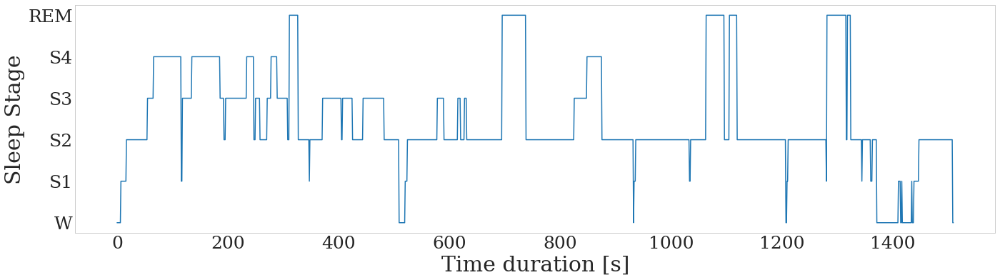

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle24_hypno shape (1542, 14)


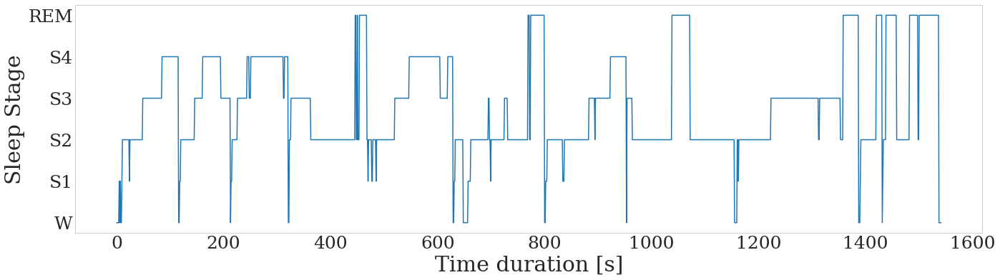

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle25_hypno shape (1329, 14)


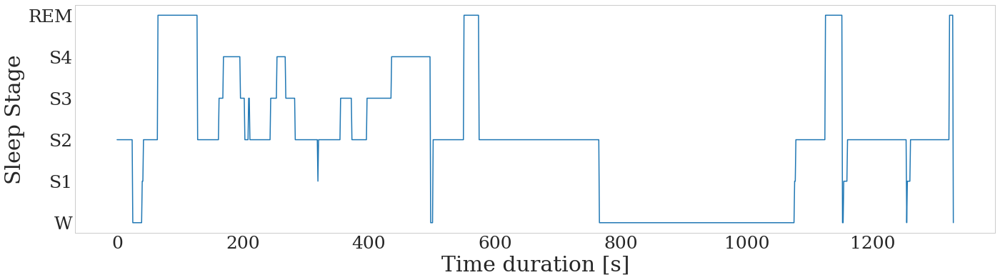

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle26_hypno shape (1401, 14)


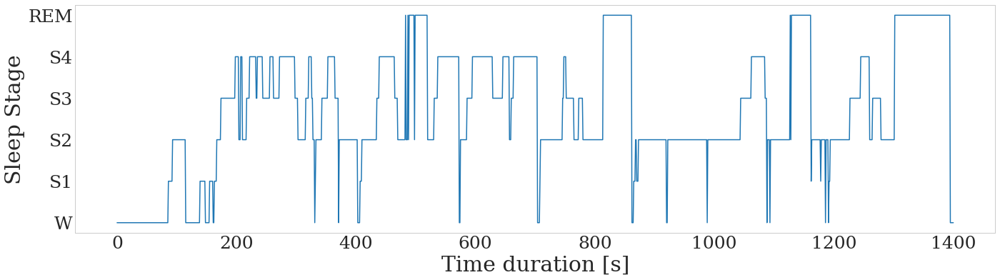

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle27_hypno shape (1199, 14)


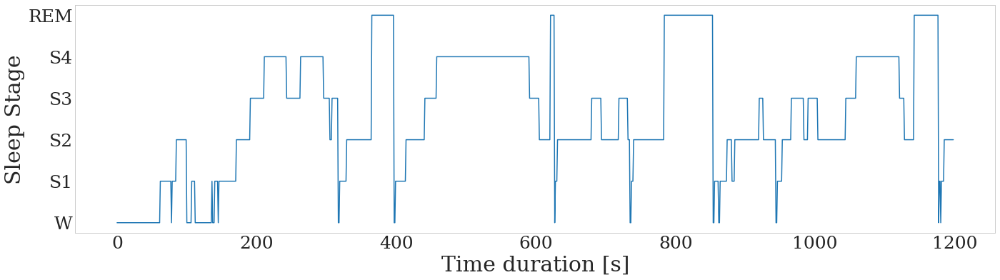

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle28_hypno shape (1622, 14)


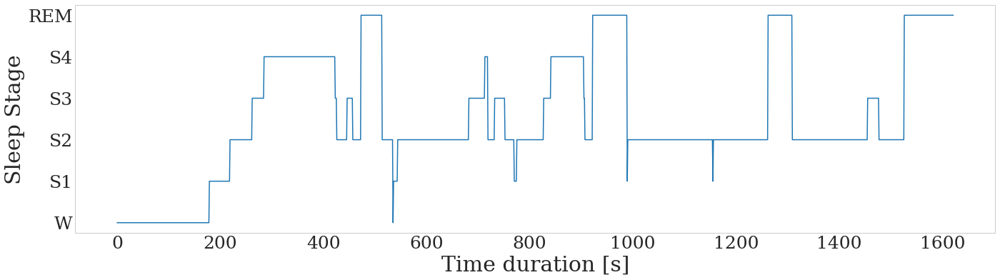

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle29_hypno shape (1524, 14)


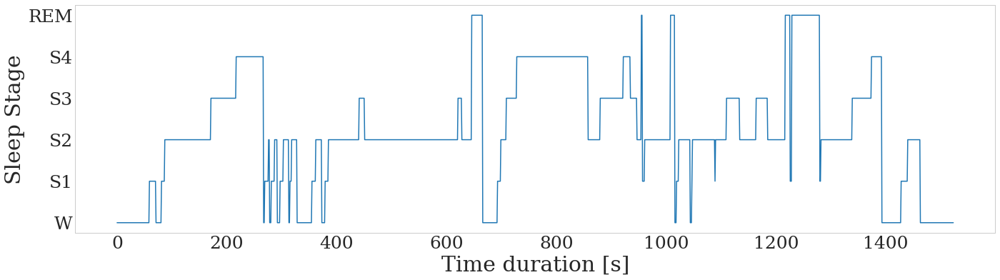

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle30_hypno shape (1466, 14)


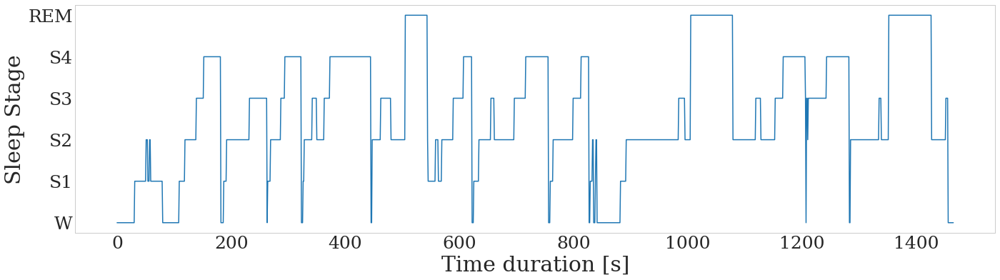

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle31_hypno shape (1294, 14)


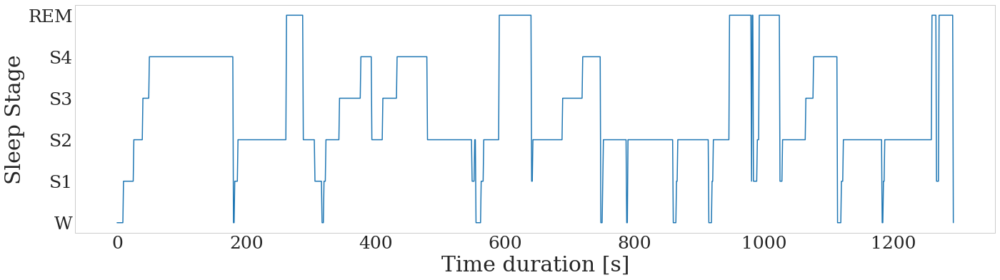

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle32_hypno shape (1658, 14)


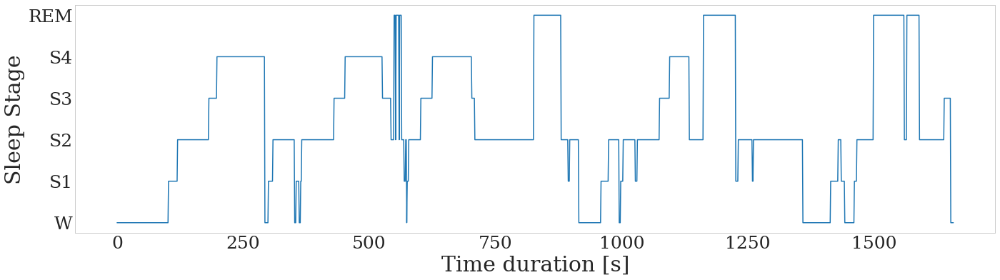

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle33_hypno shape (1601, 14)


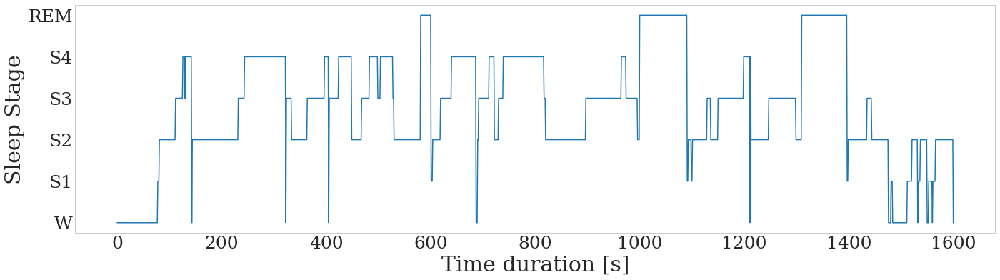

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle34_hypno shape (1502, 14)


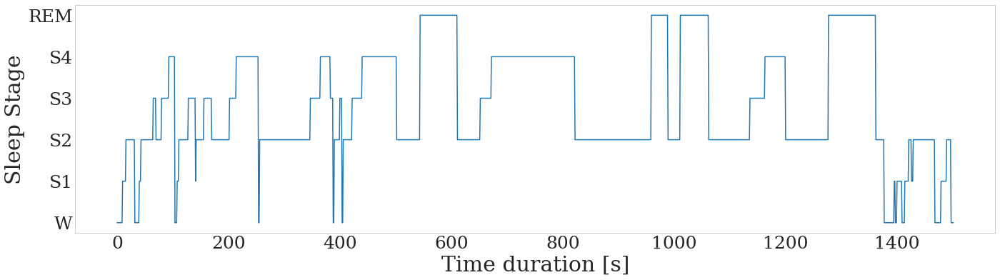

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle35_hypno shape (1275, 14)


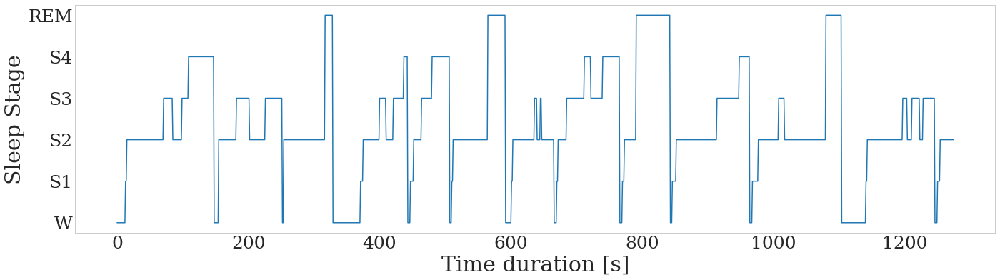

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle36_hypno shape (1476, 14)


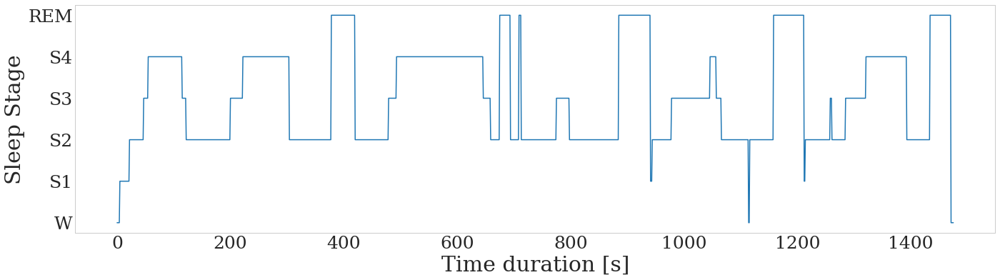

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle37_hypno shape (1495, 14)


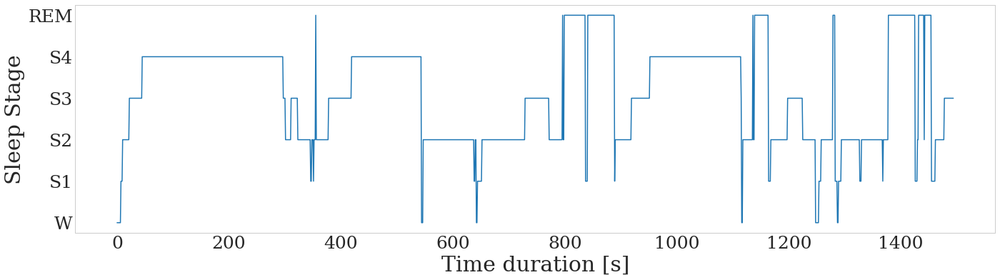

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle38_hypno shape (1546, 14)


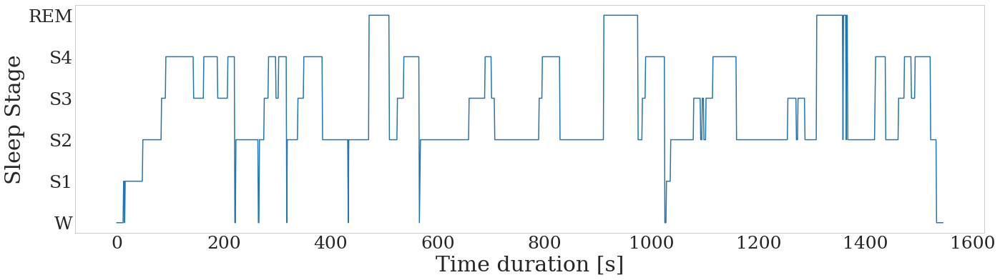

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle39_hypno shape (1449, 14)


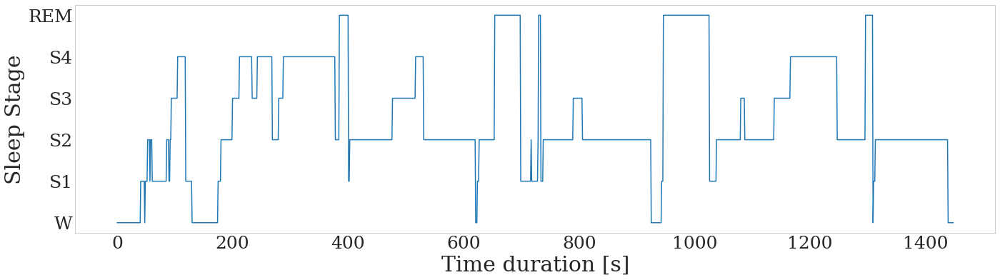

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/nfle40_hypno shape (1857, 14)


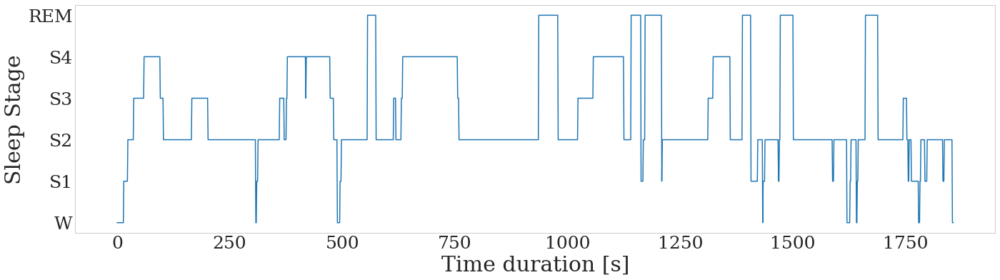

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/plm1_hypno shape (1388, 14)


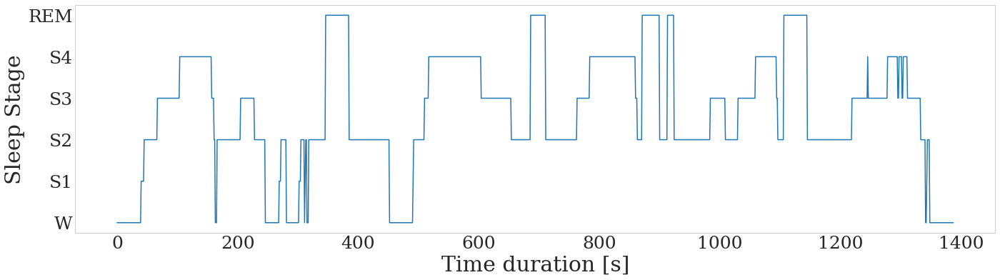

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/plm2_hypno shape (1283, 14)


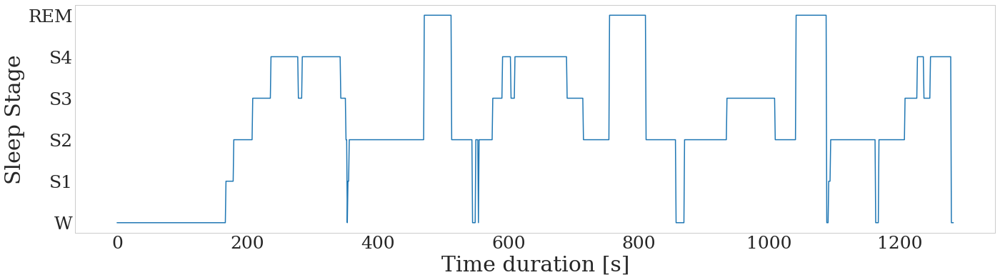

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/plm3_hypno shape (1595, 14)


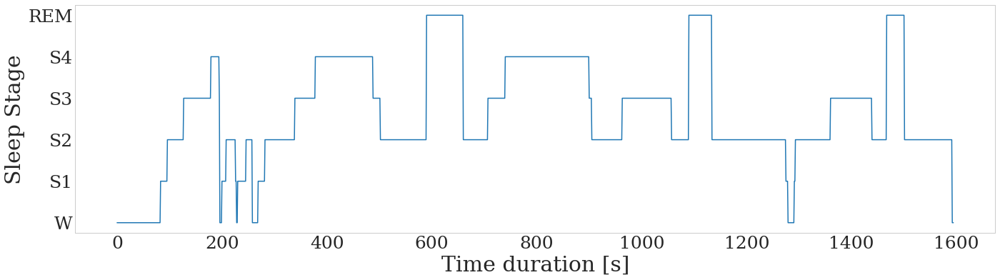

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/plm4_hypno shape (1300, 14)


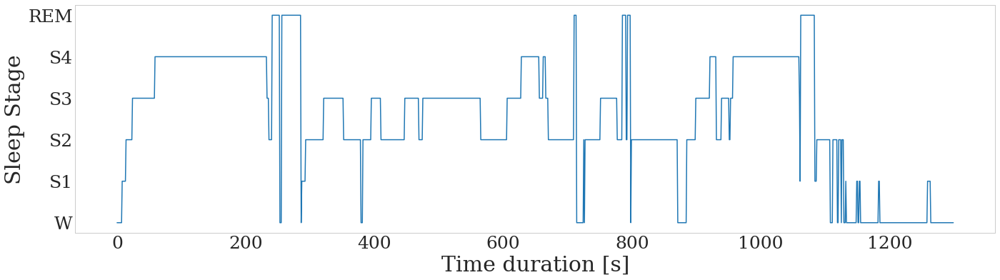

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/plm5_hypno shape (1255, 14)


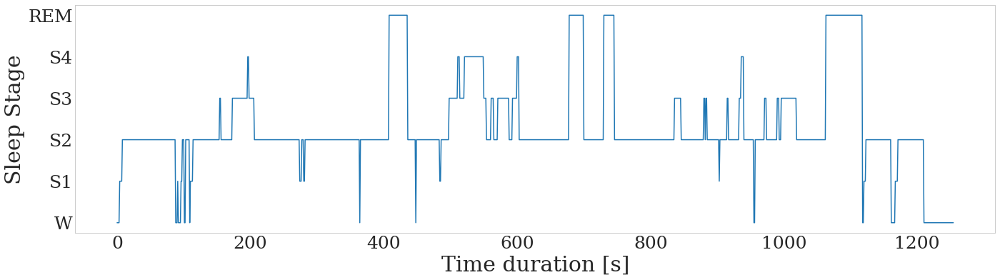

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/plm6_hypno shape (1042, 14)


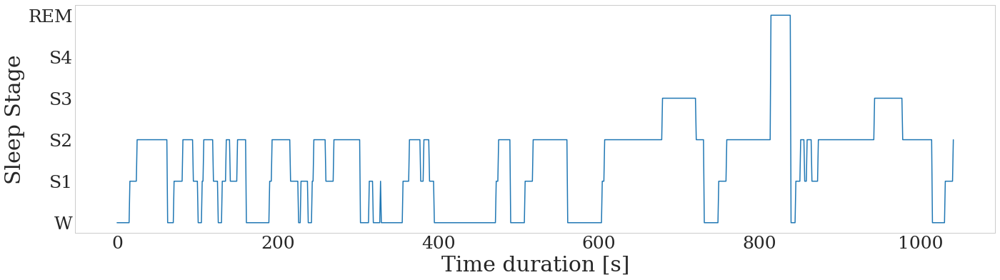

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/plm7_hypno shape (1392, 14)


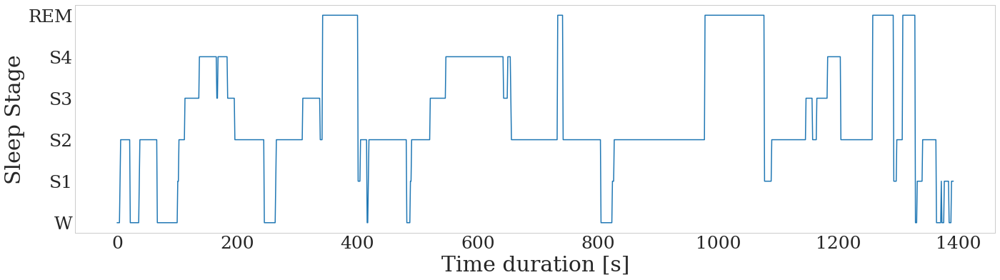

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/plm8_hypno shape (1188, 14)


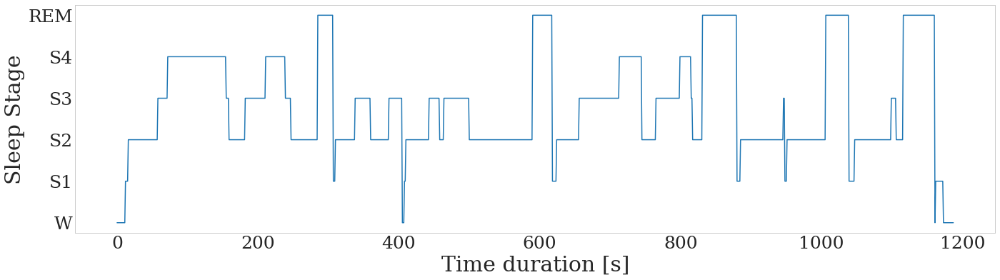

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/plm9_hypno shape (1339, 14)


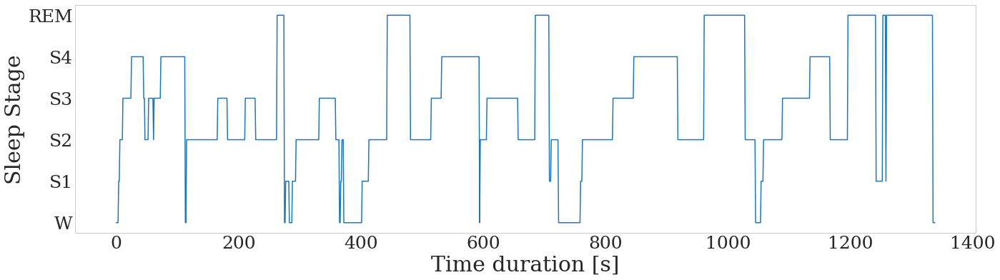

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/plm10_hypno shape (1471, 14)


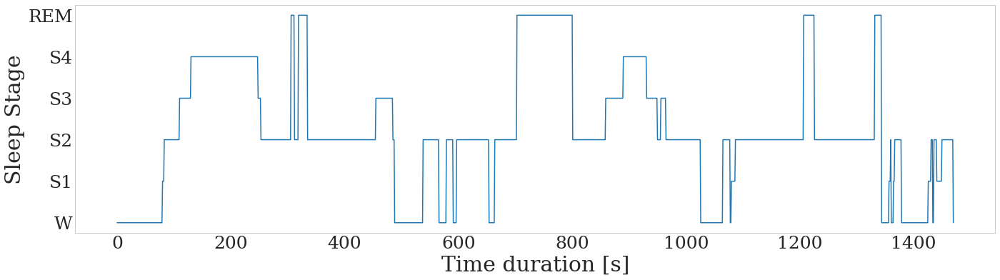

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd1_hypno shape (926, 14)


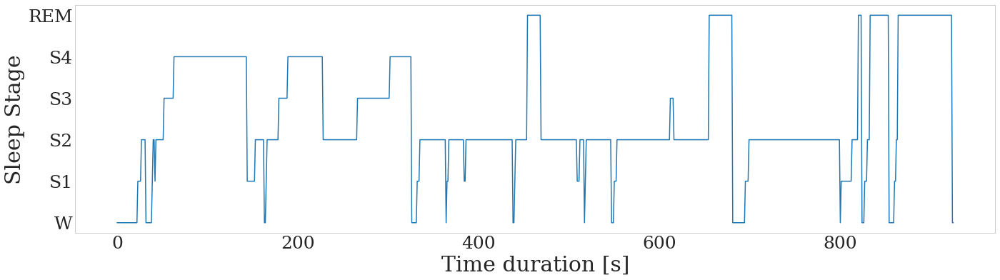

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd2_hypno shape (1911, 14)


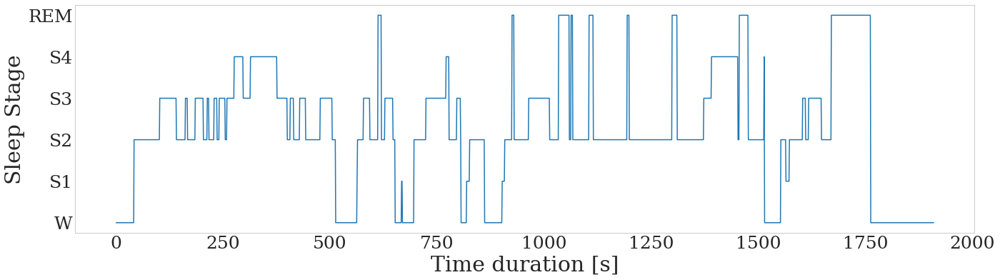

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd3_hypno shape (1763, 14)


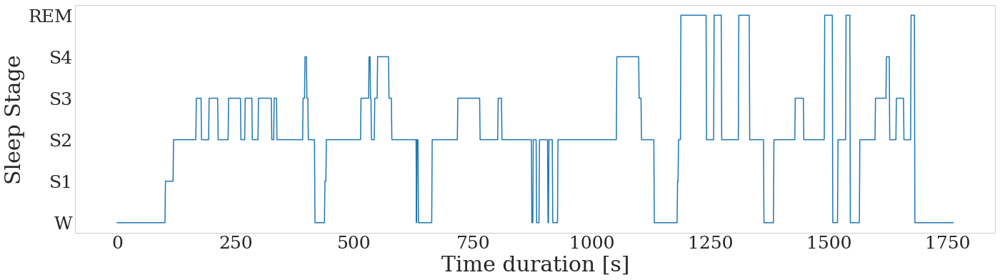

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd4_hypno shape (1816, 14)


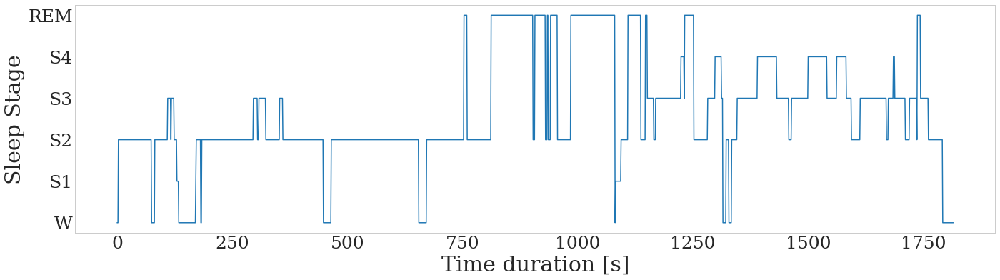

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd5_hypno shape (1710, 14)


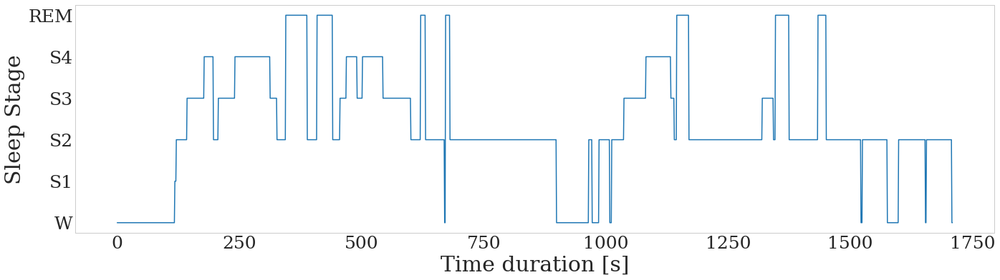

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd6_hypno shape (960, 14)


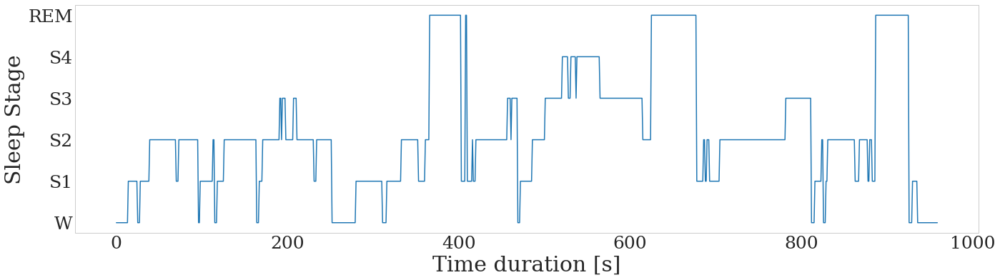

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd7_hypno shape (1412, 14)


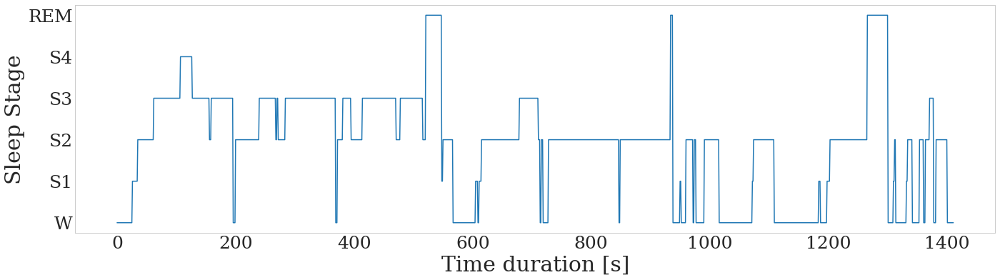

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd8_hypno shape (1656, 14)


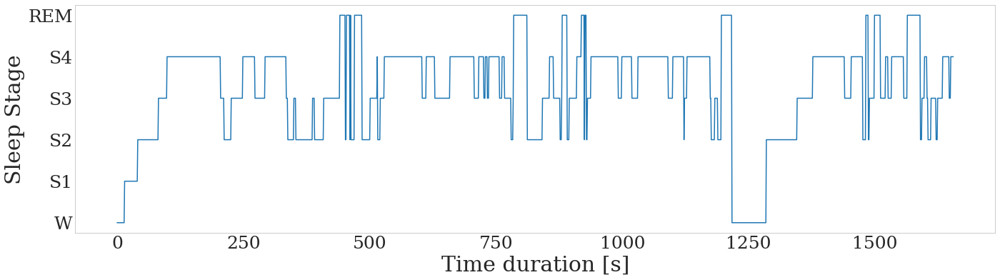

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd9_hypno shape (1447, 14)


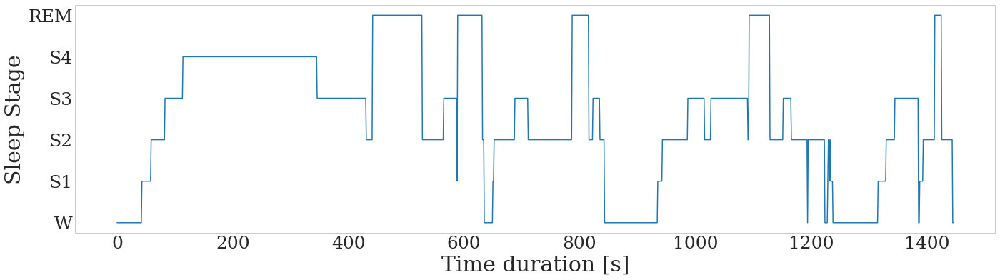

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd10_hypno shape (1065, 14)


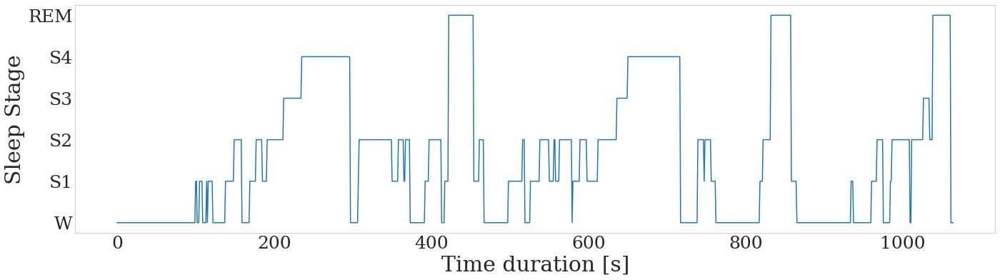

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd11_hypno shape (1061, 14)


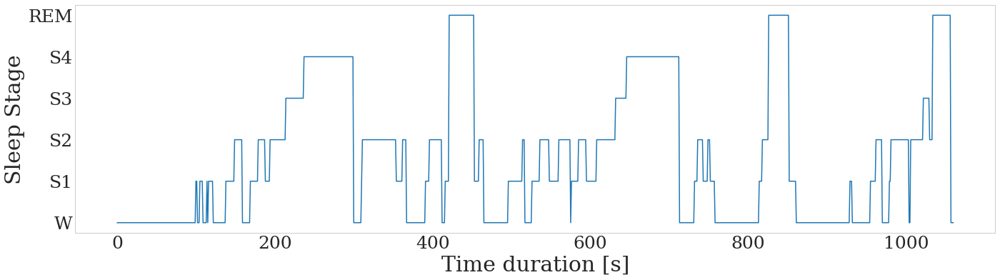

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd12_hypno shape (1427, 14)


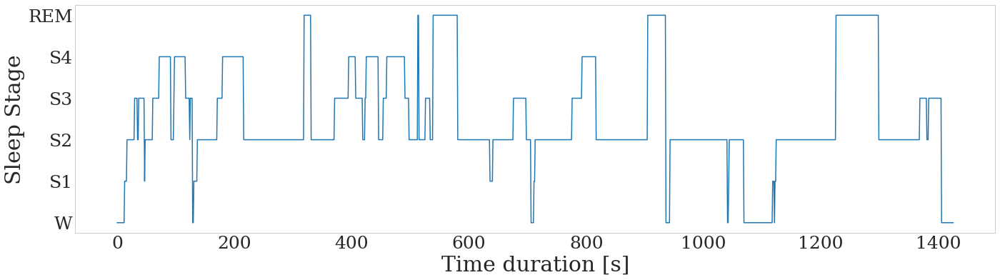

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd13_hypno shape (1496, 14)


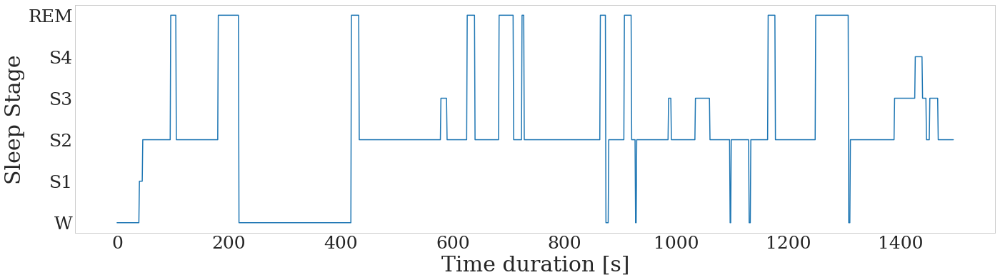

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd14_hypno shape (1534, 14)


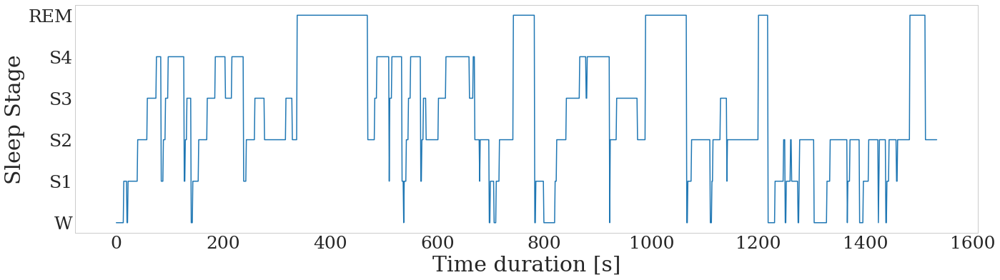

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd15_hypno shape (1232, 14)


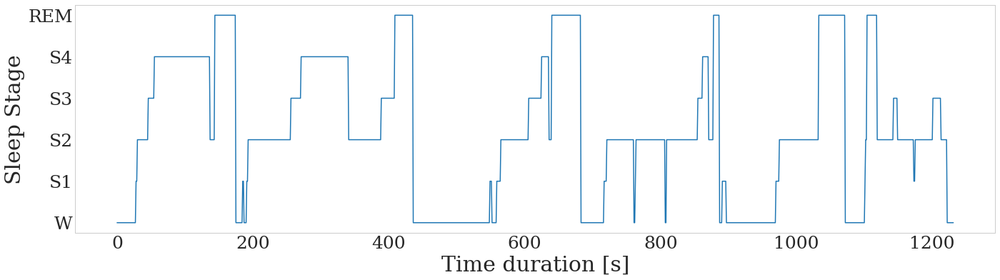

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd16_hypno shape (1540, 14)


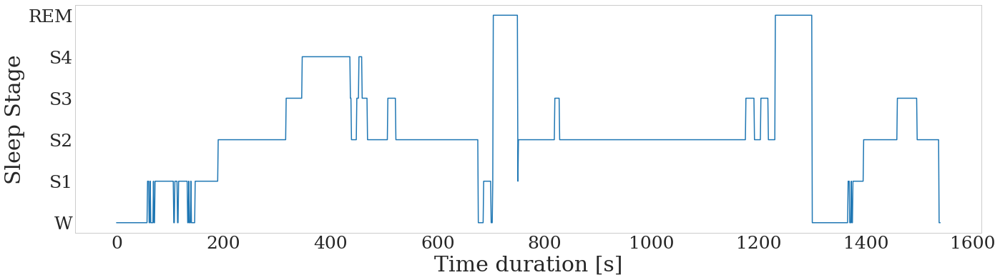

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd17_hypno shape (1596, 14)


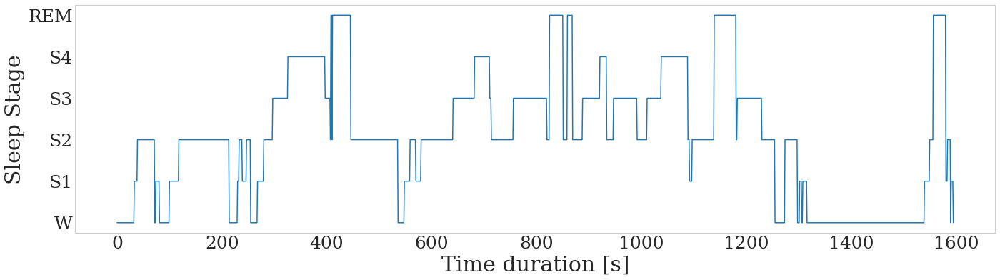

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd18_hypno shape (1292, 14)


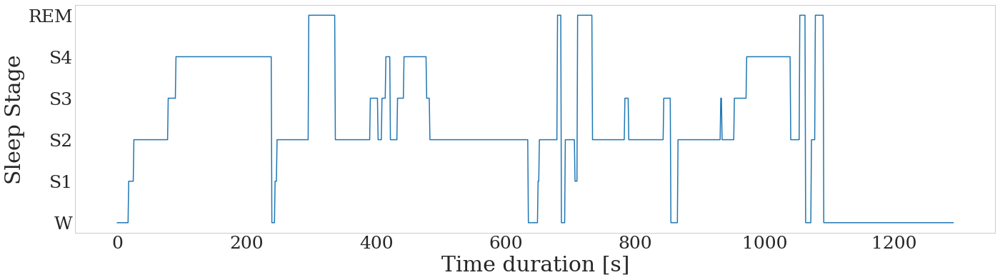

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd19_hypno shape (1475, 14)


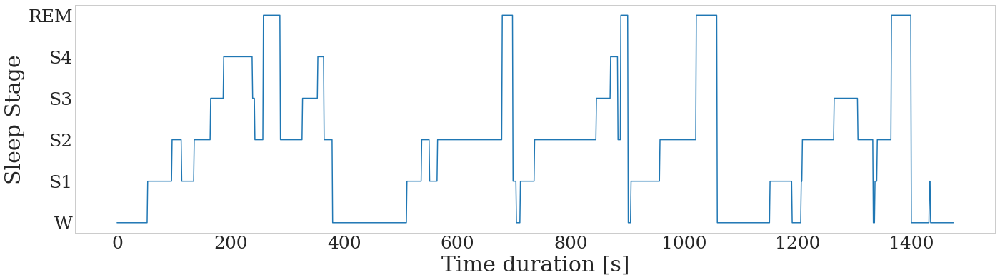

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd20_hypno shape (1119, 14)


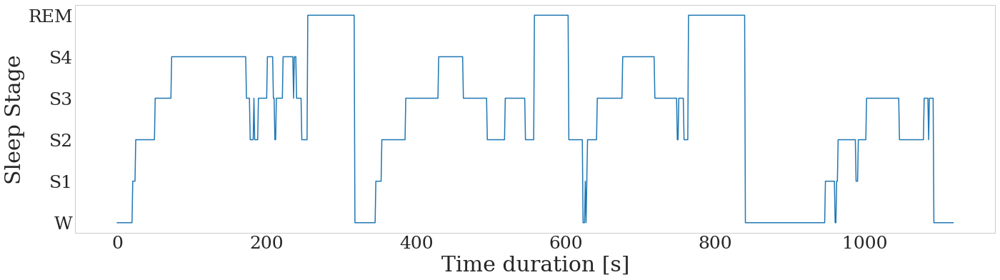

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd21_hypno shape (1657, 14)


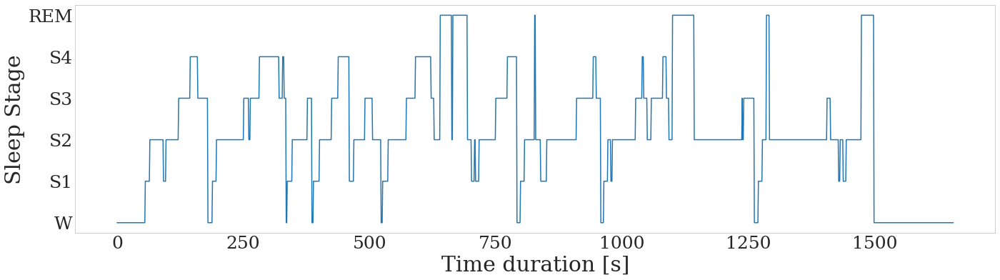

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/rbd22_hypno shape (1516, 14)


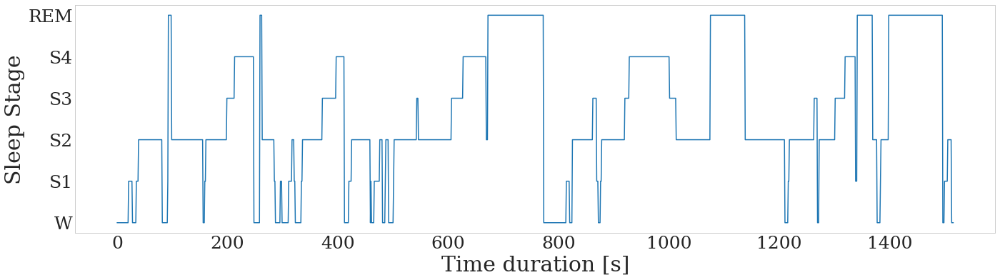

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n1_hypno shape (1672, 14)


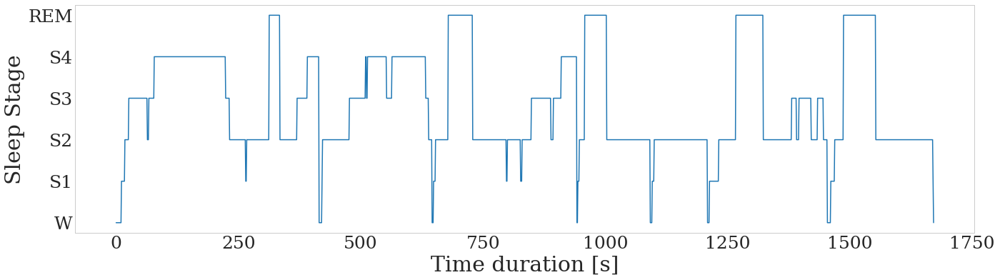

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n2_hypno shape (1350, 14)


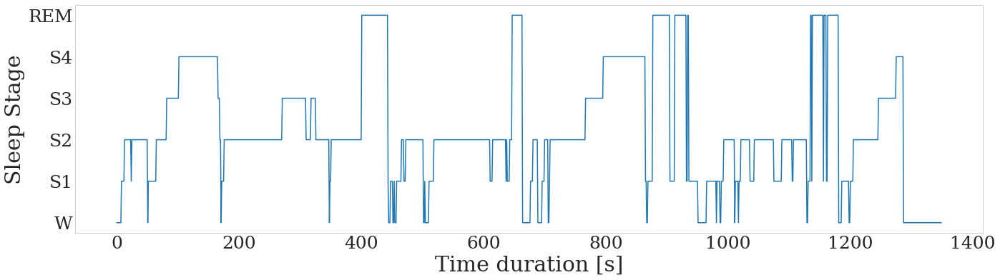

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n3_hypno shape (1352, 14)


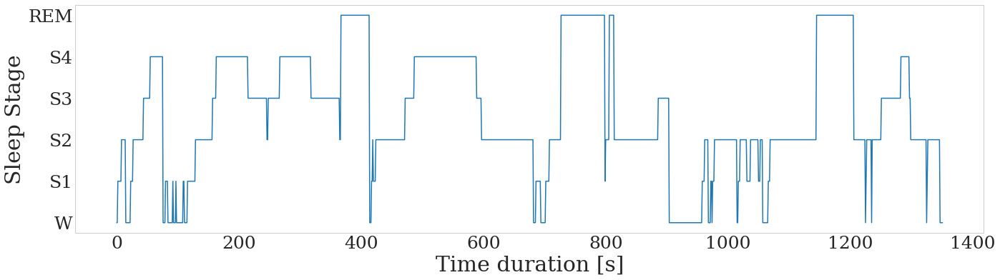

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n4_hypno shape (1244, 14)


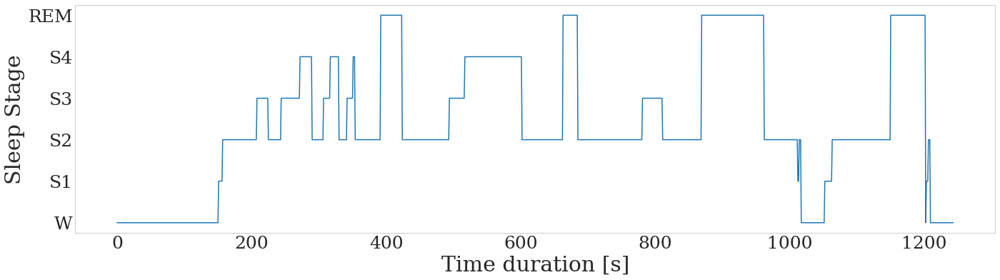

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n5_hypno shape (1552, 14)


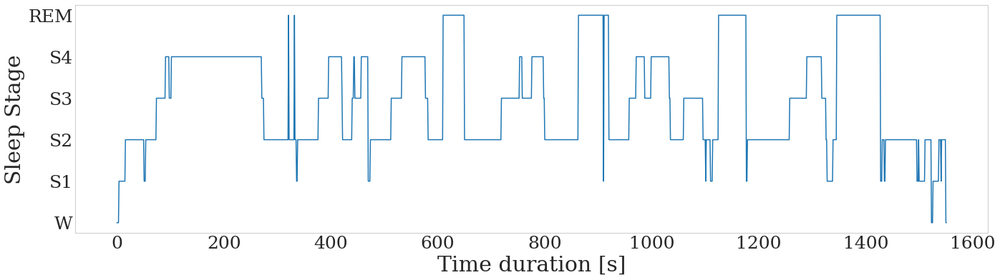

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n6_hypno shape (1534, 14)


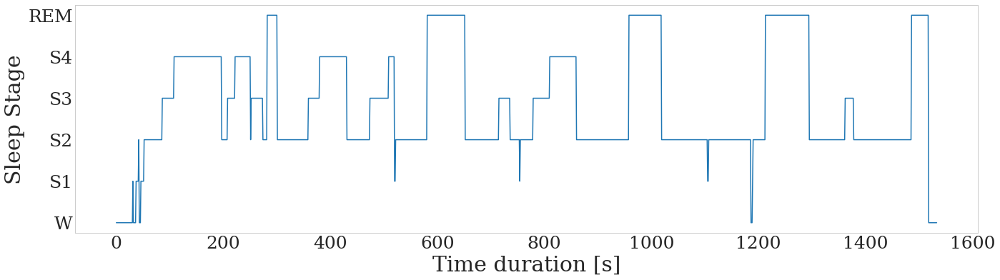

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n7_hypno shape (1413, 14)


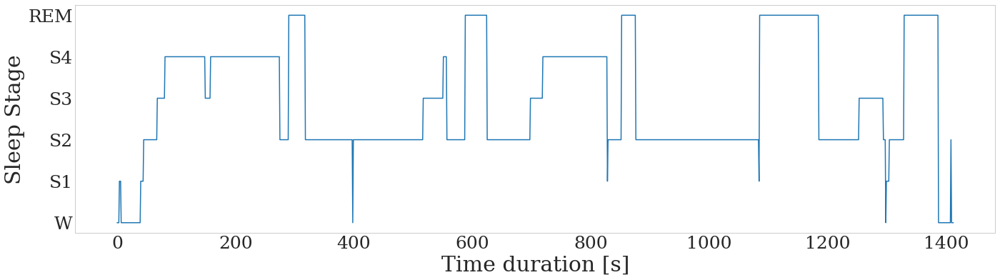

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n8_hypno shape (1430, 14)


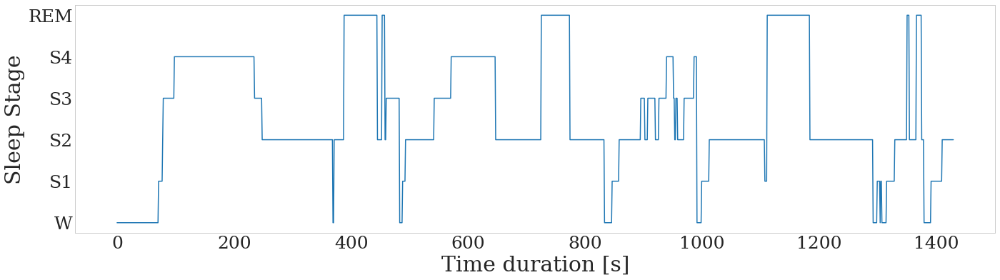

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n9_hypno shape (1334, 14)


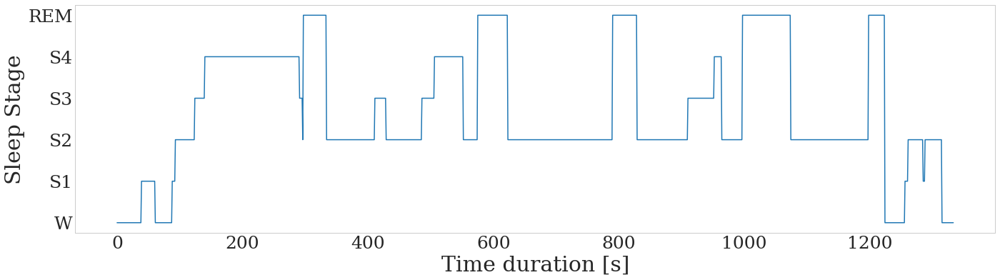

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n10_hypno shape (1109, 14)


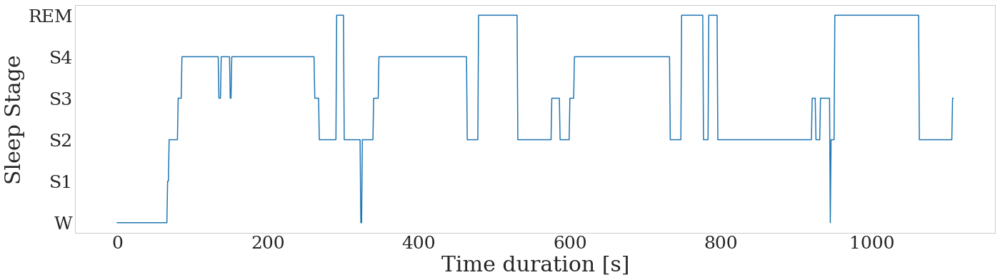

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n11_hypno shape (1414, 14)


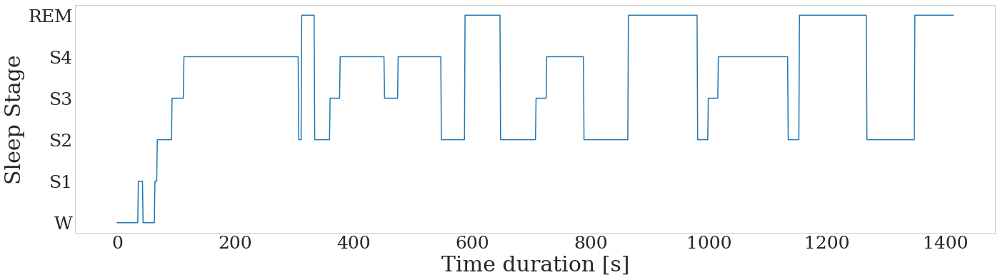

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n12_hypno shape (1240, 14)


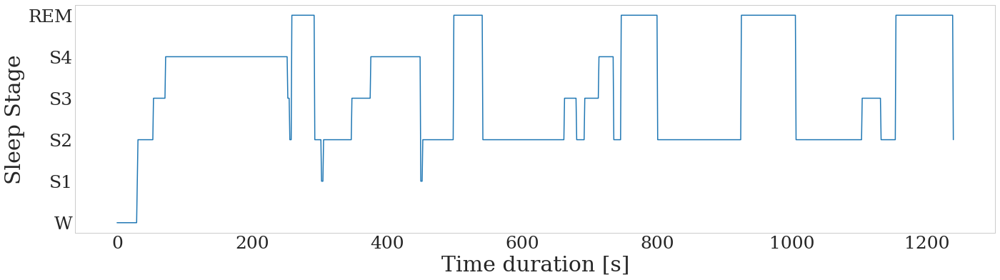

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n13_hypno shape (1422, 14)


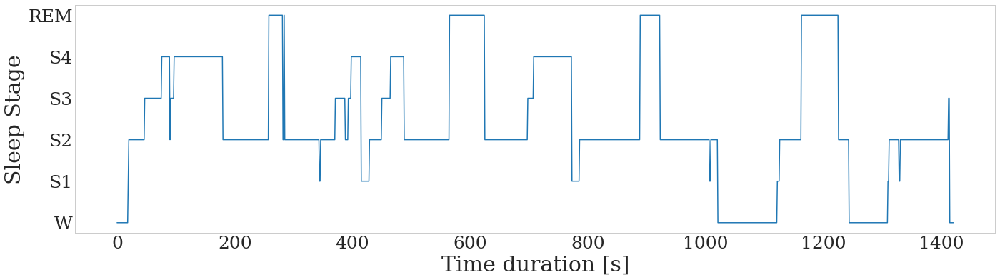

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n14_hypno shape (1362, 14)


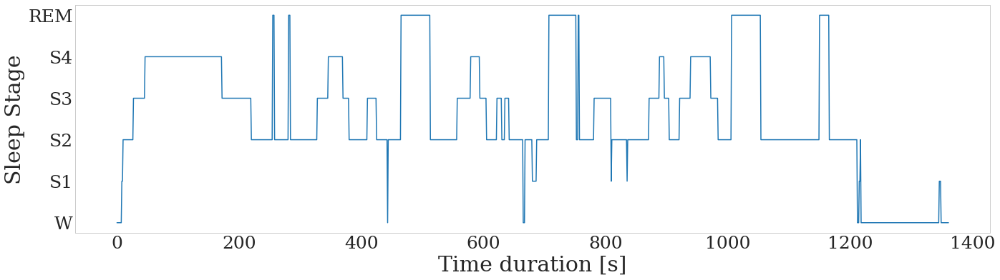

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n15_hypno shape (1446, 14)


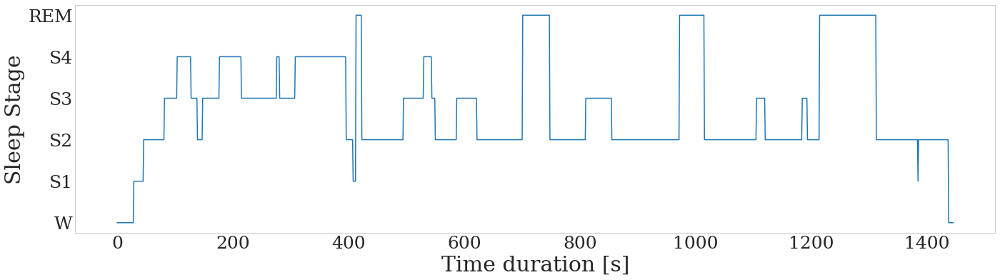

====== ./Results/CAP_Sleep/STP_From_All_Stages/Hypnograms_TrimW/n16_hypno shape (1547, 14)


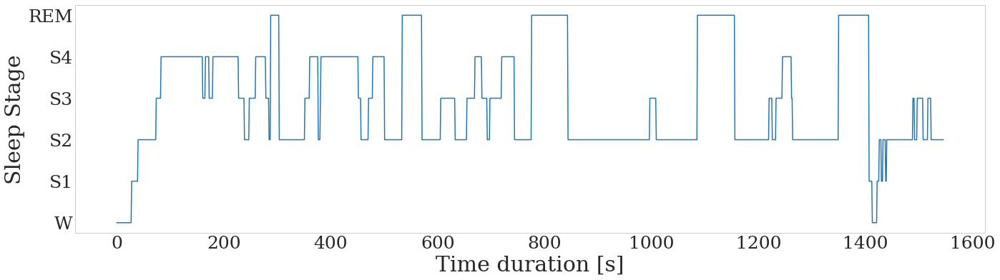

In [637]:
draw_all_hypnograms()

##### Check the annotation symbols in all files

In [638]:
# for annot_csv in list_of_annot_csvs:
#     annot_df = pd.read_csv(annot_csv)
#     print(annot_csv, annot_df["Sleep Stage"].unique())

### Sample hypnogram

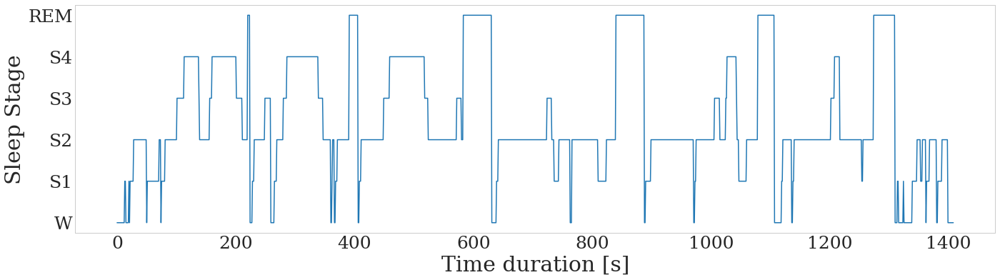

In [639]:
# list_of_files[0]
save_file_name_test, annot_df_test = get_annot_data_for_hypnogram(all_annot_df, "brux1") 
draw_hypnogram(save_file_name_test, annot_df_test) 

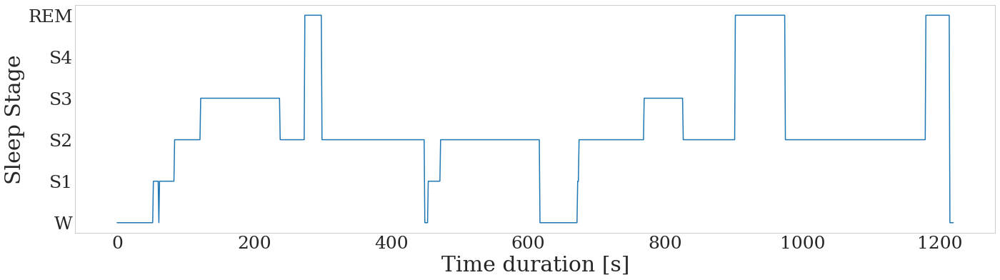

In [640]:
# list_of_files[3]
save_file_name_test, annot_df_test = get_annot_data_for_hypnogram(all_annot_df, "ins1") 
draw_hypnogram(save_file_name_test, annot_df_test) 

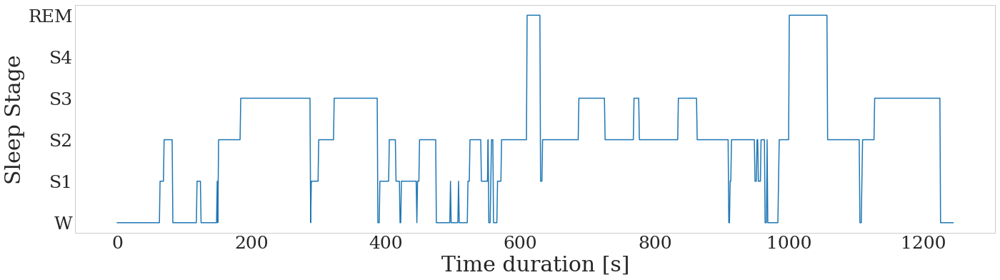

In [641]:
# list_of_files[3]
save_file_name_test, annot_df_test = get_annot_data_for_hypnogram(all_annot_df, "ins8") 
draw_hypnogram(save_file_name_test, annot_df_test) 

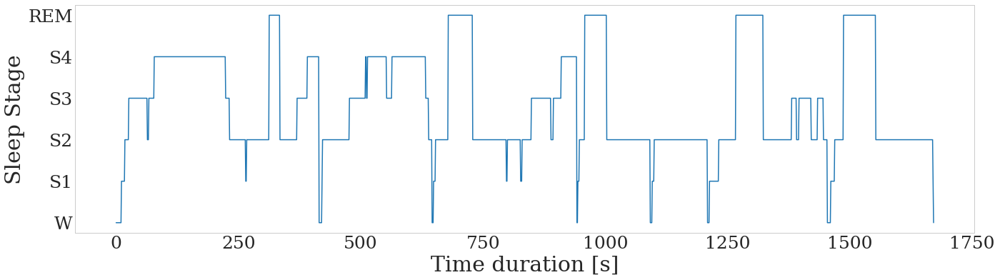

In [642]:
# list_of_files[92]
save_file_name_test, annot_df_test = get_annot_data_for_hypnogram(all_annot_df, "n1") 
draw_hypnogram(save_file_name_test, annot_df_test) 

## Sequence calculation - Save annotation sequence

In [9]:
all_annot_df

,File_Name,Category,Subject_ID,Sleep_Stage,Position,Time,Event,Duration,Location,Event_Type,Event_Level,Signal_Type,Channel
0,brux1,brux,1,W,Unknown_Position,22.18.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
1,brux1,brux,1,W,Unknown_Position,22.18.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
2,brux1,brux,1,W,Unknown_Position,22.19.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
3,brux1,brux,1,W,Unknown_Position,22.19.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
4,brux1,brux,1,W,Unknown_Position,22.20.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
156803,sdb4,sdb,4,W,Unknown_Position,07:39:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156804,sdb4,sdb,4,W,Unknown_Position,07:39:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156805,sdb4,sdb,4,W,Unknown_Position,07:40:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156806,sdb4,sdb,4,W,Unknown_Position,07:40:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC


In [10]:
def sequencer_func(x):
    result = {"File_Name":x["File_Name"].head(1).values[0], "Category":x["Category"].head(1).values[0], "Subject_ID":x["Subject_ID"].head(1).values[0], "Sleep_Stage":x["Sleep_Stage_Number"].head(1).values[0], "Stage_Count": x.shape[0], "Duration": x["Duration"].sum()}
    return pd.Series(result, name="index")


def get_annotation_sequence(annot_df):
    # print(annot_df.columns)
    annot_df["Sleep_Stage_Number"] = annot_df["Sleep_Stage"]
    annot_df["Count"] = (annot_df["Sleep_Stage_Number"] != annot_df["Sleep_Stage_Number"].shift(1)).cumsum()
    annot_seq_df = annot_df.groupby("Count",as_index=False).apply(sequencer_func)
    annot_seq_df.insert(loc=4, column="Sequence", value=annot_seq_df["Count"].values.tolist())
    annot_seq_df = annot_seq_df.drop("Count", axis=1)
    return annot_seq_df

In [19]:
def get_all_annotation_sequence():
    all_annot_seq_df = pd.DataFrame()
    for file in list_of_files:
        save_file_name, annot_df = get_annot_data_for_hypnogram(all_annot_df, file) 
        annot_seq_df = get_annotation_sequence(annot_df.copy()) 
        
        # print('======', save_file_name, "shape", annot_seq_df.shape)
        all_annot_seq_df = pd.concat([all_annot_seq_df, annot_seq_df], axis=0)
    return all_annot_seq_df

In [21]:
all_annot_seq_df = get_all_annotation_sequence()
all_annot_seq_df

index,File_Name,Category,Subject_ID,Sequence,Sleep_Stage,Stage_Count,Duration
0,brux1,brux,1,1,W,13,390
1,brux1,brux,1,2,S1,2,60
2,brux1,brux,1,3,W,5,150
3,brux1,brux,1,4,S1,1,30
4,brux1,brux,1,5,W,1,30
...,...,...,...,...,...,...,...
60,n16,n,16,61,S2,5,126
61,n16,n,16,62,S3,11,254
62,n16,n,16,63,S2,9,224
63,n16,n,16,64,S3,6,134


In [22]:
all_annot_seq_df.Subject_ID.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40], dtype=int64)

In [38]:
all_annot_seq_df

index,File_Name,Category,Subject_ID,Sequence,Sleep_Stage,Stage_Count,Duration
0,brux1,brux,1,1,W,13,390
1,brux1,brux,1,2,S1,2,60
2,brux1,brux,1,3,W,5,150
3,brux1,brux,1,4,S1,1,30
4,brux1,brux,1,5,W,1,30
...,...,...,...,...,...,...,...
60,n16,n,16,61,S2,5,126
61,n16,n,16,62,S3,11,254
62,n16,n,16,63,S2,9,224
63,n16,n,16,64,S3,6,134


In [648]:
all_annot_seq_df.to_csv(f"{result_directory}/annot_sequence{'_TrimW' if trimW_states else ''}.csv", index=False)

## Transition analysis

### Annotation to transition sequence (successive annotations are merged) conversion

In [25]:
all_annot_seq_df = pd.read_csv(f"{result_directory}/annot_sequence{'_TrimW' if trimW_states else ''}.csv")
all_annot_seq_df

,File_Name,Category,Subject_ID,Sequence,Sleep_Stage,Stage_Count,Duration
0,brux1,brux,1,1,W,13,390
1,brux1,brux,1,2,S1,2,60
2,brux1,brux,1,3,W,5,150
3,brux1,brux,1,4,S1,1,30
4,brux1,brux,1,5,W,1,30
...,...,...,...,...,...,...,...
7122,n16,n,16,61,S2,5,126
7123,n16,n,16,62,S3,11,254
7124,n16,n,16,63,S2,9,224
7125,n16,n,16,64,S3,6,134


In [650]:
all_annot_seq_df.Sleep_Stage.unique()

array(['W', 'S1', 'S2', 'S3', 'S4', 'R'], dtype=object)

In [26]:
# df['prev_value'] = df.groupby('object')['value'].shift(-1, fill_value="X")
# all_annot_seq_df['next_code'] = all_annot_seq_df.groupby('Subject_ID')['Sleep_Stage'].shift(-1, fill_value="W")
all_annot_seq_df['next_code'] = all_annot_seq_df.groupby('File_Name')['Sleep_Stage'].shift(-1, fill_value="W")
# all_annot_seq_df['next_code'] = all_annot_seq_df.groupby('File_Name')['Sleep_Stage'].shift(-1)
# all_annot_seq_df['next_code'] = all_annot_seq_df.groupby('Subject_ID')['Stages'].shift(-1).fillna('END')
all_annot_seq_df

,File_Name,Category,Subject_ID,Sequence,Sleep_Stage,Stage_Count,Duration,next_code
0,brux1,brux,1,1,W,13,390,S1
1,brux1,brux,1,2,S1,2,60,W
2,brux1,brux,1,3,W,5,150,S1
3,brux1,brux,1,4,S1,1,30,W
4,brux1,brux,1,5,W,1,30,S1
...,...,...,...,...,...,...,...,...
7122,n16,n,16,61,S2,5,126,S3
7123,n16,n,16,62,S3,11,254,S2
7124,n16,n,16,63,S2,9,224,S3
7125,n16,n,16,64,S3,6,134,S2


In [652]:
all_annot_seq_df["next_code"].unique()

array(['S1', 'W', 'S2', 'S3', 'S4', 'R'], dtype=object)

In [653]:
# all_annot_seq_df[(all_annot_seq_df['File_Name']=="brux1")]

In [654]:
all_annot_seq_df.insert(loc=5, column="Next_Stage", value=all_annot_seq_df["next_code"].values.tolist())
all_annot_seq_df = all_annot_seq_df.drop("next_code", axis=1)
all_annot_seq_df

,File_Name,Category,Subject_ID,Sequence,Sleep_Stage,Next_Stage,Stage_Count,Duration
0,brux1,brux,1,1,W,S1,13,390
1,brux1,brux,1,2,S1,W,2,60
2,brux1,brux,1,3,W,S1,5,150
3,brux1,brux,1,4,S1,W,1,30
4,brux1,brux,1,5,W,S1,1,30
...,...,...,...,...,...,...,...,...
7076,n16,n,16,61,S2,S3,5,126
7077,n16,n,16,62,S3,S2,11,254
7078,n16,n,16,63,S2,S3,9,224
7079,n16,n,16,64,S3,S2,6,134


In [655]:
all_annot_seq_df

,File_Name,Category,Subject_ID,Sequence,Sleep_Stage,Next_Stage,Stage_Count,Duration
0,brux1,brux,1,1,W,S1,13,390
1,brux1,brux,1,2,S1,W,2,60
2,brux1,brux,1,3,W,S1,5,150
3,brux1,brux,1,4,S1,W,1,30
4,brux1,brux,1,5,W,S1,1,30
...,...,...,...,...,...,...,...,...
7076,n16,n,16,61,S2,S3,5,126
7077,n16,n,16,62,S3,S2,11,254
7078,n16,n,16,63,S2,S3,9,224
7079,n16,n,16,64,S3,S2,6,134


In [656]:
all_annot_seq_df.Next_Stage.unique()

array(['S1', 'W', 'S2', 'S3', 'S4', 'R'], dtype=object)

In [657]:
# all_annot_seq_df[(all_annot_seq_df['File_Name']=="brux1")]

In [658]:
all_annot_seq_df = get_annotation_sequence(all_annot_seq_df.copy()) 
all_annot_seq_df 

index,File_Name,Category,Subject_ID,Sequence,Sleep_Stage,Stage_Count,Duration
0,brux1,brux,1,1,W,1,390
1,brux1,brux,1,2,S1,1,60
2,brux1,brux,1,3,W,1,150
3,brux1,brux,1,4,S1,1,30
4,brux1,brux,1,5,W,1,30
...,...,...,...,...,...,...,...
6992,n16,n,16,6993,S2,1,126
6993,n16,n,16,6994,S3,1,254
6994,n16,n,16,6995,S2,1,224
6995,n16,n,16,6996,S3,1,134


In [659]:
all_annot_seq_df['Sequence'] = all_annot_seq_df.groupby(['File_Name']).cumcount(['Sequence']).values
all_annot_seq_df

index,File_Name,Category,Subject_ID,Sequence,Sleep_Stage,Stage_Count,Duration
0,brux1,brux,1,0,W,1,390
1,brux1,brux,1,1,S1,1,60
2,brux1,brux,1,2,W,1,150
3,brux1,brux,1,3,S1,1,30
4,brux1,brux,1,4,W,1,30
...,...,...,...,...,...,...,...
6992,n16,n,16,59,S2,1,126
6993,n16,n,16,60,S3,1,254
6994,n16,n,16,61,S2,1,224
6995,n16,n,16,62,S3,1,134


In [660]:
all_annot_seq_df.to_csv(f"{result_directory}/transition_sequence{'_TrimW' if trimW_states else ''}.csv", index=False)

### Transition count, probability and duration matrix

In [40]:
def fill_missing_stage_values(arr, indx):
    
    for i in indx: 
        column_to_be_added = np.zeros(arr.shape[0])
        arr2 = np.insert(arr, i, column_to_be_added, axis=0)
        column_to_be_added = np.zeros(arr.shape[0]+1)
        arr3 = np.insert(arr2, i, column_to_be_added, axis=1)
        arr = arr3.copy()
    return arr.tolist()


def create_zero_matrix(n, st):
    mat = None
    if n>1:
        inmat = [0 for _ in range(n)]
        tmpmat = inmat.copy()
        for i in range(st-1):
            inmat = [copy.deepcopy(inmat) for _ in range(n)]
        mat = copy.deepcopy(inmat)
    else:
        print("\nNo transition is set...")
    return mat

def create_transition_matrix(transitions, duration, tran_count, tran_dura, tran_step=2):
    # now get transition count and duration
    for i, (t, d) in enumerate(zip(transitions[:-(tran_step-1)], duration[:-(tran_step-1)])):
        stats = f"{t}"
        # print(t)        
        tmp_count = f"tran_count[{t}]" 
        tmp_dura = f"tran_dura[{t}]" 
        for j in range(tran_step-1):
            nt = transitions[i+j+1]
            stats += f"->{nt}"
            # print(nt)            
            tmp_count = f"{tmp_count}[{nt}]"
            tmp_dura = f"{tmp_dura}[{nt}]"  
            if (tran_step>2) and j<(tran_step-2):
                d += duration[i+j+1]
            
        exec(f"tc={tmp_count}+{1}")
        exec(f"td={tmp_dura}+{d}")  
        tmp_count = f"{tmp_count}={tmp_count}+{1}"
        tmp_dura = f"{tmp_dura}={tmp_dura}+{d}"  
        # print("=======\n", tmp_count, tmp_dura)
        exec(tmp_count)
        exec(tmp_dura)           
        # exec("print(tc)")
        # print(t, stats, tmp_count, tmp_dura, "\n================\n")
        # print(stats, tc, td, "\n================\n")
        # print("=======\n", tran_count, tran_dura)
    return tran_count, tran_dura


# #### Probability based on total transition from the same stage 
# def create_transition_probability_for_a_matrix(tran_p):    
#     tran_proba = tran_p.copy() 
#     for row in tran_proba:
#         s = sum(row)
#         if s > 0:
#             row[:] = [f/s for f in row] 
#     return tran_proba


# # #### Probability based on total transition from all the stage
# def create_transition_probability_for_a_matrix(tran_p): 
#     tran_p = np.array(tran_p) 
# #     tran_proba = np.zeros(tran_p.shape) #.copy() 
#     total_count = tran_p.sum()
#     tran_proba = np.round(tran_p/total_count, 4).tolist() 
# #     for row in tran_proba:
# # #         s = sum(row)
# #         if s > 0:
# #             row[:] = [f/s for f in row] 
#     return tran_proba


# #### Probability based on total transition from all the stage/same stage 
def create_transition_probability_for_a_matrix(tran_p): 
    tran_proba = list()
    if prob_cal_from_all: 
        tran_p = np.array(tran_p) 
        total_count = tran_p.sum()
        tran_proba = np.round(tran_p/total_count, 4).tolist() 
    else: 
        tran_proba = tran_p.copy() 
        for row in tran_proba:
            s = sum(row)
            if s > 0:
                row[:] = [f/s for f in row] 
    return tran_proba


def create_transition_probability(tran_p):    
    tran_proba = []     
    if type(tran_p[0][0])!=list:
        ttp = create_transition_probability_for_a_matrix(tran_p)
        # tran_proba.append(ttp)
        return ttp
    for i, tp in enumerate(tran_p):
        ttp = create_transition_probability(tp)   
        tran_proba.append(ttp)
    return tran_proba


def print_a_matrix(tran_info, decimal):
    # print(tran_info)
    num_digits = len(str( np.amax(np.array(tran_info)) ))
    formatter_str = '{0:'+str(num_digits+4)+'.4f}' if decimal else '{0:'+str(num_digits+2)+'}' 
    for row in tran_info: print(' '.join(formatter_str.format(x) for x in row)) 
        
        
def print_nested_matrix(big_mat, decimal, msg=None):
    if type(big_mat[0][0])!=list:
        print_a_matrix(big_mat, decimal)
        return 
    for i, mat in enumerate(big_mat):
        mm = f"stage{i}->" if not msg else f"{msg}stage{i}->"
        print(mm)
        print_nested_matrix(mat, decimal, msg=mm)        


def print_transition_info(tran_info, decimal=False, tran_step=2): 
    original_sleep_stages = sleep_stage_labels_dict 
    tr_st = "->".join(f"step{i}" for i in range(1, tran_step+1))
    print(f"{tran_step} Step transition ({tr_st}). The index of the data corresponds to the sleep stages: {original_sleep_stages}")
    if tran_step<2:
        print("Wrong transition matrix...")
    else:
        print_nested_matrix(tran_info, decimal)
        


# Markov transition probability matrix
# https://stackoverflow.com/questions/46657221/generating-markov-transition-matrix-in-python#:~:text=In%20order%20to%20obtain%20a,transpose()%20.
def transition_count_and_probability_matrix(all_annot_df, missing_labels, sleep_label_column, duration_column, tran_step=2, show_results=False):
    transitions = all_annot_df[sleep_label_column].values  
    duration = all_annot_df[duration_column].values 
    original_sleep_stages = list(sleep_stage_labels_dict.keys())
    ind = list([original_sleep_stages.index(ss) for ss in missing_labels])
    ind.sort()
    print("1111---", ind, missing_labels, original_sleep_stages)
    tran_count = None 
    tran_dura = None 
    tran_proba = None
    # n = 1+ max(transitions) #number of states
    n = len(list(sleep_stage_labels_dict.keys()))
    
    tran_count = create_zero_matrix(n, tran_step)
    tran_dura = create_zero_matrix(n, tran_step)
    print("000---", n, tran_step, np.unique(transitions), tran_count, tran_dura)
    u_stg = np.unique(transitions) 
    print(f"Transition steps: {tran_step}, Original stages: {sleep_stage_labels_dict}, Unique sleep stages available: {u_stg} | {[original_sleep_stages[si] for si in u_stg]}")
    
    # now get transition count and duration
    tran_count, tran_dura = create_transition_matrix(transitions, duration, tran_count, tran_dura, tran_step=tran_step)
    
    # now convert to probabilities
    tran_proba = create_transition_probability(copy.deepcopy(tran_count))
    ##########################################################################################
    if show_results:
        # print(f"\nTransition Count: {(tran_step)}")
        print(f"\nTransition Count\n====================================")
        print_transition_info(tran_count, tran_step=tran_step)  

        # print(f"\nTransition Duration: {(tran_step)}")
        print(f"\nTransition Duration\n====================================")
        print_transition_info(tran_dura, tran_step=tran_step)  

        # print(f"\nTransition Probability: {(tran_step)}")
        print(f"\nTransition Probability\n====================================")
        print_transition_info(tran_proba, decimal=True, tran_step=tran_step)
    
    #Deal with missing data    
    #original_sleep_stages = list(sleep_stage_labels_dict.keys())
    #print("2222-", len(tran_count), len(tran_proba), len(tran_dura))
    
    return tran_count, tran_proba, tran_dura

In [41]:
ones = np.ones((5,2)) 
np.round(ones/3, 3)

array([[0.333, 0.333],
       [0.333, 0.333],
       [0.333, 0.333],
       [0.333, 0.333],
       [0.333, 0.333]])

In [577]:
# all_annot_df
# tmp_df = all_annot_df[all_annot_df['Category']=='ins'].iloc[250:300, :].copy()

# count, proba, dura = transition_count_and_probability_matrix(tmp_df, [], sleep_label_column="Sleep_Stage_Label", duration_column="Duration [s]", tran_step=2) 

In [578]:
# count, proba, dura = transition_count_and_probability_matrix(tmp_df, [], sleep_label_column="Sleep Stage Label", duration_column="Duration [s]", tran_step=2, show_results=True) 

In [579]:
# tmp_df[modified_label].values
# %whos


# def addition(string):
#     exec(string)
# #     return d
# addition("a=10\nb=11\nd=a+b")
# d

In [42]:
all_annot_df

,File_Name,Category,Subject_ID,Sleep_Stage,Position,Time,Event,Duration,Location,Event_Type,Event_Level,Signal_Type,Channel
0,brux1,brux,1,W,Unknown_Position,22.18.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
1,brux1,brux,1,W,Unknown_Position,22.18.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
2,brux1,brux,1,W,Unknown_Position,22.19.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
3,brux1,brux,1,W,Unknown_Position,22.19.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
4,brux1,brux,1,W,Unknown_Position,22.20.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
160158,sdb4,sdb,4,W,Unknown_Position,07:39:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
160159,sdb4,sdb,4,W,Unknown_Position,07:40:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
160160,sdb4,sdb,4,W,Unknown_Position,07:40:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
160161,sdb4,sdb,4,W,Unknown_Position,07:41:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC


In [581]:
(1410*30)/3600

11.75

In [43]:
##3 TEST PURPOSE
# tmp_df = all_annot_df.copy()
tmp_df = all_annot_df.iloc[275:300, :].copy()
# tmp_df = all_annot_df[all_annot_df['Category']=='ins'].iloc[250:300, :].copy()
tmp_df = all_annot_df[all_annot_df['Category']=='ins']#.iloc[250:300, :].copy()
# tmp_df = all_annot_df[all_annot_df['Category']=='ins'].iloc[270:290, :].copy()
tmp_df = all_annot_df[all_annot_df['File_Name']=='brux1'] #.iloc[700:790, :].copy()
tmp_df

modified_label = "Sleep_Stage_Label"
tmp_df[modified_label] = tmp_df["Sleep_Stage"]
tmp_stage_names = sleep_stage_name_to_value_conversion(list(tmp_df[modified_label].unique()))
tmp_df.replace({modified_label: tmp_stage_names}, inplace=True)
tmp_df

count, proba, dura = transition_count_and_probability_matrix(tmp_df, [], sleep_label_column="Sleep_Stage_Label", duration_column="Duration", tran_step=tran_step, show_results=True) 
# count, proba, dura = transition_count_and_probability_matrix(tmp_df, ['REM'], sleep_label_column="Sleep Stage Label", duration_column="Duration [s]") 

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


1111--- [] [] ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
000--- 6 3 [0 1 2 3 4 5] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]]] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 

In [44]:
count

[[[66, 16, 1, 0, 0, 0],
  [2, 17, 1, 0, 0, 0],
  [0, 0, 1, 0, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0]],
 [[3, 1, 0, 0, 0, 0],
  [2, 83, 20, 0, 0, 0],
  [0, 0, 21, 0, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0]],
 [[7, 3, 0, 0, 0, 0],
  [0, 5, 0, 0, 0, 0],
  [10, 5, 629, 10, 0, 6],
  [0, 0, 0, 10, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 6]],
 [[1, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [0, 0, 8, 0, 0, 0],
  [1, 0, 6, 73, 6, 0],
  [0, 0, 0, 0, 6, 0],
  [0, 0, 0, 0, 0, 0]],
 [[0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [0, 0, 1, 0, 0, 0],
  [0, 0, 2, 3, 0, 0],
  [0, 0, 1, 5, 191, 0],
  [0, 0, 0, 0, 0, 0]],
 [[6, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [0, 0, 0, 0, 0, 0],
  [6, 0, 0, 0, 0, 167]]]

In [583]:
np.array(count).sum()

1408

In [584]:
84/1409

0.05961674946770759

In [585]:
sleep_stage_labels_dict

{'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}

### Get annotation data for transition matrix

In [185]:
## trimW_states: pre-process to remove leading and trailing Ws {'_TrimW' if trimW_states else ''}
f"{result_directory}/all_annotations{'_TrimW' if trimW_states else ''}.csv"

'./Results/CAP_Sleep/STP_From_All_Stages/all_annotations_TrimW.csv'

In [186]:
all_annot_df =  pd.read_csv(f"{result_directory}/all_annotations{'_TrimW' if trimW_states else ''}.csv")
all_annot_df 

,File_Name,Category,Subject_ID,Sleep_Stage,Position,Time,Event,Duration,Location,Event_Type,Event_Level,Signal_Type,Channel
0,brux1,brux,1,W,Unknown_Position,22.18.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
1,brux1,brux,1,W,Unknown_Position,22.18.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
2,brux1,brux,1,W,Unknown_Position,22.19.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
3,brux1,brux,1,W,Unknown_Position,22.19.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
4,brux1,brux,1,W,Unknown_Position,22.20.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
156803,sdb4,sdb,4,W,Unknown_Position,07:39:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156804,sdb4,sdb,4,W,Unknown_Position,07:39:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156805,sdb4,sdb,4,W,Unknown_Position,07:40:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156806,sdb4,sdb,4,W,Unknown_Position,07:40:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC


### Create and save transition count, probability and duration - for annotation and sequence (successive annotations are merged)

In [666]:
list(sleep_stage_labels_dict.keys()), list(sleep_stage_names_dict.keys()), 

(['W', 'S1', 'S2', 'S3', 'S4', 'REM'], ['W', 'S1', 'S2', 'S3', 'S4', 'R'])

In [589]:
# def organise_sleep_stage_transition_matrix(m, stage_names = list(sleep_stage_labels_dict.keys())):
#     # sleep_stage_labels = ['W', 'S1', 'S2', 'S3', 'S4', 'REM', 'ART']
    
#     # print("3333-", len(m), len(m[0]), len(stage_names))
    
#     transition_matrix_df = pd.DataFrame(columns=stage_names, data=m)
#     transition_matrix_df.index = stage_names
    
#     return transition_matrix_df

In [46]:
def organise_a_matrix(tran_info, stage_names, from_stages=None):
    if from_stages==None:
        for i, ti in enumerate(tran_info):
            ti.insert(0, stage_names[i+1])
    else:
        for i, ti in enumerate(tran_info):
            ti.insert(0, f"{from_stages}{stage_names[i+1]}")
    t_mat = pd.DataFrame(columns=stage_names, data=tran_info)
    print(t_mat)
    return t_mat
        
        
def organise_transition_matrix(big_mat, msg=None, tran_step=2, timer=2, stage_names=[]):
    original_sleep_stages_names = list(sleep_stage_labels_dict.keys())
    tran_mat_df = pd.DataFrame()
    original_sleep_stages = sleep_stage_labels_dict
    if type(big_mat[0][0])!=list:
        t_mat = organise_a_matrix(big_mat, stage_names=stage_names, from_stages=msg)
        return t_mat
    for i, mat in enumerate(big_mat):
        mm = f"{original_sleep_stages_names[i]}->" if not msg else f"{msg}{original_sleep_stages_names[i]}->"  
        print(f"### Transition from: {mm}")
        t_mat = organise_transition_matrix(mat, msg=mm, tran_step=tran_step, timer=timer-1, stage_names=stage_names)
        tran_mat_df = pd.concat([tran_mat_df, t_mat])
    return tran_mat_df
        

def organise_sleep_stage_transition_matrix(tran_info, stage_names = ["From"]+list(sleep_stage_labels_dict.keys()), tran_step=2):
    transition_matrix_df = pd.DataFrame()
    print(stage_names)
    
    original_sleep_stages = sleep_stage_labels_dict 
#     original_sleep_stages = list(sleep_stage_labels_dict.keys())
    tr_st = "->".join(f"step{i}" for i in range(1, tran_step+1))
    print(f"{tran_step} Step transition ({tr_st}). The index of the data corresponds to the sleep stages: {original_sleep_stages}")
    if tran_step<2:
        print("Wrong transition matrix...")
    else:
        transition_matrix_df = organise_transition_matrix(tran_info, tran_step=tran_step, timer=tran_step, stage_names=stage_names)
#         transition_matrix_df.index = stage_names
    
    return transition_matrix_df

In [47]:
def create_and_save_transition_information(all_annot_df, sleep_label_column, duration_column, save_path, file_name, tran_step=2, annot_type="annot"):
    modified_label = "Sleep_Stage_Number"
    all_annot_df[modified_label] = all_annot_df[sleep_label_column]
    available_stages = list(all_annot_df[modified_label].unique())
    original_sleep_stages = list(sleep_stage_labels_dict.keys())
    missing_labels = list( set(original_sleep_stages).difference(set(available_stages)) )
    tmp_stage_names = sleep_stage_name_to_value_conversion(available_stages)
    print("===", file_name, available_stages, sleep_label_column, missing_labels, tmp_stage_names)
    # sleep_stage_labels_dict
    all_annot_df.replace({modified_label: tmp_stage_names}, inplace=True)
    
    count, proba, dura = transition_count_and_probability_matrix(all_annot_df, missing_labels, sleep_label_column=modified_label, duration_column=duration_column, tran_step=tran_step, show_results=False) 
    
    print("Processing for saving\n===================================")
    
    file_path = f"{save_path}/{file_name}_transition{tran_step}"
    
    print(f"\nTransition Count\n====================================")
    count_df = organise_sleep_stage_transition_matrix(count, tran_step=tran_step)
    print(f"\nTransition Duration\n====================================")
    dura_df = organise_sleep_stage_transition_matrix(dura, tran_step=tran_step)
    print(f"\nTransition Probability\n====================================")
    proba_df = organise_sleep_stage_transition_matrix(proba, tran_step=tran_step)
    
    print("Started saving\n===================================")
    count_df.to_csv(f"{file_path}_count.csv", index=False)
    dura_df.to_csv(f"{file_path}_dura.csv", index=False)
    proba_df.to_csv(f"{file_path}_proba.csv", index=False)
    print("Finished saving\n===================================")
    
    return count_df, proba_df, dura_df


In [592]:
# count, proba, dura = create_and_save_transition_information(tmp_df, sleep_label_column="Sleep_Stage", duration_column="Duration", 
#                                                             save_path=f"{result_directory}/Transition_Matrices{'_TrimW' if trimW_states else ''}", file_name="test_annot", tran_step=tran_step) 


In [119]:
all_annot_df

,File_Name,Category,Subject_ID,Sleep_Stage,Position,Time,Event,Duration,Location,Event_Type,Event_Level,Signal_Type,Channel
0,brux1,brux,1,W,Unknown_Position,22.18.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
1,brux1,brux,1,W,Unknown_Position,22.18.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
2,brux1,brux,1,W,Unknown_Position,22.19.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
3,brux1,brux,1,W,Unknown_Position,22.19.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
4,brux1,brux,1,W,Unknown_Position,22.20.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
156803,sdb4,sdb,4,W,Unknown_Position,07:39:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156804,sdb4,sdb,4,W,Unknown_Position,07:39:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156805,sdb4,sdb,4,W,Unknown_Position,07:40:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156806,sdb4,sdb,4,W,Unknown_Position,07:40:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC


In [187]:
count, proba, dura = create_and_save_transition_information(all_annot_df.copy(), sleep_label_column="Sleep_Stage", duration_column="Duration", 
                                                            save_path=f"{result_directory}/Transition_Matrices{'_TrimW' if trimW_states else ''}", file_name="all_annot", 
                                                            tran_step=tran_step) 
all_matrices = {'all_annot': (count, proba, dura)}

=== all_annot ['W', 'S1', 'S2', 'S3', 'S4', 'R'] Sleep_Stage ['REM'] {'w': 0, 'W': 0, 'WAKE': 0, 'Wake': 0, 'wake': 0, 's1': 1, 'S1': 1, 'n1': 1, 'N1': 1, 's2': 2, 'S2': 2, 'n2': 2, 'N2': 2, 's3': 3, 'S3': 3, 'n3': 3, 'N3': 3, 's4': 4, 'S4': 4, 'n4': 4, 'N4': 4, 'sws': 4, 'SWS': 4, 'rem': 5, 'REM': 5, 'r': 5, 'R': 5, 'MT': 6, 'M': 6, 'ART': 6}
1111--- [5] ['REM'] ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
000--- 6 3 [0 1 2 3 4 5] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0

In [188]:
count

,From,W,S1,S2,S3,S4,REM
0,W->W,15143,714,158,1,0,10
1,W->S1,46,698,76,0,1,5
2,W->S2,3,0,199,1,0,0
3,W->S3,0,0,0,6,0,0
4,W->S4,0,0,1,0,0,0
5,W->REM,0,0,0,0,0,11
0,S1->W,220,39,2,0,0,0
1,S1->S1,208,4931,801,1,1,38
2,S1->S2,7,12,921,1,0,4
3,S1->S3,0,0,0,2,0,0


In [189]:
def create_and_save_cat_transition_information(all_annot_df, sleep_label_column, duration_column, save_path, file_name, tran_step=2):
    disease_names = ["brux", "sdb", "ins", "narco", "nfle", "plm", "rbd", "n"]
    all_matrices = {}
    
    for dis in disease_names:
        print(f"Creating and saving the transition matrices for {dis}")
        tmp_annot_df = all_annot_df[(all_annot_df["Category"]==dis)].copy()
        file_name1 = f"{file_name}_{dis}"
        count, proba, dura = create_and_save_transition_information(tmp_annot_df, sleep_label_column=sleep_label_column, duration_column=duration_column, save_path=save_path, file_name=file_name1, tran_step=tran_step) 
        all_matrices[dis] = (count, proba, dura)
    return all_matrices


In [190]:
cat_matrices = create_and_save_cat_transition_information(all_annot_df, sleep_label_column="Sleep_Stage", duration_column="Duration", 
                                                          save_path=f"{result_directory}/Transition_Matrices{'_TrimW' if trimW_states else ''}", file_name="cat_annot", 
                                                          tran_step=tran_step)


Creating and saving the transition matrices for brux
=== cat_annot_brux ['W', 'S1', 'S2', 'S3', 'S4', 'R'] Sleep_Stage ['REM'] {'w': 0, 'W': 0, 'WAKE': 0, 'Wake': 0, 'wake': 0, 's1': 1, 'S1': 1, 'n1': 1, 'N1': 1, 's2': 2, 'S2': 2, 'n2': 2, 'N2': 2, 's3': 3, 'S3': 3, 'n3': 3, 'N3': 3, 's4': 4, 'S4': 4, 'n4': 4, 'N4': 4, 'sws': 4, 'SWS': 4, 'rem': 5, 'REM': 5, 'r': 5, 'R': 5, 'MT': 6, 'M': 6, 'ART': 6}
1111--- [5] ['REM'] ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
000--- 6 3 [0 1 2 3 4 5] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 

In [191]:
# list_of_files

In [192]:
def create_and_save_subject_transition_information(all_annot_df, sleep_label_column, duration_column, save_path, file_name, tran_step=2):
    all_matrices = {}
    
    for file in list_of_files:
        print(f"Creating and saving the transition matrices for {file}")
        tmp_annot_df = all_annot_df[(all_annot_df["File_Name"]==file)].copy()
        file_name1 = f"{file_name}_{file}"
        count, proba, dura = create_and_save_transition_information(tmp_annot_df, sleep_label_column=sleep_label_column, duration_column=duration_column, save_path=save_path, file_name=file_name1, tran_step=tran_step) 
        all_matrices[file] = (count, proba, dura)
    return all_matrices

In [193]:
sub_matrices = create_and_save_subject_transition_information(all_annot_df, sleep_label_column="Sleep_Stage", duration_column="Duration", 
                                                                          save_path=f"{result_directory}/Transition_Matrices{'_TrimW' if trimW_states else ''}", 
                                                              file_name="sub_annot", tran_step=tran_step)


Creating and saving the transition matrices for brux1
=== sub_annot_brux1 ['W', 'S1', 'S2', 'S3', 'S4', 'R'] Sleep_Stage ['REM'] {'w': 0, 'W': 0, 'WAKE': 0, 'Wake': 0, 'wake': 0, 's1': 1, 'S1': 1, 'n1': 1, 'N1': 1, 's2': 2, 'S2': 2, 'n2': 2, 'N2': 2, 's3': 3, 'S3': 3, 'n3': 3, 'N3': 3, 's4': 4, 'S4': 4, 'n4': 4, 'N4': 4, 'sws': 4, 'SWS': 4, 'rem': 5, 'REM': 5, 'r': 5, 'R': 5, 'MT': 6, 'M': 6, 'ART': 6}
1111--- [5] ['REM'] ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
000--- 6 3 [0 1 2 3 4 5] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


Processing for saving

Transition Count
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From    W  S1  S2  S3  S4  REM
0    W->W  111   3   0   0   0    0
1   W->S1    0   4   0   0   0    0
2   W->S2    0   0   0   0   0    0
3   W->S3    0   0   0   0   0    0
4   W->S4    0   0   0   0   0    0
5  W->REM    0   0   0   0   0    0
### Transition from: S1->
      From  W  S1  S2  S3  S4  REM
0    S1->W  0   1   0   0   0    0
1   S1->S1  1  42   3   0   0    0
2   S1->S2  0   0   3   0   0    0
3   S1->S3  0   0   0   0   0    0
4   S1->S4  0   0   0   0   0    0
5  S1->REM  0   0   0   0   0    0
### Transition from: S2->
      From  W  S1   S2  S3  S4  REM
0    S2->W  2   0    0   0   0    0
1   S2->S1  0   0    0   0   0    0
2   S2->S2  2   0  731   2   0    3
3   S2->S3  0   0    0   2   0    0
4   S2->S4

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


Processing for saving

Transition Count
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From    W  S1  S2  S3  S4  REM
0    W->W  104   3   6   0   0    1
1   W->S1    0   3   0   0   0    0
2   W->S2    0   0   6   0   0    0
3   W->S3    0   0   0   0   0    0
4   W->S4    0   0   0   0   0    0
5  W->REM    0   0   0   0   0    1
### Transition from: S1->
      From  W  S1  S2  S3  S4  REM
0    S1->W  1   0   0   0   0    0
1   S1->S1  0   0   3   0   0    0
2   S1->S2  0   0   3   0   0    0
3   S1->S3  0   0   0   0   0    0
4   S1->S4  0   0   0   0   0    0
5  S1->REM  0   0   0   0   0    0
### Transition from: S2->
      From  W  S1   S2  S3  S4  REM
0    S2->W  7   0    0   0   0    0
1   S2->S1  1   0    0   0   0    0
2   S2->S2  7   1  625   3   0    4
3   S2->S3  0   0    0   3   0    0
4   S2->S4

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


Processing for saving

Transition Count
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From    W  S1  S2  S3  S4  REM
0    W->W  197  13   1   0   0    0
1   W->S1    3   9   3   0   0    0
2   W->S2    1   0   1   0   0    0
3   W->S3    0   0   0   0   0    0
4   W->S4    0   0   0   0   0    0
5  W->REM    0   0   0   0   0    0
### Transition from: S1->
      From  W  S1  S2  S3  S4  REM
0    S1->W  4   1   1   0   0    0
1   S1->S1  3  72  11   0   0    0
2   S1->S2  1   0  13   0   0    0
3   S1->S3  0   0   0   0   0    0
4   S1->S4  0   0   0   0   0    0
5  S1->REM  0   0   0   0   0    0
### Transition from: S2->
      From  W  S1   S2  S3  S4  REM
0    S2->W  8   0    0   0   0    0
1   S2->S1  0   4    0   0   0    0
2   S2->S2  6   4  452   6   0    2
3   S2->S3  0   0    0   6   0    0
4   S2->S4

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


Processing for saving

Transition Count
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From    W  S1  S2  S3  S4  REM
0    W->W  264  16   0   0   0    0
1   W->S1    1  15   0   0   0    0
2   W->S2    0   0   0   0   0    0
3   W->S3    0   0   0   0   0    0
4   W->S4    0   0   0   0   0    0
5  W->REM    0   0   0   0   0    0
### Transition from: S1->
      From  W   S1  S2  S3  S4  REM
0    S1->W  7    0   0   0   0    0
1   S1->S1  6  110  18   0   0    0
2   S1->S2  0    0  17   0   0    0
3   S1->S3  0    0   0   0   0    0
4   S1->S4  0    0   0   0   0    0
5  S1->REM  0    0   0   0   0    0
### Transition from: S2->
      From  W  S1   S2  S3  S4  REM
0    S2->W  7   0    0   0   0    0
1   S2->S1  0   9    0   0   0    0
2   S2->S2  7   9  446   2   0    1
3   S2->S3  0   0    0   2   0    0
4  

In [194]:
file_matrices = create_and_save_subject_transition_information(all_annot_df, sleep_label_column="Sleep_Stage", duration_column="Duration", 
                                                                          save_path=f"{result_directory}/Transition_Matrices{'_TrimW' if trimW_states else ''}", 
                                                               file_name="file_annot", tran_step=tran_step)


Creating and saving the transition matrices for brux1
=== file_annot_brux1 ['W', 'S1', 'S2', 'S3', 'S4', 'R'] Sleep_Stage ['REM'] {'w': 0, 'W': 0, 'WAKE': 0, 'Wake': 0, 'wake': 0, 's1': 1, 'S1': 1, 'n1': 1, 'N1': 1, 's2': 2, 'S2': 2, 'n2': 2, 'N2': 2, 's3': 3, 'S3': 3, 'n3': 3, 'N3': 3, 's4': 4, 'S4': 4, 'n4': 4, 'N4': 4, 'sws': 4, 'SWS': 4, 'rem': 5, 'REM': 5, 'r': 5, 'R': 5, 'MT': 6, 'M': 6, 'ART': 6}
1111--- [5] ['REM'] ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
000--- 6 3 [0 1 2 3 4 5] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


Processing for saving

Transition Count
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From    W  S1  S2  S3  S4  REM
0    W->W  111   3   0   0   0    0
1   W->S1    0   4   0   0   0    0
2   W->S2    0   0   0   0   0    0
3   W->S3    0   0   0   0   0    0
4   W->S4    0   0   0   0   0    0
5  W->REM    0   0   0   0   0    0
### Transition from: S1->
      From  W  S1  S2  S3  S4  REM
0    S1->W  0   1   0   0   0    0
1   S1->S1  1  42   3   0   0    0
2   S1->S2  0   0   3   0   0    0
3   S1->S3  0   0   0   0   0    0
4   S1->S4  0   0   0   0   0    0
5  S1->REM  0   0   0   0   0    0
### Transition from: S2->
      From  W  S1   S2  S3  S4  REM
0    S2->W  2   0    0   0   0    0
1   S2->S1  0   0    0   0   0    0
2   S2->S2  2   0  731   2   0    3
3   S2->S3  0   0    0   2   0    0
4   S2->S4

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


Processing for saving

Transition Count
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From    W  S1  S2  S3  S4  REM
0    W->W  104   3   6   0   0    1
1   W->S1    0   3   0   0   0    0
2   W->S2    0   0   6   0   0    0
3   W->S3    0   0   0   0   0    0
4   W->S4    0   0   0   0   0    0
5  W->REM    0   0   0   0   0    1
### Transition from: S1->
      From  W  S1  S2  S3  S4  REM
0    S1->W  1   0   0   0   0    0
1   S1->S1  0   0   3   0   0    0
2   S1->S2  0   0   3   0   0    0
3   S1->S3  0   0   0   0   0    0
4   S1->S4  0   0   0   0   0    0
5  S1->REM  0   0   0   0   0    0
### Transition from: S2->
      From  W  S1   S2  S3  S4  REM
0    S2->W  7   0    0   0   0    0
1   S2->S1  1   0    0   0   0    0
2   S2->S2  7   1  625   3   0    4
3   S2->S3  0   0    0   3   0    0
4   S2->S4

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


Processing for saving

Transition Count
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From    W  S1  S2  S3  S4  REM
0    W->W  197  13   1   0   0    0
1   W->S1    3   9   3   0   0    0
2   W->S2    1   0   1   0   0    0
3   W->S3    0   0   0   0   0    0
4   W->S4    0   0   0   0   0    0
5  W->REM    0   0   0   0   0    0
### Transition from: S1->
      From  W  S1  S2  S3  S4  REM
0    S1->W  4   1   1   0   0    0
1   S1->S1  3  72  11   0   0    0
2   S1->S2  1   0  13   0   0    0
3   S1->S3  0   0   0   0   0    0
4   S1->S4  0   0   0   0   0    0
5  S1->REM  0   0   0   0   0    0
### Transition from: S2->
      From  W  S1   S2  S3  S4  REM
0    S2->W  8   0    0   0   0    0
1   S2->S1  0   4    0   0   0    0
2   S2->S2  6   4  452   6   0    2
3   S2->S3  0   0    0   6   0    0
4   S2->S4

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


Processing for saving

Transition Count
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From    W  S1  S2  S3  S4  REM
0    W->W  264  16   0   0   0    0
1   W->S1    1  15   0   0   0    0
2   W->S2    0   0   0   0   0    0
3   W->S3    0   0   0   0   0    0
4   W->S4    0   0   0   0   0    0
5  W->REM    0   0   0   0   0    0
### Transition from: S1->
      From  W   S1  S2  S3  S4  REM
0    S1->W  7    0   0   0   0    0
1   S1->S1  6  110  18   0   0    0
2   S1->S2  0    0  17   0   0    0
3   S1->S3  0    0   0   0   0    0
4   S1->S4  0    0   0   0   0    0
5  S1->REM  0    0   0   0   0    0
### Transition from: S2->
      From  W  S1   S2  S3  S4  REM
0    S2->W  7   0    0   0   0    0
1   S2->S1  0   9    0   0   0    0
2   S2->S2  7   9  446   2   0    1
3   S2->S3  0   0    0   2   0    0
4  

In [195]:
all_annot_df

,File_Name,Category,Subject_ID,Sleep_Stage,Position,Time,Event,Duration,Location,Event_Type,Event_Level,Signal_Type,Channel
0,brux1,brux,1,W,Unknown_Position,22.18.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
1,brux1,brux,1,W,Unknown_Position,22.18.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
2,brux1,brux,1,W,Unknown_Position,22.19.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
3,brux1,brux,1,W,Unknown_Position,22.19.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
4,brux1,brux,1,W,Unknown_Position,22.20.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
156803,sdb4,sdb,4,W,Unknown_Position,07:39:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156804,sdb4,sdb,4,W,Unknown_Position,07:39:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156805,sdb4,sdb,4,W,Unknown_Position,07:40:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156806,sdb4,sdb,4,W,Unknown_Position,07:40:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC


##### For sequence's transition

In [196]:
transition_seq_df = pd.read_csv(f"{result_directory}/transition_sequence{'_TrimW' if trimW_states else ''}.csv")
transition_seq_df

,File_Name,Category,Subject_ID,Sequence,Sleep_Stage,Stage_Count,Duration
0,brux1,brux,1,0,W,1,390
1,brux1,brux,1,1,S1,1,60
2,brux1,brux,1,2,W,1,150
3,brux1,brux,1,3,S1,1,30
4,brux1,brux,1,4,W,1,30
...,...,...,...,...,...,...,...
6992,n16,n,16,59,S2,1,126
6993,n16,n,16,60,S3,1,254
6994,n16,n,16,61,S2,1,224
6995,n16,n,16,62,S3,1,134


In [197]:
## Test for the repeatation of sequence
tseq = transition_seq_df['Sleep_Stage'].values.tolist()
tseq

for i, v in enumerate(tseq[:-1]):
    if v==tseq[i+1]:
        print(i, v, transition_seq_df['Next_Stage'].values.tolist()[i], tseq[i+1]) 

In [198]:
count2, proba2, dura2 = create_and_save_transition_information(transition_seq_df.copy(), sleep_label_column="Sleep_Stage", duration_column="Duration", 
                                                               save_path=f"{result_directory}/Transition_Matrices{'_TrimW' if trimW_states else ''}", file_name="all_tran",
                                                               tran_step=tran_step, annot_type="tran") 
all_tran_matrices = {'all_tran': (count2, proba2, dura2)} 

=== all_tran ['W', 'S1', 'S2', 'S3', 'S4', 'R'] Sleep_Stage ['REM'] {'w': 0, 'W': 0, 'WAKE': 0, 'Wake': 0, 'wake': 0, 's1': 1, 'S1': 1, 'n1': 1, 'N1': 1, 's2': 2, 'S2': 2, 'n2': 2, 'N2': 2, 's3': 3, 'S3': 3, 'n3': 3, 'N3': 3, 's4': 4, 'S4': 4, 'n4': 4, 'N4': 4, 'sws': 4, 'SWS': 4, 'rem': 5, 'REM': 5, 'r': 5, 'R': 5, 'MT': 6, 'M': 6, 'ART': 6}
1111--- [5] ['REM'] ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
000--- 6 3 [0 1 2 3 4 5] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0,

In [199]:
count2

,From,W,S1,S2,S3,S4,REM
0,W->W,0,0,0,0,0,0
1,W->S1,208,0,599,0,2,17
2,W->S2,70,13,0,86,1,33
3,W->S3,0,0,3,0,3,0
4,W->S4,0,0,1,0,0,0
5,W->REM,6,0,5,0,0,0
0,S1->W,0,251,9,0,0,1
1,S1->S1,0,0,0,0,0,0
2,S1->S2,243,185,0,367,0,150
3,S1->S3,0,0,0,0,2,0


In [200]:
cat_tran_matrices = create_and_save_cat_transition_information(transition_seq_df, sleep_label_column="Sleep_Stage", duration_column="Duration", 
                                                           save_path=f"{result_directory}/Transition_Matrices{'_TrimW' if trimW_states else ''}", file_name="cat_tran", 
                                                               tran_step=tran_step)


Creating and saving the transition matrices for brux
=== cat_tran_brux ['W', 'S1', 'S2', 'S3', 'S4', 'R'] Sleep_Stage ['REM'] {'w': 0, 'W': 0, 'WAKE': 0, 'Wake': 0, 'wake': 0, 's1': 1, 'S1': 1, 'n1': 1, 'N1': 1, 's2': 2, 'S2': 2, 'n2': 2, 'N2': 2, 's3': 3, 'S3': 3, 'n3': 3, 'N3': 3, 's4': 4, 'S4': 4, 'n4': 4, 'N4': 4, 'sws': 4, 'SWS': 4, 'rem': 5, 'REM': 5, 'r': 5, 'R': 5, 'MT': 6, 'M': 6, 'ART': 6}
1111--- [5] ['REM'] ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
000--- 6 3 [0 1 2 3 4 5] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0

In [201]:
sub_tran_matrices = create_and_save_subject_transition_information(transition_seq_df, sleep_label_column="Sleep_Stage", duration_column="Duration", 
                                                           save_path=f"{result_directory}/Transition_Matrices{'_TrimW' if trimW_states else ''}", file_name="sub_tran",
                                                                   tran_step=tran_step)


Creating and saving the transition matrices for brux1
=== sub_tran_brux1 ['W', 'S1', 'S2', 'S3', 'S4', 'R'] Sleep_Stage ['REM'] {'w': 0, 'W': 0, 'WAKE': 0, 'Wake': 0, 'wake': 0, 's1': 1, 'S1': 1, 'n1': 1, 'N1': 1, 's2': 2, 'S2': 2, 'n2': 2, 'N2': 2, 's3': 3, 'S3': 3, 'n3': 3, 'N3': 3, 's4': 4, 'S4': 4, 'n4': 4, 'N4': 4, 'sws': 4, 'SWS': 4, 'rem': 5, 'REM': 5, 'r': 5, 'R': 5, 'MT': 6, 'M': 6, 'ART': 6}
1111--- [5] ['REM'] ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
000--- 6 3 [0 1 2 3 4 5] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0,

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide
C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide



### Transition from: REM->
       From  W  S1  S2  S3  S4  REM
0    REM->W  0   0   0   0   0    1
1   REM->S1  0   0   0   0   0    0
2   REM->S2  1   1   0   1   0    0
3   REM->S3  0   0   0   0   0    0
4   REM->S4  0   0   0   0   0    0
5  REM->REM  0   0   0   0   0    0

Transition Duration
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From     W  S1   S2    S3  S4   REM
0    W->W     0   0    0     0   0     0
1   W->S1     0   0  356     0   0     0
2   W->S2  4706   0    0  1151   0  1656
3   W->S3     0   0    0     0   0     0
4   W->S4     0   0    0     0   0     0
5  W->REM     0   0  270     0   0     0
### Transition from: S1->
      From    W  S1  S2    S3  S4  REM
0    S1->W    0  90   0     0   0    0
1   S1->S1    0   0   0     0   0    0
2   S1->S2  390   0   0  1736   0    0
3   S1->S

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide



### Transition from: S2->
      From     W    S1    S2   S3   S4  REM
0    S2->W  0.00  0.35  0.05  0.0  0.0  0.0
1   S2->S1  0.05  0.00  0.15  0.0  0.0  0.0
2   S2->S2  0.00  0.00  0.00  0.0  0.0  0.0
3   S2->S3  0.15  0.00  0.15  0.0  0.0  0.0
4   S2->S4  0.00  0.00  0.00  0.0  0.0  0.0
5  S2->REM  0.00  0.05  0.05  0.0  0.0  0.0
### Transition from: S3->
      From    W   S1   S2   S3   S4  REM
0    S3->W  0.0  0.4  0.0  0.0  0.0  0.0
1   S3->S1  0.0  0.0  0.0  0.0  0.0  0.0
2   S3->S2  0.2  0.0  0.0  0.4  0.0  0.0
3   S3->S3  0.0  0.0  0.0  0.0  0.0  0.0
4   S3->S4  0.0  0.0  0.0  0.0  0.0  0.0
5  S3->REM  0.0  0.0  0.0  0.0  0.0  0.0
### Transition from: S4->
      From   W  S1  S2  S3  S4  REM
0    S4->W NaN NaN NaN NaN NaN  NaN
1   S4->S1 NaN NaN NaN NaN NaN  NaN
2   S4->S2 NaN NaN NaN NaN NaN  NaN
3   S4->S3 NaN NaN NaN NaN NaN  NaN
4   S4->S4 NaN NaN NaN NaN NaN  NaN
5  S4->REM NaN NaN NaN NaN NaN  NaN
### Transition from: REM->
       From    W   S1   S2   S3   S4  REM
0    

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide



### Transition from: REM->
       From    W   S1   S2   S3   S4  REM
0    REM->W  0.0  1.0  0.0  0.0  0.0  0.0
1   REM->S1  0.0  0.0  0.0  0.0  0.0  0.0
2   REM->S2  0.0  0.0  0.0  0.0  0.0  0.0
3   REM->S3  0.0  0.0  0.0  0.0  0.0  0.0
4   REM->S4  0.0  0.0  0.0  0.0  0.0  0.0
5  REM->REM  0.0  0.0  0.0  0.0  0.0  0.0
Started saving
Finished saving
Creating and saving the transition matrices for plm7
=== sub_tran_plm7 ['W', 'S1', 'S2', 'S3', 'S4', 'R'] Sleep_Stage ['REM'] {'w': 0, 'W': 0, 'WAKE': 0, 'Wake': 0, 'wake': 0, 's1': 1, 'S1': 1, 'n1': 1, 'N1': 1, 's2': 2, 'S2': 2, 'n2': 2, 'N2': 2, 's3': 3, 'S3': 3, 'n3': 3, 'N3': 3, 's4': 4, 'S4': 4, 'n4': 4, 'N4': 4, 'sws': 4, 'SWS': 4, 'rem': 5, 'REM': 5, 'r': 5, 'R': 5, 'MT': 6, 'M': 6, 'ART': 6}
1111--- [5] ['REM'] ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
000--- 6 3 [0 1 2 3 4 5] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide



### Transition from: S4->
      From  W  S1    S2   S3    S4   REM
0    S4->W  0   0     0    0     0     0
1   S4->S1  0   0     0    0     0     0
2   S4->S2  0   0     0  407     0  2062
3   S4->S3  0   0  3971    0  1771     0
4   S4->S4  0   0     0    0     0     0
5  S4->REM  0   0     0    0     0     0
### Transition from: REM->
       From     W  S1  S2     S3  S4  REM
0    REM->W     0   0   0      0   0    0
1   REM->S1  1879   0   0      0   0    0
2   REM->S2     0   0   0  12602   0    0
3   REM->S3     0   0   0      0   0    0
4   REM->S4     0   0   0      0   0    0
5  REM->REM     0   0   0      0   0    0

Transition Probability
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From    W   S1   S2   S3   S4  REM
0    W->W  0.0  0.0  0.0  0.0  0.0  0.0
1   W->S1  0.0  0.0  1.0  0.0  0.0  0.0


In [202]:
file_tran_matrices = create_and_save_subject_transition_information(transition_seq_df, sleep_label_column="Sleep_Stage", duration_column="Duration", 
                                                           save_path=f"{result_directory}/Transition_Matrices{'_TrimW' if trimW_states else ''}", file_name="file_tran", 
                                                                    tran_step=tran_step)


Creating and saving the transition matrices for brux1
=== file_tran_brux1 ['W', 'S1', 'S2', 'S3', 'S4', 'R'] Sleep_Stage ['REM'] {'w': 0, 'W': 0, 'WAKE': 0, 'Wake': 0, 'wake': 0, 's1': 1, 'S1': 1, 'n1': 1, 'N1': 1, 's2': 2, 'S2': 2, 'n2': 2, 'N2': 2, 's3': 3, 'S3': 3, 'n3': 3, 'N3': 3, 's4': 4, 'S4': 4, 'n4': 4, 'N4': 4, 'sws': 4, 'SWS': 4, 'rem': 5, 'REM': 5, 'r': 5, 'R': 5, 'MT': 6, 'M': 6, 'ART': 6}
1111--- [5] ['REM'] ['W', 'S1', 'S2', 'S3', 'S4', 'REM']
000--- 6 3 [0 1 2 3 4 5] [[[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0]], [[0, 0, 0, 0, 0, 0], [0

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide
C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide



### Transition from: S3->
      From    W   S1   S2   S3   S4  REM
0    S3->W  0.0  0.0  0.0  0.0  0.0  0.0
1   S3->S1  0.0  0.0  0.0  0.0  0.0  0.0
2   S3->S2  0.0  0.0  0.0  0.0  0.0  1.0
3   S3->S3  0.0  0.0  0.0  0.0  0.0  0.0
4   S3->S4  0.0  0.0  0.0  0.0  0.0  0.0
5  S3->REM  0.0  0.0  0.0  0.0  0.0  0.0
### Transition from: S4->
      From   W  S1  S2  S3  S4  REM
0    S4->W NaN NaN NaN NaN NaN  NaN
1   S4->S1 NaN NaN NaN NaN NaN  NaN
2   S4->S2 NaN NaN NaN NaN NaN  NaN
3   S4->S3 NaN NaN NaN NaN NaN  NaN
4   S4->S4 NaN NaN NaN NaN NaN  NaN
5  S4->REM NaN NaN NaN NaN NaN  NaN
### Transition from: REM->
       From    W   S1   S2   S3   S4  REM
0    REM->W  0.0  0.0  0.0  0.0  0.0  0.0
1   REM->S1  0.0  0.0  0.0  0.0  0.0  0.0
2   REM->S2  0.5  0.0  0.0  0.0  0.0  0.5
3   REM->S3  0.0  0.0  0.0  0.0  0.0  0.0
4   REM->S4  0.0  0.0  0.0  0.0  0.0  0.0
5  REM->REM  0.0  0.0  0.0  0.0  0.0  0.0
Started saving
Finished saving
Creating and saving the transition matrices for ins2
===

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide



### Transition from: S1->
      From  W  S1  S2  S3  S4  REM
0    S1->W  0   4   0   0   0    0
1   S1->S1  0   0   0   0   0    0
2   S1->S2  6   2   0   5   0    1
3   S1->S3  0   0   0   0   0    0
4   S1->S4  0   0   0   0   0    0
5  S1->REM  0   0   0   0   0    0
### Transition from: S2->
      From  W  S1  S2  S3  S4  REM
0    S2->W  0   7   3   0   0    0
1   S2->S1  1   0   1   0   0    0
2   S2->S2  0   0   0   0   0    0
3   S2->S3  1   0   1   0   4    0
4   S2->S4  0   0   0   0   0    0
5  S2->REM  1   0   0   0   0    0
### Transition from: S3->
      From  W  S1  S2  S3  S4  REM
0    S3->W  0   1   0   0   0    0
1   S3->S1  0   0   0   0   0    0
2   S3->S2  1   0   0   0   0    0
3   S3->S3  0   0   0   0   0    0
4   S3->S4  1   1   1   0   0    1
5  S3->REM  0   0   0   0   0    0
### Transition from: S4->
      From  W  S1  S2  S3  S4  REM
0    S4->W  0   1   0   0   0    0
1   S4->S1  1   0   0   0   0    0
2   S4->S2  1   0   0   0   0    0
3   S4->S3  0   0   

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide



### Transition from: S3->
      From    W   S1   S2   S3   S4  REM
0    S3->W  0.0  0.0  0.0  0.0  0.0  0.0
1   S3->S1  0.0  0.0  0.0  0.0  0.0  0.0
2   S3->S2  1.0  0.0  0.0  0.0  0.0  0.0
3   S3->S3  0.0  0.0  0.0  0.0  0.0  0.0
4   S3->S4  0.0  0.0  0.0  0.0  0.0  0.0
5  S3->REM  0.0  0.0  0.0  0.0  0.0  0.0
### Transition from: S4->
      From   W  S1  S2  S3  S4  REM
0    S4->W NaN NaN NaN NaN NaN  NaN
1   S4->S1 NaN NaN NaN NaN NaN  NaN
2   S4->S2 NaN NaN NaN NaN NaN  NaN
3   S4->S3 NaN NaN NaN NaN NaN  NaN
4   S4->S4 NaN NaN NaN NaN NaN  NaN
5  S4->REM NaN NaN NaN NaN NaN  NaN
### Transition from: REM->
       From    W   S1   S2   S3   S4  REM
0    REM->W  0.0  1.0  0.0  0.0  0.0  0.0
1   REM->S1  0.0  0.0  0.0  0.0  0.0  0.0
2   REM->S2  0.0  0.0  0.0  0.0  0.0  0.0
3   REM->S3  0.0  0.0  0.0  0.0  0.0  0.0
4   REM->S4  0.0  0.0  0.0  0.0  0.0  0.0
5  REM->REM  0.0  0.0  0.0  0.0  0.0  0.0
Started saving
Finished saving
Creating and saving the transition matrices for plm7
===

C:\Users\aliem\.conda\envs\Python37Work\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide



### Transition from: S4->
      From  W  S1  S2  S3  S4  REM
0    S4->W  0   0   0   0   0    0
1   S4->S1  0   0   0   0   0    0
2   S4->S2  0   0   0   1   0    2
3   S4->S3  0   0   5   0   2    0
4   S4->S4  0   0   0   0   0    0
5  S4->REM  0   0   0   0   0    0
### Transition from: REM->
       From  W  S1  S2  S3  S4  REM
0    REM->W  0   0   0   0   0    0
1   REM->S1  1   0   0   0   0    0
2   REM->S2  0   0   0   4   0    0
3   REM->S3  0   0   0   0   0    0
4   REM->S4  0   0   0   0   0    0
5  REM->REM  0   0   0   0   0    0

Transition Duration
['From', 'W', 'S1', 'S2', 'S3', 'S4', 'REM']
3 Step transition (step1->step2->step3). The index of the data corresponds to the sleep stages: {'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5}
### Transition from: W->
     From  W  S1   S2  S3  S4  REM
0    W->W  0   0    0   0   0    0
1   W->S1  0   0  366   0   0    0
2   W->S2  0   0    0   0   0    0
3   W->S3  0   0    0   0   0    0
4   W->S4  0   0    0   0   0   

In [203]:
all_annot_df

,File_Name,Category,Subject_ID,Sleep_Stage,Position,Time,Event,Duration,Location,Event_Type,Event_Level,Signal_Type,Channel
0,brux1,brux,1,W,Unknown_Position,22.18.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
1,brux1,brux,1,W,Unknown_Position,22.18.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
2,brux1,brux,1,W,Unknown_Position,22.19.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
3,brux1,brux,1,W,Unknown_Position,22.19.47,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
4,brux1,brux,1,W,Unknown_Position,22.20.17,SLEEP-S0,30,EEG-Fp2-F4,SLEEP,S0,EEG,Fp2-F4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
156803,sdb4,sdb,4,W,Unknown_Position,07:39:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156804,sdb4,sdb,4,W,Unknown_Position,07:39:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156805,sdb4,sdb,4,W,Unknown_Position,07:40:05,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC
156806,sdb4,sdb,4,W,Unknown_Position,07:40:35,SLEEP-S0,30,ROC-LOC,SLEEP,S0,ROC,ROC-LOC


## Visualise transition matrix

### Visualise transition matrix - transition - n (control subjects) 

In [64]:
demography_details_df

,File_Name,Category,Subject_ID,Gender,Age
0,brux1,brux,1,M,34
1,brux2,brux,2,M,23
2,sdb1,sdb,1,M,65
3,sdb2,sdb,2,M,77
4,sdb3,sdb,3,M,78
...,...,...,...,...,...
103,n12,n,12,M,29
104,n13,n,13,F,24
105,n14,n,14,F,35
106,n15,n,15,M,34


In [65]:
list(demography_details_df["Category"].unique())

['brux', 'sdb', 'ins', 'narco', 'nfle', 'plm', 'rbd', 'n']

In [76]:
def get_subjectwise_transition_count(annot_type, tran_step=tran_step):
#     tran_step = 2
    a1 = ["annot", "tran"]
    print(a1)
    annot_or_tran = annot_type #a1[1] #"tran", "annot"
    cat_list = [i for i in list(demography_details_df["Category"].unique())]
    print("---", cat_list)
    loc_list = [0, 2, 6, 15, 20, 60, 70, 92]
    cal_loc_dict = dict(zip(cat_list, loc_list))
    a2 = ["", "_sub"]+[f"_{i}" for i in cat_list]
    print(a2)
    all_or_cat_or_sub = a2[0] #"", "sub", i.e."ins"
    a3 = [f"_{i}" for i in list(demography_details_df["File_Name"])]
    print(a3)
    sub_type = "n"
    cat_ind = (cat_list.index(sub_type))
    st = loc_list[cat_ind] 
    en = len(a3) if st==loc_list[-1]  else loc_list[cat_ind+1] 
    print("+++++ ", st, en)
    subject = a3[ st:en ]
    a4 = [f"_transition{tran_step}_count.csv", f"_transition{tran_step}_proba.csv", f"_transition{tran_step}_dura.csv"]
    print(a4)
    matrices_type = a4[0] #a4[0] #["_transition_count.csv", "_transition_proba.csv", "_transition_dura.csv"]
    main_file_name_structure = f"{result_directory}/Transition_Matrices{'_TrimW' if trimW_states else ''}/sub_{annot_or_tran}{all_or_cat_or_sub}"
    # f"{matrices_type}"
    print('This: ', main_file_name_structure)

    all_metrix_files = [] 
    if len(subject)>0:
        for ss in subject:
            tstr = f"{main_file_name_structure}{ss}{matrices_type}"
            all_metrix_files.append(tstr)
    else:
        tstr = f"{main_file_name_structure}{matrices_type}"
        all_metrix_files.append(tstr)

    return all_metrix_files
    

In [67]:
# plt.rcParams["figure.figsize"] = (20,6)
# plt.rcParams["figure.figsize"] = (5,4)
plt.rcParams["figure.figsize"] = (25,20)

# Graph settings
graph_font = 25 #35 #30
setup_mpl_graph_properties(
plot_style='seaborn-whitegrid', fig_size=(20,18), font_size=graph_font, bg_face_color='white', 
show_grid=False, border_top=True, border_bottom=True, border_left=True, border_right=True)

print(plt.rcParams['font.size'])
list(sleep_stage_names_dict.keys()), list(sleep_stage_labels_dict.keys())

Font size: 25
25.0


(['W', 'S1', 'S2', 'S3', 'S4', 'R'], ['W', 'S1', 'S2', 'S3', 'S4', 'REM'])

#### Heatmap for transition matrix 

In [77]:
def plot_heatmap_for_transition_matrix(metrix_files, hms, cat, annot_type, tran_step): 
    fig, axes = plt.subplots(4, 4)
    slp_lbl = list(sleep_stage_labels_dict.keys())

    for i, dat_file in enumerate(metrix_files):
        dat = pd.read_csv(dat_file)
        # print(dat.iloc[:, 1:].dtypes)
        data = dat.iloc[:, 1:].values 
        slp_lbl_y = dat.iloc[:, 0].values 
        x, y = (int)(i/4), i%4 
#         sns.set(font_scale=3)
        # print(i, x, y, data)
#         sns.heatmap(data, linewidth=0.5, ax=axes[x, y])
#         sns.heatmap(data, linewidth=0.5, ax=axes[x, y], annot=True, annot_kws={'size': plt.rcParams['font.size']-10}, cbar_kws={'shrink': 0.6})
        sns.heatmap(data, linewidth=0.5, ax=axes[x, y], cbar_kws={'shrink': 0.8})
#         sns.heatmap(data, linewidth=0.5, ax=axes[x, y], annot=True, annot_kws={'size': plt.rcParams['font.size']-10}, cbar=False)
        axes[x, y].set_title( (dat_file.split("/")[-1]).split(".")[0] , fontsize=plt.rcParams['font.size']-7, y=1.02)
        axes[x, y].set_xticklabels(slp_lbl, fontsize=plt.rcParams['font.size']-10) 
        #axes[x, y].xaxis.tick_top()
        #axes[x, y].xaxis.set_ticks_position('top')
        #axes[x, y].xaxis.set_position('top')
        axes[x, y].set_yticklabels(slp_lbl_y, fontsize=plt.rcParams['font.size']-10)
        axes[x, y].set_xlabel("Sleep Stage (to)", fontsize=plt.rcParams['font.size']-5)
        axes[x, y].set_ylabel("Sleep Stage (from)", fontsize=plt.rcParams['font.size']-5)
        #axes[x, y].set_yticklabels(slp_lbl)
#         cbar = plt.colorbar(im)
#         cbar.ax.tick_params(labelsize=plt.rcParams['font.size']-5)
#     fig.suptitle(f"Subjectwise {annot_type} heatmap-{hms} (a set of 16 subjects)", va='top', fontsize=20) 
    fig.suptitle(f"Subjectwise {annot_type} heatmap-{hms} (a set of 16 subjects)", va='top', fontsize=plt.rcParams['font.size']+5, y=1.0) 
#     fig.align_ylabels()
    plt.tight_layout()
#     plt.tight_layout(pad=2.0)
    fig.savefig(f"{result_directory}/Analytical_Graphs{'_TrimW' if trimW_states else ''}/{cat}_{annot_type}_Transition{tran_step}_subjectwise_heatmap-{hms}.png") 
    fig.savefig(f"{result_directory}/Analytical_Graphs{'_TrimW' if trimW_states else ''}/{cat}_{annot_type}_Transition{tran_step}_subjectwise_heatmap-{hms}.pdf") 
    plt.show()

In [78]:
def draw_all_heatmaps(all_metrix_files, cat="n", annot_type="annot", tran_step=tran_step): 
    ind_lst = list(range(len(all_metrix_files))) 
    intr_ind_lst = ind_lst[::16]
    intr_ind_lst

    for i,ind in enumerate(intr_ind_lst): 
        lst_ind = intr_ind_lst[i+1] if ind!=intr_ind_lst[-1] else len(all_metrix_files)
        print(f"Drawing heatmap for index {ind}:{lst_ind}")
        plot_heatmap_for_transition_matrix(all_metrix_files[ind:lst_ind], i+1, cat, annot_type, tran_step) 

In [70]:
# sns.heatmap?
plt.yticklabels?

Object `plt.yticklabels` not found.


#### Draw heatmap for transition matric (count) - annot

In [691]:
# result_directory = './Results/CAP_Sleep/STP_From_All_Stages'
# # result_directory = './Results/CAP_Sleep/STP_From_Same_Stages'
# result_directory 

In [80]:
annot_type = "annot"
all_metrix_files = get_subjectwise_transition_count(annot_type = annot_type, tran_step=tran_step)
all_metrix_files

['annot', 'tran']
--- ['brux', 'sdb', 'ins', 'narco', 'nfle', 'plm', 'rbd', 'n']
['', '_sub', '_brux', '_sdb', '_ins', '_narco', '_nfle', '_plm', '_rbd', '_n']
['_brux1', '_brux2', '_sdb1', '_sdb2', '_sdb3', '_sdb4', '_ins1', '_ins2', '_ins3', '_ins4', '_ins5', '_ins6', '_ins7', '_ins8', '_ins9', '_narco1', '_narco2', '_narco3', '_narco4', '_narco5', '_nfle1', '_nfle2', '_nfle3', '_nfle4', '_nfle5', '_nfle6', '_nfle7', '_nfle8', '_nfle9', '_nfle10', '_nfle11', '_nfle12', '_nfle13', '_nfle14', '_nfle15', '_nfle16', '_nfle17', '_nfle18', '_nfle19', '_nfle20', '_nfle21', '_nfle22', '_nfle23', '_nfle24', '_nfle25', '_nfle26', '_nfle27', '_nfle28', '_nfle29', '_nfle30', '_nfle31', '_nfle32', '_nfle33', '_nfle34', '_nfle35', '_nfle36', '_nfle37', '_nfle38', '_nfle39', '_nfle40', '_plm1', '_plm2', '_plm3', '_plm4', '_plm5', '_plm6', '_plm7', '_plm8', '_plm9', '_plm10', '_rbd1', '_rbd2', '_rbd3', '_rbd4', '_rbd5', '_rbd6', '_rbd7', '_rbd8', '_rbd9', '_rbd10', '_rbd11', '_rbd12', '_rbd13', '_rb

['./Results/CAP_Sleep/STP_From_Same_Stages/Transition_Matrices/sub_annot_n1_transition3_count.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Transition_Matrices/sub_annot_n2_transition3_count.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Transition_Matrices/sub_annot_n3_transition3_count.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Transition_Matrices/sub_annot_n4_transition3_count.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Transition_Matrices/sub_annot_n5_transition3_count.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Transition_Matrices/sub_annot_n6_transition3_count.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Transition_Matrices/sub_annot_n7_transition3_count.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Transition_Matrices/sub_annot_n8_transition3_count.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Transition_Matrices/sub_annot_n9_transition3_count.csv',
 './Results/CAP_Sleep/STP_From_Same_Stages/Transition_Matrices/sub_annot_n10_transition3_count.csv',

In [ ]:
draw_all_heatmaps(all_metrix_files, cat="n", annot_type=annot_type, tran_step=tran_step)

#### Draw heatmap for transition matric (count) - tran

In [694]:
annot_type = "tran"
all_metrix_files = get_subjectwise_transition_count(annot_type = annot_type)
all_metrix_files

['annot', 'tran']
--- ['brux', 'sdb', 'ins', 'narco', 'nfle', 'plm', 'rbd', 'n']
['', '_sub', '_brux', '_sdb', '_ins', '_narco', '_nfle', '_plm', '_rbd', '_n']
['_brux1', '_brux2', '_sdb1', '_sdb2', '_sdb3', '_sdb4', '_ins1', '_ins2', '_ins3', '_ins4', '_ins5', '_ins6', '_ins7', '_ins8', '_ins9', '_narco1', '_narco2', '_narco3', '_narco4', '_narco5', '_nfle1', '_nfle2', '_nfle3', '_nfle4', '_nfle5', '_nfle6', '_nfle7', '_nfle8', '_nfle9', '_nfle10', '_nfle11', '_nfle12', '_nfle13', '_nfle14', '_nfle15', '_nfle16', '_nfle17', '_nfle18', '_nfle19', '_nfle20', '_nfle21', '_nfle22', '_nfle23', '_nfle24', '_nfle25', '_nfle26', '_nfle27', '_nfle28', '_nfle29', '_nfle30', '_nfle31', '_nfle32', '_nfle33', '_nfle34', '_nfle35', '_nfle36', '_nfle37', '_nfle38', '_nfle39', '_nfle40', '_plm1', '_plm2', '_plm3', '_plm4', '_plm5', '_plm6', '_plm7', '_plm8', '_plm9', '_plm10', '_rbd1', '_rbd2', '_rbd3', '_rbd4', '_rbd5', '_rbd6', '_rbd7', '_rbd8', '_rbd9', '_rbd10', '_rbd11', '_rbd12', '_rbd13', '_rb

['./Results/CAP_Sleep/STP_From_All_Stages/Transition_Matrices_TrimW/sub_tran_n1_transition2_count.csv',
 './Results/CAP_Sleep/STP_From_All_Stages/Transition_Matrices_TrimW/sub_tran_n2_transition2_count.csv',
 './Results/CAP_Sleep/STP_From_All_Stages/Transition_Matrices_TrimW/sub_tran_n3_transition2_count.csv',
 './Results/CAP_Sleep/STP_From_All_Stages/Transition_Matrices_TrimW/sub_tran_n4_transition2_count.csv',
 './Results/CAP_Sleep/STP_From_All_Stages/Transition_Matrices_TrimW/sub_tran_n5_transition2_count.csv',
 './Results/CAP_Sleep/STP_From_All_Stages/Transition_Matrices_TrimW/sub_tran_n6_transition2_count.csv',
 './Results/CAP_Sleep/STP_From_All_Stages/Transition_Matrices_TrimW/sub_tran_n7_transition2_count.csv',
 './Results/CAP_Sleep/STP_From_All_Stages/Transition_Matrices_TrimW/sub_tran_n8_transition2_count.csv',
 './Results/CAP_Sleep/STP_From_All_Stages/Transition_Matrices_TrimW/sub_tran_n9_transition2_count.csv',
 './Results/CAP_Sleep/STP_From_All_Stages/Transition_Matrices_Tr

Drawing heatmap for index 0:16


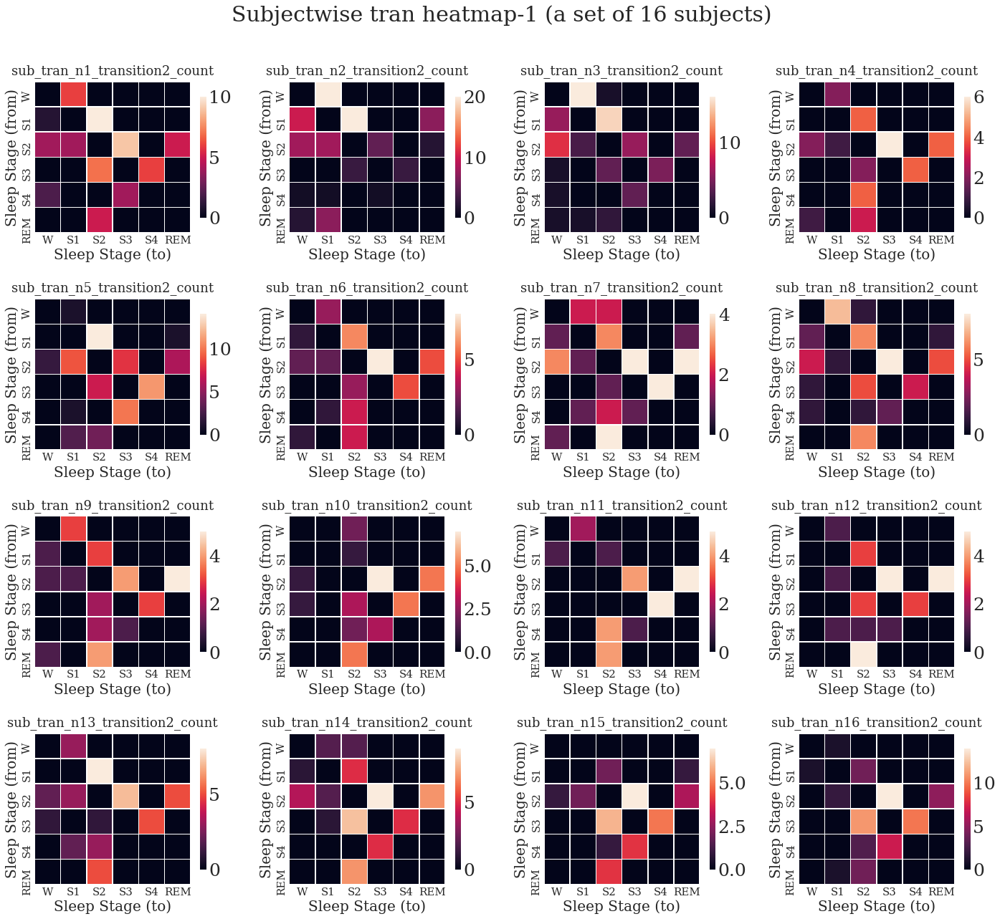

In [695]:
draw_all_heatmaps(all_metrix_files, cat="n", annot_type=annot_type)

# Extras

In [ ]:
fig, axes = plt.subplots(4, 4)
slp_lbl = list(sleep_stage_labels_dict.keys())

for i, dat_file in enumerate(all_metrix_files):
    dat = pd.read_csv(dat_file)
    # print(dat.iloc[:, 1:].dtypes)
    data = dat.iloc[:, 1:].values 
    slp_lbl_y = dat.iloc[:, 0].values 
    x, y = (int)(i/4), i%4 
    # print(i, x, y, data)
    sns.heatmap(data, linewidth=0.5, ax=axes[x, y])
    axes[x, y].set_title( (dat_file.split("/")[-1]).split(".")[0] )
    axes[x, y].set_ylabel("Sleep Stage (from)")
    axes[x, y].set_xlabel("Sleep Stage (to)")
    axes[x, y].set_yticklabels(slp_lbl_y)
    #axes[x, y].set_yticklabels(slp_lbl)
    axes[x, y].set_xticklabels(slp_lbl) 
fig.suptitle(' Set a Single Main Title for All the Subplots', va='top', fontsize=20, y=1.0) 
fig.savefig(f"{result_directory}/Analytical_Graphs/n_subjectwise_heatmap.png") 
fig.savefig(f"{result_directory}/Analytical_Graphs/n_subjectwise_heatmap.pdf") 
plt.tight_layout(pad=2.0)
plt.show()

In [78]:
# fig.suptitle?

### Markov model for transition matrix

In [ ]:
!pip install networkx
!pip install graphviz
# !pip install pygraphviz

In [421]:
# modules from this repository
from markovchain import MarkovChain
plt.rcParams["figure.figsize"] = (25,20)

In [422]:
all_metrix_files

['./Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n1_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n2_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n3_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n4_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n5_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n6_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n7_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n8_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n9_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n10_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n11_transition2_count.csv',
 './Results/CAP_Sleep/Transition_Matrices/all_tran_sub_n12_transition2_count.csv',
 './Results/C

In [424]:
# plt.rcParams["figure.figsize"] = (20,6)
# plt.rcParams["figure.figsize"] = (5,4)
plt.rcParams["figure.figsize"] = (25,20)
list(sleep_stage_names_dict.keys()), list(sleep_stage_labels_dict.keys())

(['W', 'S1', 'S2', 'S3', 'S4', 'R', 'MT'],
 ['W', 'S1', 'S2', 'S3', 'S4', 'REM', 'MT'])

In [426]:
# fig, axes = plt.subplots(4, 4)
# slp_lbl = list(sleep_stage_names_dict.keys())

# for i, dat_file in enumerate(all_metrix_files):
#     data = pd.read_csv(dat_file).values
#     x, y = (int)(i/4), i%4 
# #     print(i, x, y)
#     sns.heatmap(data, linewidth=0.5, ax=axes[x, y])
#     axes[x, y].set_title( (dat_file.split("/")[-1]).split(".")[0] )
#     axes[x, y].set_ylabel("Sleep Stage (from)")
#     axes[x, y].set_xlabel("Sleep Stage (to)")
#     axes[x, y].set_yticklabels(slp_lbl)
#     axes[x, y].set_xticklabels(slp_lbl) 
# fig.savefig(f"{result_directory}/Analytical_Graphs/n_subjectwise_heatmap.png") 
# fig.savefig(f"{result_directory}/Analytical_Graphs/n_subjectwise_heatmap.pdf") 
# plt.show()

In [433]:
plt.rcParams["figure.figsize"] = (5,4)
# plt.rcParams["figure.figsize"] = (25,20)

In [429]:
count_arr = pd.read_csv('./Results/Transition_Matrices/all_tran_sub_n1_transition_count.csv').values
count_arr

array([[ 0,  7,  0,  0,  0,  0,  0],
       [ 1,  0, 10,  0,  0,  0,  0],
       [ 4,  2,  0,  9,  0,  5,  3],
       [ 0,  0,  6,  0,  6,  0,  1],
       [ 2,  0,  0,  4,  0,  0,  0],
       [ 0,  0,  5,  0,  0,  0,  0],
       [ 0,  2,  2,  0,  0,  0,  0]], dtype=int64)

In [ ]:
mc = MarkovChain(count_arr, sleep_stage_labels) 
mc.draw("./all_annot_tDiagram_result_.png") 

In [434]:
proba_arr = pd.read_csv('./Results/Transition_Matrices/all_tran_sub_n1_transition_proba.csv').values
proba_arr

array([[0.   , 1.   , 0.   , 0.   , 0.   , 0.   , 0.   ],
       [0.091, 0.   , 0.909, 0.   , 0.   , 0.   , 0.   ],
       [0.174, 0.087, 0.   , 0.391, 0.   , 0.217, 0.13 ],
       [0.   , 0.   , 0.462, 0.   , 0.462, 0.   , 0.077],
       [0.333, 0.   , 0.   , 0.667, 0.   , 0.   , 0.   ],
       [0.   , 0.   , 1.   , 0.   , 0.   , 0.   , 0.   ],
       [0.   , 0.5  , 0.5  , 0.   , 0.   , 0.   , 0.   ]])

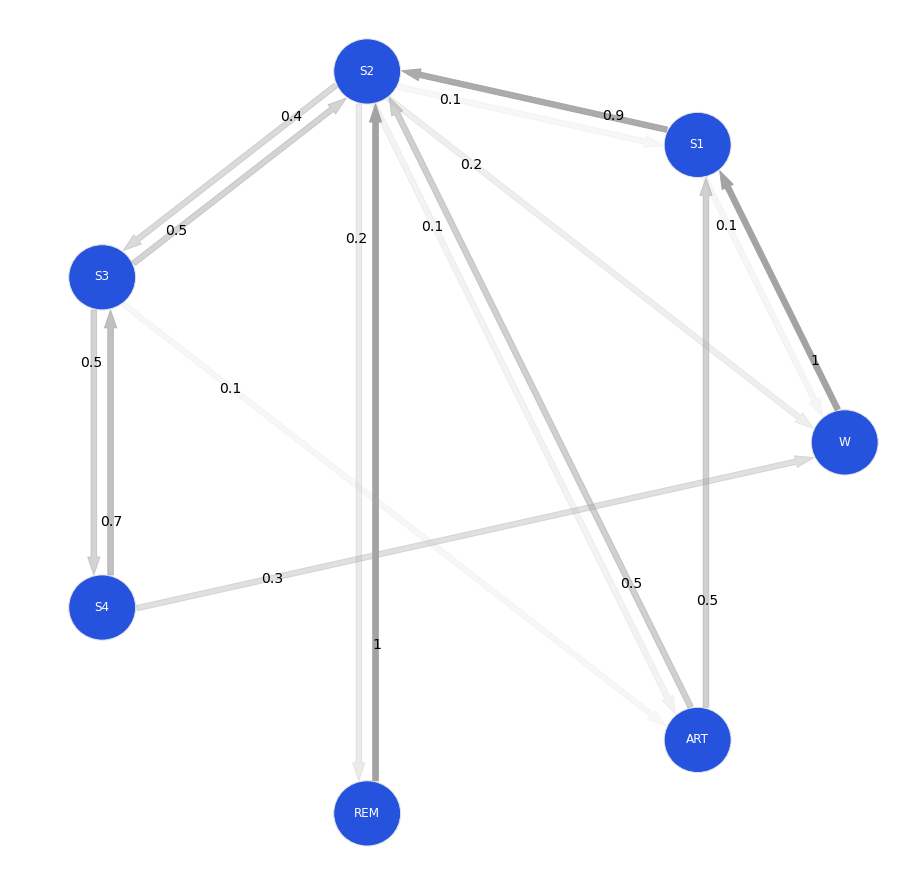

In [435]:
mc = MarkovChain(proba_arr, sleep_stage_labels) 
mc.draw("./all_annot_tDiagram_result_.png") 

### Visualise transition matrix - Network X

In [436]:
import networkx as nx

# create state space and initial state probabilities

states = ['sleeping', 'eating', 'pooping']
pi = [0.35, 0.35, 0.3]
state_space = pd.Series(pi, index=states, name='states')
print(state_space)
print(state_space.sum())

sleeping    0.35
eating      0.35
pooping     0.30
Name: states, dtype: float64
1.0


In [437]:
# create transition matrix
# equals transition probability matrix of changing states given a state
# matrix is size (M x M) where M is number of states

q_df = pd.DataFrame(columns=states, index=states)
q_df.loc[states[0]] = [0.4, 0.2, 0.4]
q_df.loc[states[1]] = [0.45, 0.45, 0.1]
q_df.loc[states[2]] = [0.45, 0.25, .3]

print(q_df)

q = q_df.values
print('\n', q, q.shape, '\n')
print(q_df.sum(axis=1))

         sleeping eating pooping
sleeping      0.4    0.2     0.4
eating       0.45   0.45     0.1
pooping      0.45   0.25     0.3

 [[0.4 0.2 0.4]
 [0.45 0.45 0.1]
 [0.45 0.25 0.3]] (3, 3) 

sleeping    1.0
eating      1.0
pooping     1.0
dtype: float64


In [438]:
from pprint import pprint 

# create a function that maps transition probability dataframe 
# to markov edges and weights

def _get_markov_edges(Q):
    edges = {}
    for col in Q.columns:
        for idx in Q.index:
            edges[(idx,col)] = Q.loc[idx,col]
    return edges

edges_wts = _get_markov_edges(q_df)
pprint(edges_wts)

{('eating', 'eating'): 0.45,
 ('eating', 'pooping'): 0.1,
 ('eating', 'sleeping'): 0.45,
 ('pooping', 'eating'): 0.25,
 ('pooping', 'pooping'): 0.3,
 ('pooping', 'sleeping'): 0.45,
 ('sleeping', 'eating'): 0.2,
 ('sleeping', 'pooping'): 0.4,
 ('sleeping', 'sleeping'): 0.4}


In [439]:
# create graph object
G = nx.MultiDiGraph()

# nodes correspond to states
# G.add_nodes_from(states_)
G.add_nodes_from(edges_wts)
print(f'Nodes:\n{G.nodes()}\n')

# edges represent transition probabilities
for k, v in edges_wts.items():
    tmp_origin, tmp_destination = k[0], k[1]
    G.add_edge(tmp_origin, tmp_destination, weight=v, label=v)
print(f'Edges:')
pprint(G.edges(data=True))    

pos = nx.drawing.nx_pydot.graphviz_layout(G, prog='dot')
nx.draw_networkx(G, pos)

# create edge labels for jupyter plot but is not necessary
edge_labels = {(n1,n2):d['label'] for n1,n2,d in G.edges(data=True)}
nx.draw_networkx_edge_labels(G , pos, edge_labels=edge_labels)
nx.drawing.nx_pydot.write_dot(G, 'pet_dog_markov.dot')

Nodes:
[('sleeping', 'sleeping'), ('eating', 'sleeping'), ('pooping', 'sleeping'), ('sleeping', 'eating'), ('eating', 'eating'), ('pooping', 'eating'), ('sleeping', 'pooping'), ('eating', 'pooping'), ('pooping', 'pooping')]

Edges:
OutMultiEdgeDataView([('sleeping', 'sleeping', {'weight': 0.4, 'label': 0.4}), ('sleeping', 'eating', {'weight': 0.2, 'label': 0.2}), ('sleeping', 'pooping', {'weight': 0.4, 'label': 0.4}), ('eating', 'sleeping', {'weight': 0.45, 'label': 0.45}), ('eating', 'eating', {'weight': 0.45, 'label': 0.45}), ('eating', 'pooping', {'weight': 0.1, 'label': 0.1}), ('pooping', 'sleeping', {'weight': 0.45, 'label': 0.45}), ('pooping', 'eating', {'weight': 0.25, 'label': 0.25}), ('pooping', 'pooping', {'weight': 0.3, 'label': 0.3})])


ModuleNotFoundError: No module named 'pydot'

In [440]:
# plt.rcParams["figure.figsize"] = (25,20)

plt.rcParams["figure.figsize"] = (10,6)

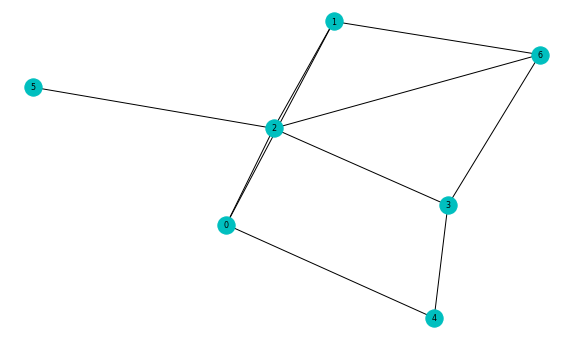

In [441]:
import networkx as nx

import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt

def read_graph():
    graph_adjacency_list = { }
    for line in open("input.txt"):
        line = map(int, line.rstrip("\t\r\n").split("\t"))
        graph_adjacency_list.update({ line[0]: { e: 1 for e in line[1:] } })

    return graph_adjacency_list

graph_data = count_arr #read_graph()
G = nx.Graph(graph_data)
nx.draw_networkx(G, with_labels = True, node_color = "c", edge_color = "k", font_size = 8)

plt.axis('off')
plt.draw()
plt.savefig("graph.pdf")

In [442]:
sleep_stage_labels_dict

{'W': 0, 'S1': 1, 'S2': 2, 'S3': 3, 'S4': 4, 'REM': 5, 'MT': 6}

In [443]:
slp_stgs = list(sleep_stage_labels_dict.keys())
slp_stgs

['W', 'S1', 'S2', 'S3', 'S4', 'REM', 'MT']

In [444]:
tst_arr = pd.read_csv('./Results/Transition_Matrices/all_tran_sub_n1_transition_count.csv')
tst_arr.index = slp_stgs
tst_arr

,W,S1,S2,S3,S4,REM,MT
W,0,7,0,0,0,0,0
S1,1,0,10,0,0,0,0
S2,4,2,0,9,0,5,3
S3,0,0,6,0,6,0,1
S4,2,0,0,4,0,0,0
REM,0,0,5,0,0,0,0
MT,0,2,2,0,0,0,0


In [445]:
tst_arr.at['W', 'S1']

7

In [446]:
E = []
for i in slp_stgs:
    for j in slp_stgs:
        # print(tst_arr.at[i, j])
        if tst_arr.at[i, j]>0:
            E.append((i, j, tst_arr.at[i, j]))
        
E

[('W', 'S1', 7),
 ('S1', 'W', 1),
 ('S1', 'S2', 10),
 ('S2', 'W', 4),
 ('S2', 'S1', 2),
 ('S2', 'S3', 9),
 ('S2', 'REM', 5),
 ('S2', 'MT', 3),
 ('S3', 'S2', 6),
 ('S3', 'S4', 6),
 ('S3', 'MT', 1),
 ('S4', 'W', 2),
 ('S4', 'S3', 4),
 ('REM', 'S2', 5),
 ('MT', 'S1', 2),
 ('MT', 'S2', 2)]

In [447]:
V = slp_stgs.copy()
V

['W', 'S1', 'S2', 'S3', 'S4', 'REM', 'MT']

In [448]:
# E = [('A', 'B', 6), ('B', 'C', 7), ('C', 'D', 8), ('D','E', 4), ('E', 'F', 9), ('F','A', 6)]
E

[('W', 'S1', 7),
 ('S1', 'W', 1),
 ('S1', 'S2', 10),
 ('S2', 'W', 4),
 ('S2', 'S1', 2),
 ('S2', 'S3', 9),
 ('S2', 'REM', 5),
 ('S2', 'MT', 3),
 ('S3', 'S2', 6),
 ('S3', 'S4', 6),
 ('S3', 'MT', 1),
 ('S4', 'W', 2),
 ('S4', 'S3', 4),
 ('REM', 'S2', 5),
 ('MT', 'S1', 2),
 ('MT', 'S2', 2)]

In [449]:
G =  nx.MultiDiGraph() 

In [450]:
G.add_nodes_from(V)

In [451]:
G.add_weighted_edges_from(E)

In [452]:
G.nodes

NodeView(('W', 'S1', 'S2', 'S3', 'S4', 'REM', 'MT'))

In [453]:
G.edges

OutMultiEdgeView([('W', 'S1', 0), ('S1', 'W', 0), ('S1', 'S2', 0), ('S2', 'W', 0), ('S2', 'S1', 0), ('S2', 'S3', 0), ('S2', 'REM', 0), ('S2', 'MT', 0), ('S3', 'S2', 0), ('S3', 'S4', 0), ('S3', 'MT', 0), ('S4', 'W', 0), ('S4', 'S3', 0), ('REM', 'S2', 0), ('MT', 'S1', 0), ('MT', 'S2', 0)])

In [454]:
# G.__dict__
# nx.draw_networkx_edge_labels?

In [455]:
pos = {'W':[1,1], 'S1':[2,2], 'S2':[3,1], 'S3':[3, 2], 'S4':[3,3], 'MT':[1,3], 'REM':[4,2]}

In [456]:
weight = nx.get_edge_attributes(G, 'weight')
weight

{('W', 'S1', 0): 7,
 ('S1', 'W', 0): 1,
 ('S1', 'S2', 0): 10,
 ('S2', 'W', 0): 4,
 ('S2', 'S1', 0): 2,
 ('S2', 'S3', 0): 9,
 ('S2', 'REM', 0): 5,
 ('S2', 'MT', 0): 3,
 ('S3', 'S2', 0): 6,
 ('S3', 'S4', 0): 6,
 ('S3', 'MT', 0): 1,
 ('S4', 'W', 0): 2,
 ('S4', 'S3', 0): 4,
 ('REM', 'S2', 0): 5,
 ('MT', 'S1', 0): 2,
 ('MT', 'S2', 0): 2}

In [457]:
weight = {}
for u, v, keys, data in G.edges(keys=True, data=True):
    if 'weight' in data:
        if (u, v) in weight:
            weight[(u, v)].append(data['weight'])
        else:
            weight[(v, u)] = [data['weight']]
weight

{('S1', 'W'): [7, 1],
 ('S2', 'S1'): [10, 2],
 ('W', 'S2'): [4],
 ('S3', 'S2'): [9, 6],
 ('REM', 'S2'): [5, 5],
 ('MT', 'S2'): [3, 2],
 ('S4', 'S3'): [6, 4],
 ('MT', 'S3'): [1],
 ('W', 'S4'): [2],
 ('S1', 'MT'): [2]}

In [458]:
arc_size = 0.1

{('S1', 'W'): Text(1.5, 1.5, '[7, 1]'),
 ('S2', 'S1'): Text(2.5, 1.5, '[10, 2]'),
 ('W', 'S2'): Text(2.0, 1.0, '[4]'),
 ('S3', 'S2'): Text(3.0, 1.5, '[9, 6]'),
 ('REM', 'S2'): Text(3.5, 1.5, '[5, 5]'),
 ('MT', 'S2'): Text(2.0, 2.0, '[3, 2]'),
 ('S4', 'S3'): Text(3.0, 2.5, '[6, 4]'),
 ('MT', 'S3'): Text(2.0, 2.5, '[1]'),
 ('W', 'S4'): Text(2.0, 2.0, '[2]'),
 ('S1', 'MT'): Text(1.5, 2.5, '[2]')}

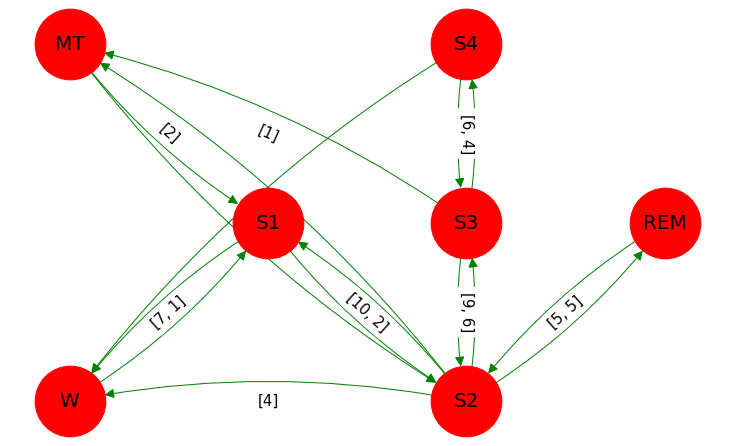

In [459]:
nx.draw(G, pos=pos, with_labels=True, node_size=5000, node_color='r', edge_color='g', arrowsize=20, font_size=20, connectionstyle=f"arc3,rad={arc_size}")
# nx.draw_networkx_edge_labels(G, pos=nx.spring_layout(G), edge_labels=weight, font_size=15) #nx.spring_layout(G)
nx.draw_networkx_edge_labels(G, pos, edge_labels=weight, font_size=15) #nx.spring_layout(G)

In [460]:
nx.draw_networkx_nodes?

Signature:
nx.draw_networkx_nodes(
    G,
    pos,
    nodelist=None,
    node_size=300,
    node_color='#1f78b4',
    node_shape='o',
    alpha=None,
    cmap=None,
    vmin=None,
    vmax=None,
    ax=None,
    linewidths=None,
    edgecolors=None,
    label=None,
)
Docstring:
Draw the nodes of the graph G.

This draws only the nodes of the graph G.

Parameters
----------
G : graph
   A networkx graph

pos : dictionary
   A dictionary with nodes as keys and positions as values.
   Positions should be sequences of length 2.

ax : Matplotlib Axes object, optional
   Draw the graph in the specified Matplotlib axes.

nodelist : list, optional
   Draw only specified nodes (default G.nodes())

node_size : scalar or array
   Size of nodes (default=300).  If an array is specified it must be the
   same length as nodelist.

node_color : color or array of colors (default='#1f78b4')
   Node color. Can be a single color or a sequence of colors with the same
   length as nodelist. Color can be st

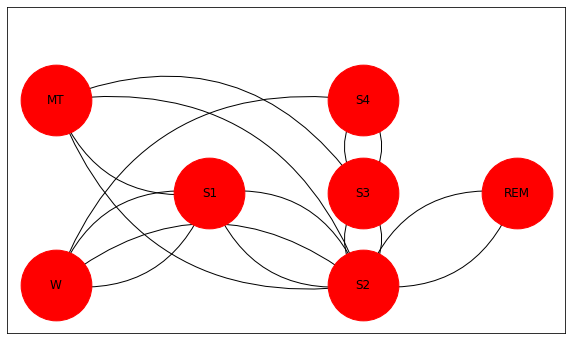

In [461]:
fig, ax = plt.subplots()
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=5000, node_color='#ff0000')
nx.draw_networkx_labels(G, pos, ax=ax)
nx.draw_networkx_edges(G, pos, connectionstyle="arc3,rad=0.4") 

TypeError: draw_networkx_edges() got an unexpected keyword argument 'with_labels'

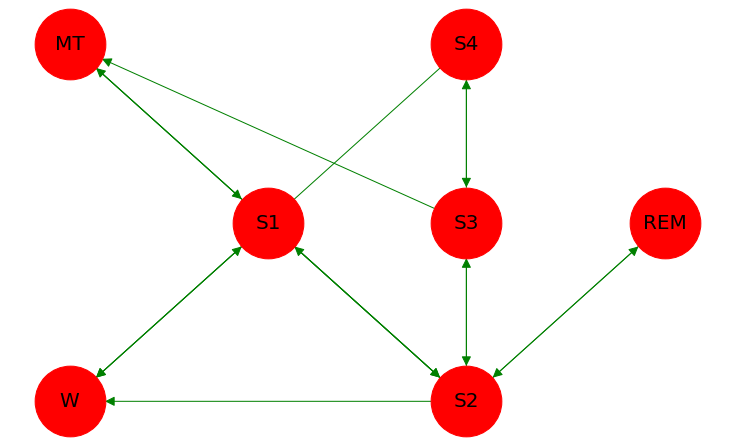

In [462]:
nx.draw(G, pos=pos, with_labels=True,node_size=5000, node_color='r', edge_color='g', arrowsize=20, font_size=20)
# nx.draw_networkx_edge_labels(G, pos=nx.spring_layout(G), edge_labels=weight, font_size=15) #nx.spring_layout(G)
# nx.draw_networkx_edge_labels(G, pos, edge_labels=weight, font_size=15) #nx.spring_layout(G)


curved_edges = G.edges# [edge for edge in G.edges() if reversed(edge) in G.edges()]
# straight_edges = list(set(G.edges()) - set(curved_edges))
# nx.draw_networkx_edges(G, pos, ax=ax, edgelist=straight_edges)
arc_rad = 0.25
nx.draw_networkx_edges(G, pos, with_labels=True, connectionstyle="arc3,rad=0.4")

C:\Users\aliem\.conda\envs\MyPython37Work\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  if __name__ == '__main__':


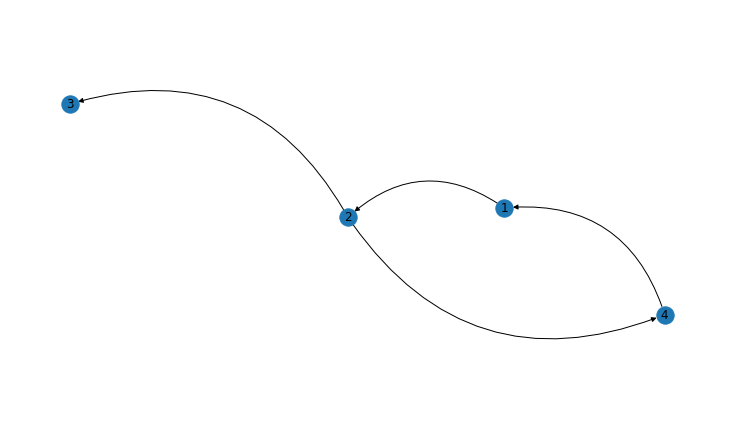

In [463]:
G = nx.DiGraph()

pos = nx.spring_layout(G)
G.add_nodes_from([1, 2, 3, 4])
G.add_edges_from([(1, 2), (2, 4), (2, 3), (4, 1)])

nx.draw(G, with_labels=True, connectionstyle="arc3,rad=0.4")

plt.show()


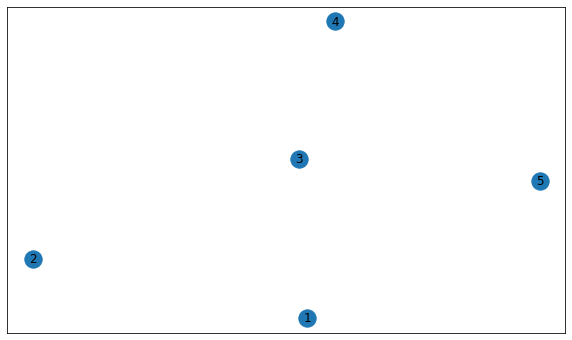

In [464]:
G = nx.DiGraph()
edge_list = [(1,2,{'w':'A1'}),(2,1,{'w':'A2'}),(2,3,{'w':'B'}),(3,1,{'w':'C'}),
             (3,4,{'w':'D1'}),(4,3,{'w':'D2'}),(1,5,{'w':'E1'}),(5,1,{'w':'E2'}),
             (3,5,{'w':'F'}),(5,4,{'w':'G'})]
G.add_edges_from(edge_list)
pos=nx.spring_layout(G,seed=5)
fig, ax = plt.subplots()
nx.draw_networkx_nodes(G, pos, ax=ax)
nx.draw_networkx_labels(G, pos, ax=ax)
fig.savefig("1.png", bbox_inches='tight',pad_inches=0)

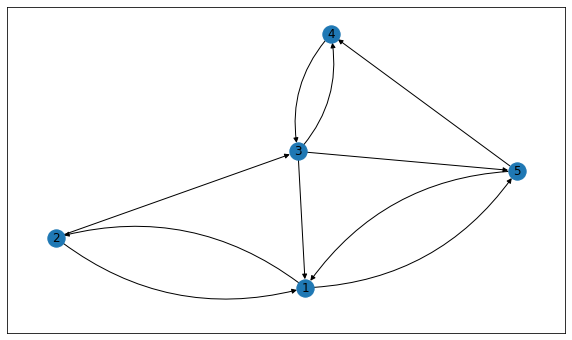

In [465]:
G = nx.DiGraph()
edge_list = [(1,2,{'w':'A1'}),(2,1,{'w':'A2'}),(2,3,{'w':'B'}),(3,1,{'w':'C'}),
             (3,4,{'w':'D1'}),(4,3,{'w':'D2'}),(1,5,{'w':'E1'}),(5,1,{'w':'E2'}),
             (3,5,{'w':'F'}),(5,4,{'w':'G'})]
G.add_edges_from(edge_list)
pos=nx.spring_layout(G,seed=5)
fig, ax = plt.subplots()
nx.draw_networkx_nodes(G, pos, ax=ax)
nx.draw_networkx_labels(G, pos, ax=ax)

curved_edges = [edge for edge in G.edges() if reversed(edge) in G.edges()]
straight_edges = list(set(G.edges()) - set(curved_edges))
nx.draw_networkx_edges(G, pos, ax=ax, edgelist=straight_edges)
arc_rad = 0.25
nx.draw_networkx_edges(G, pos, ax=ax, edgelist=curved_edges, connectionstyle=f'arc3, rad = {arc_rad}')
fig.savefig("2.png", bbox_inches='tight',pad_inches=0)

### Visualise transition matrix - Example

In [ ]:
!pip install networkx
!pip install graphviz
# !pip install pygraphviz

In [ ]:
# !pip install networkx
# !pip install graphviz
# !pip install pygraphviz

# modules from this repository
from markovchain import MarkovChain

In [469]:
directory, result_directory

('E:/aliem/CAP_Sleep_Dataset', './Results/CAP_Sleep')

In [471]:
trans_file_path = f"{result_directory}/Transition_Matrices/all_annot_transition{tran_step}"
count, proba, dura = pd.read_csv(f"{trans_file_path}_count.csv"), pd.read_csv(f"{trans_file_path}_proba.csv"), pd.read_csv(f"{trans_file_path}_dura.csv") 


In [481]:
proba

,From,W,S1,S2,S3,S4,REM,MT
0,W,0.946284,0.042474,0.010326,0.000305,0.000051,0.000560,0.000000
1,S1,0.035518,0.824465,0.130417,0.000274,0.000274,0.007131,0.001920
2,S2,0.006527,0.003403,0.966234,0.013920,0.000044,0.007407,0.002464
3,S3,0.002401,0.000612,0.026087,0.938974,0.028865,0.000377,0.002684
4,S4,0.003315,0.000889,0.004852,0.012574,0.974609,0.000202,0.003558
5,REM,0.007238,0.006137,0.016470,0.000157,0.000000,0.969420,0.000577
6,MT,0.213720,0.160950,0.422164,0.065963,0.023747,0.005277,0.108179


In [482]:
sleep_stage_labels

['W', 'S1', 'S2', 'S3', 'S4', 'REM', 'ART']

In [483]:
proba_arr = proba.iloc[:, 1:].values
# count_arr = proba.values
proba_arr

array([[0.946, 0.042, 0.01 , 0.   , 0.   , 0.001, 0.   ],
       [0.036, 0.824, 0.13 , 0.   , 0.   , 0.007, 0.002],
       [0.007, 0.003, 0.966, 0.014, 0.   , 0.007, 0.002],
       [0.002, 0.001, 0.026, 0.939, 0.029, 0.   , 0.003],
       [0.003, 0.001, 0.005, 0.013, 0.975, 0.   , 0.004],
       [0.007, 0.006, 0.016, 0.   , 0.   , 0.969, 0.001],
       [0.214, 0.161, 0.422, 0.066, 0.024, 0.005, 0.108]])

C:\Users\aliem\Desktop\aliem\My Research\HML_IHC_Sleep_Data_Analysis\markovchain.py:228: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


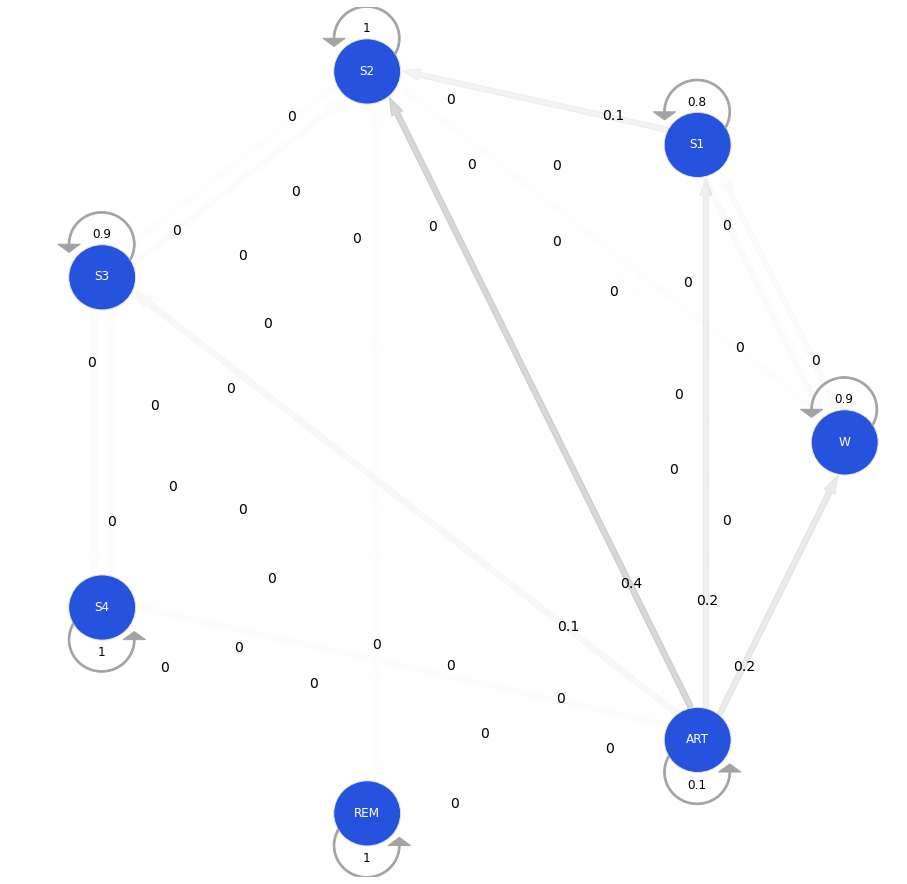

In [492]:
mc = MarkovChain(proba_arr, sleep_stage_labels)
mc.draw(f"{result_directory}/all_annot_tDiagram.png")

In [487]:
trans_file_path = f"{result_directory}/Transition_Matrices/all_tran_transition{tran_step}"
count2, proba2, dura2 = pd.read_csv(f"{trans_file_path}_count.csv"), pd.read_csv(f"{trans_file_path}_proba.csv"), pd.read_csv(f"{trans_file_path}_dura.csv") 


In [493]:
proba2

,From,W,S1,S2,S3,S4,REM,MT
0,W,0.079337,0.727986,0.176983,0.005231,0.000872,0.009590,0.000000
1,S1,0.202344,0.000000,0.742969,0.001563,0.001563,0.040625,0.010937
2,S2,0.192960,0.100826,0.000000,0.412429,0.001304,0.219470,0.073012
3,S3,0.039352,0.010031,0.427469,0.000000,0.472994,0.006173,0.043981
4,S4,0.130573,0.035032,0.191083,0.495223,0.000000,0.007962,0.140127
5,REM,0.236707,0.200686,0.538593,0.005146,0.000000,0.000000,0.018868
6,MT,0.239645,0.180473,0.473373,0.073964,0.026627,0.005917,0.000000


In [494]:
sleep_stage_labels

['W', 'S1', 'S2', 'S3', 'S4', 'REM', 'ART']

In [495]:
proba_arr2 = proba2.iloc[:, 1:].values
# proba_arr2 = proba2.values
proba_arr2

array([[0.079, 0.728, 0.177, 0.005, 0.001, 0.01 , 0.   ],
       [0.202, 0.   , 0.743, 0.002, 0.002, 0.041, 0.011],
       [0.193, 0.101, 0.   , 0.412, 0.001, 0.219, 0.073],
       [0.039, 0.01 , 0.427, 0.   , 0.473, 0.006, 0.044],
       [0.131, 0.035, 0.191, 0.495, 0.   , 0.008, 0.14 ],
       [0.237, 0.201, 0.539, 0.005, 0.   , 0.   , 0.019],
       [0.24 , 0.18 , 0.473, 0.074, 0.027, 0.006, 0.   ]])

C:\Users\aliem\Desktop\aliem\My Research\HML_IHC_Sleep_Data_Analysis\markovchain.py:228: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


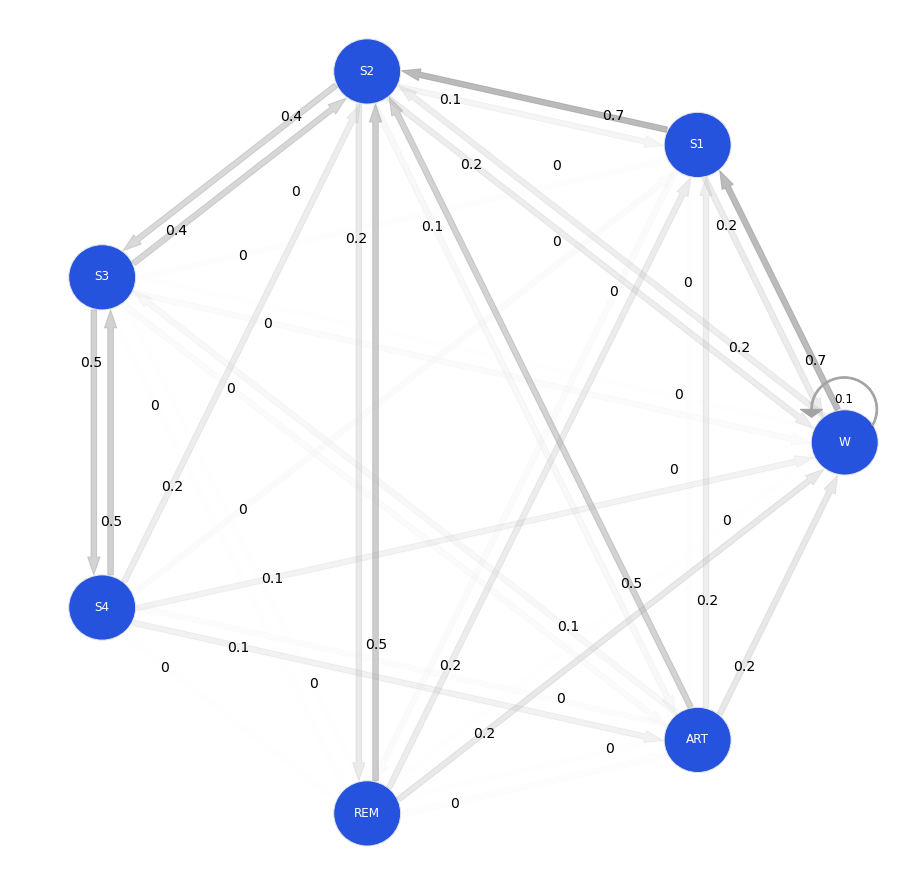

In [496]:
mc = MarkovChain(proba_arr2, sleep_stage_labels)
mc.draw("./all_tran_tDiagram_result_.png")

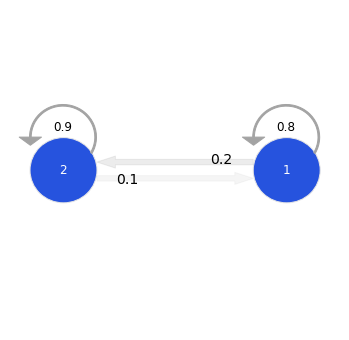

In [497]:
P = np.array([[0.8, 0.2], [0.1, 0.9]]) # Transition matrix
mc = MarkovChain(P, ['1', '2'])
mc.draw("./markov-chain-two-states.png")
# mc.draw("./markov-chain-two-states.pdf")

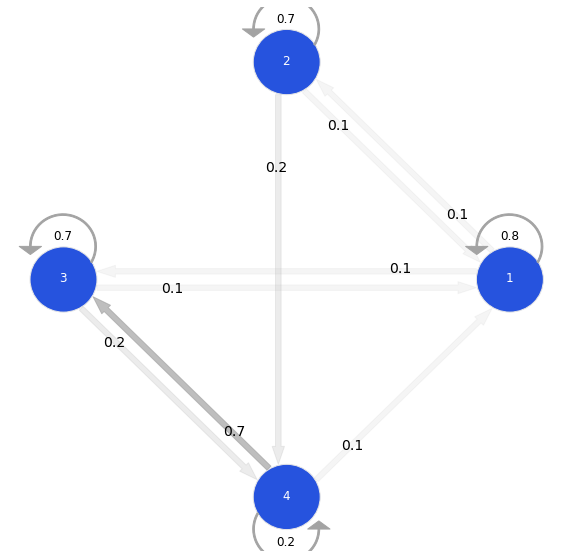

In [498]:
P = np.array([
    [0.8, 0.1, 0.1, 0.0], 
    [0.1, 0.7, 0.0, 0.2],
    [0.1, 0.0, 0.7, 0.2],
    [0.1, 0.0, 0.7, 0.2]
])
mc = MarkovChain(P, ['1', '2', '3', '4'])
mc.draw("./markov-chain-four-states.png")

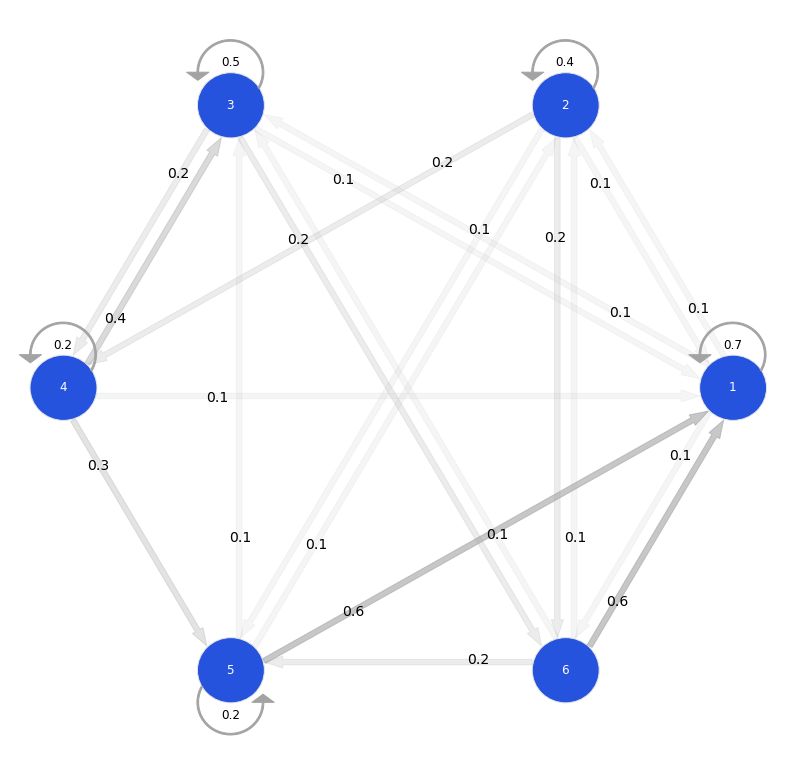

In [499]:
P = np.array([
    [0.7, 0.1, 0.1, 0.0, 0.0, 0.1], 
    [0.1, 0.4, 0.0, 0.2, 0.1, 0.2],
    [0.1, 0.0, 0.5, 0.2, 0.0, 0.2],
    [0.1, 0.0, 0.4, 0.2, 0.3, 0.0],
    [0.6, 0.1, 0.1, 0.0, 0.2, 0.0], 
    [0.6, 0.1, 0.1, 0.0, 0.2, 0.0], 
])
mc = MarkovChain(P, ['1', '2', '3', '4', '5', '6'])
mc.draw("./markov-chain-six-states.png")

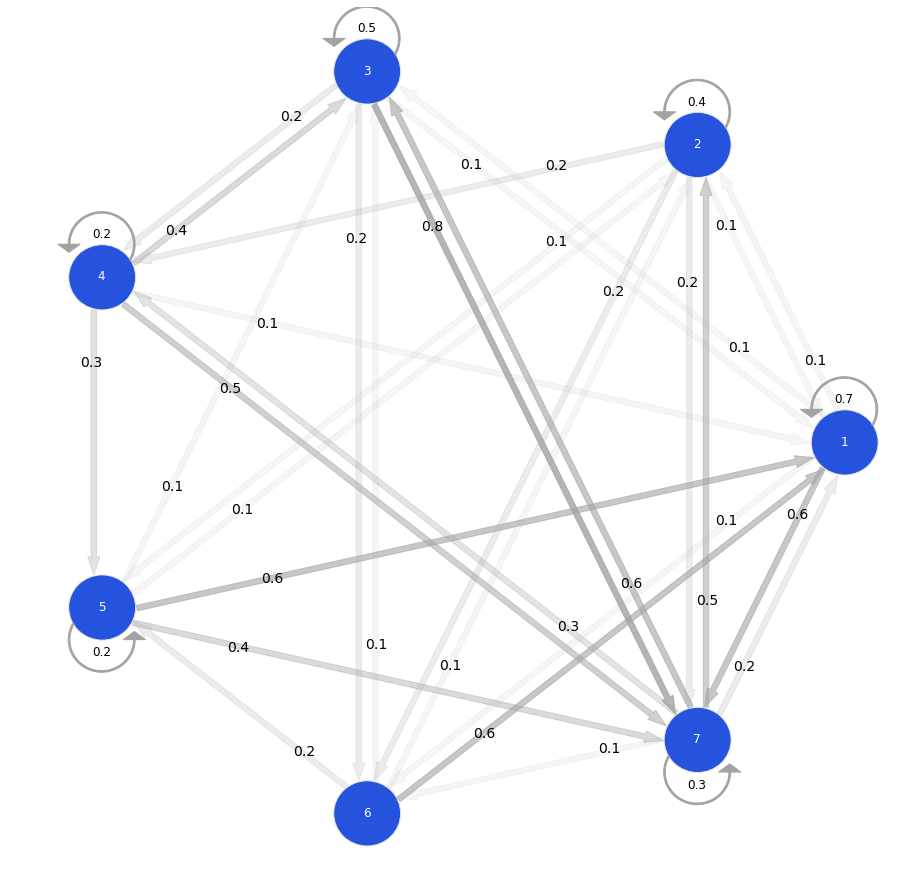

In [500]:
P = np.array([
    [0.7, 0.1, 0.1, 0.0, 0.0, 0.1, 0.6], 
    [0.1, 0.4, 0.0, 0.2, 0.1, 0.2, 0.2],
    [0.1, 0.0, 0.5, 0.2, 0.0, 0.2, 0.8],
    [0.1, 0.0, 0.4, 0.2, 0.3, 0.0, 0.5],
    [0.6, 0.1, 0.1, 0.0, 0.2, 0.0, 0.4], 
    [0.6, 0.1, 0.1, 0.0, 0.2, 0.0, 0.0], 
    [0.2, 0.5, 0.6, 0.3, 0.0, 0.1, 0.3], 
])
mc = MarkovChain(P, ['1', '2', '3', '4', '5', '6', '7'])
mc.draw("./markov-chain-seven-states.png")

## Rough

In [163]:
directory = result_directory
directory, f"{directory}/Demography_Details.csv"

('./Results/CAP_Sleep', './Results/CAP_Sleep/Demography_Details.csv')

In [164]:
df = pd.read_csv(f"{directory}/Demography_Details.csv")
df

,File_Name,Category,Subject_ID,Gender,Age
0,brux1,brux,1,M,34
1,brux2,brux,2,M,23
2,sdb1,sdb,1,M,65
3,sdb2,sdb,2,M,77
4,sdb3,sdb,3,M,78
...,...,...,...,...,...
103,n12,n,12,M,29
104,n13,n,13,F,24
105,n14,n,14,F,35
106,n15,n,15,M,34


In [ ]:
df["File_Name1"] = df["Category"].str.cat(df["Subject_ID"].astype(str), sep = "")
df.insert(loc=0, column="File_Name", value=df["File_Name1"].values.tolist())
df = df.drop("File_Name1", axis=1)
df

In [ ]:
df.dtypes

In [ ]:
df['Category'] = df['Category'].apply(str.lower)
df

In [ ]:
df[["dummy1", "Disease_Name1", "Subject_ID1", "dummy2"]] = df['Category_Short'].str.split(r"([a-z]+)([0-9]+)", expand=True)
# df[["Disease_Name", "Subject_ID"]] = df['Pat_ID'].split(r"([a-z]+)([0-9]+)", expand=True)
# df = df.drop('Pat_ID', axis=1)
# df = df.drop("dummy", axis=1)
df = df.drop(['Category', "dummy1", "dummy2"], axis=1)
df

In [ ]:
df.insert(loc=0, column="Subject_ID", value=df["Subject_ID1"].values.tolist())
df = df.drop("Subject_ID1", axis=1)
df.insert(loc=0, column="Category", value=df["Disease_Name1"].values.tolist())
df = df.drop("Disease_Name1", axis=1)
df

In [165]:
f"{directory}/Demography_Details.csv"

'./Results/CAP_Sleep/Demography_Details.csv'

In [ ]:
df.to_csv(f"{directory}/Demography_Details.csv", index=False)

## Extra

In [ ]:
import matplotlib.pyplot as plt

from visbrain.io import write_fig_hyp, read_hypno, download_file

In [ ]:
grid = True     # display the grid
ascolor = True  # plt as color or in black and white
file = None     # Name of the file to be saved example : 'myfile.png'

In [ ]:
path_to_hypno = download_file("s101_jbe.hyp", astype='example_data')
data, sf = read_hypno(path_to_hypno)

In [ ]:
write_fig_hyp(data, sf, grid=grid, ascolor=ascolor, file=file)
plt.show()

In [ ]:
import yasa
import numpy as np
import matplotlib.pyplot as plt
hypno = np.loadtxt("https://github.com/raphaelvallat/yasa/raw/master/notebooks/data_full_6hrs_100Hz_hypno_30s.txt")
fig, ax = plt.subplots(1, 1, figsize=(7, 3), constrained_layout=True)
ax = yasa.plot_hypnogram(hypno, fill_color="gainsboro", ax=ax)